# Hyperparameter Tuning


Code in raw mode after getting results to reduce kernel workload when running tuning.

In [1]:
import torch
print("Is CUDA available: ", torch.cuda.is_available())
print("CUDA Version: ", torch.version.cuda)
print("Number of GPUs available: ", torch.cuda.device_count())
for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: ", torch.cuda.get_device_name(i))


Is CUDA available:  True
CUDA Version:  11.7
Number of GPUs available:  1
GPU 0:  NVIDIA GeForce GTX 1080


In [2]:
import torch
x = torch.rand(5, 5).cuda()
print(x)


tensor([[0.0212, 0.2698, 0.6721, 0.0770, 0.3349],
        [0.2946, 0.8315, 0.2611, 0.5819, 0.1352],
        [0.7926, 0.9300, 0.2441, 0.9805, 0.4160],
        [0.8445, 0.3119, 0.8168, 0.5205, 0.0933],
        [0.6530, 0.1358, 0.1721, 0.1357, 0.9124]], device='cuda:0')


In [3]:
import time
import copy
import logging
import networkx
from networkx import convert_matrix
from typing import NamedTuple, Optional, Tuple, List, Dict, TypeVar, TypedDict, cast

import numpy
import gym
from gym import spaces
from gym.utils import seeding

import plotly.graph_objects as go
from plotly.subplots import make_subplots

from cyberbattle._env.shared_cyberbattle_env import EnvironmentBounds, AttackerGoal, DefenderGoal, DefenderConstraint
from cyberbattle._env.defender import DefenderAgent,ScanAndReimageCompromisedMachines
from cyberbattle.simulation.model import PortName, PrivilegeLevel
from cyberbattle.simulation import commandcontrol, model, actions
from cyberbattle._env.discriminatedunion import DiscriminatedUnion
from cyberbattle.agents.baseline import agent_wrapper as w
import cyberbattle.agents.baseline.learner as learner
from cyberbattle.agents.baseline.learner import Learner
import cyberbattle.agents.baseline.agent_tabularqlearning as a
import cyberbattle.agents.baseline.agent_ddql as ddqla
import cyberbattle.agents.baseline.agent_dql as dqla
from cyberbattle.defender_agents.trainedDefender import *
import random

In [4]:
random.seed(120394016)
%matplotlib inline
import cyberbattle.agents.baseline.agent_tabularqlearning as a
import cyberbattle.agents.baseline.learner as learner
from cyberbattle.agents.baseline.agent_wrapper import Verbosity
#ql
iteration_count = 10
training_episode_count = 10
eval_episode_count = 20
gamma_sweep = [
    0.015,  # about right
]

In [5]:
import gym

# Create an instance of the CyberBattleChain environment without the defender
gym_env = gym.make('CyberBattleChain-v0',
    size=12,
    attacker_goal=AttackerGoal(
        own_atleast=0,
        own_atleast_percent=1.0
    ),
    defender_constraint=DefenderConstraint(
        maintain_sla=0.80
    )
)

defender_name = "DefenderName"  
defender_agent = DefenderWrapper(gym_env,defender_name)

Generated nodes:
[('start', {'data': NodeInfo(services=[], vulnerabilities={'ScanExplorerRecentFiles': VulnerabilityInfo(description='Scan Windows Explorer recent files for possible references to other machines', type=<VulnerabilityType.LOCAL: 1>, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa4fefe7f0>, precondition=<cyberbattle.simulation.model.Precondition object at 0x7faa5efc4640>, rates=Rates(probingDetectionRate=0.0, exploitDetectionRate=0.0, successRate=1.0), URL='', cost=1.0, reward_string='Found a reference to a remote Linux node in bash history')}, value=0, properties=[], firewall=FirewallConfiguration(outgoing=[FirewallRule(port='RDP', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='SSH', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='HTTPS', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='HTTP', permission=<RulePermission.ALLOW: 0>, reason='')], incoming=[FirewallRule(port='RDP', permis

In [6]:
ep = w.EnvironmentBounds.of_identifiers(
    maximum_total_credentials=22,
    maximum_node_count=22,
    identifiers=gym_env.identifiers
)
#cyberbattlechain_defender.render_as_fig()

In [7]:
statespace = w.HashEncoding(ep, [
            # Feature_discovered_node_count(),
            # Feature_discovered_credential_count(),
            w.Feature_discovered_ports_sliding(ep),
            w.Feature_discovered_nodeproperties_sliding(ep),
            w.Feature_discovered_notowned_node_count(ep, 3)
        ], 5000)  

actionspace = w.RavelEncoding(ep, [
            w.Feature_active_node_properties(ep)])
print(statespace)
print(actionspace)
q_matrix = DefenderQMatrix(statespace, actionspace,gym_env)
learner2 = DefenderQLearner(gym_env, defender_agent, ep, q_matrix, epsilon=0.9, gamma=0.015, learning_rate=.07)

MultiDiscrete([5000])
MultiDiscrete([16384])


## Define a function that accepts hyperparameters as arguments, creates a new learner with those hyperparameters, and then runs the training.

After training, evaluate the performance of the learner 

Keep track of the best-performing set of hyperparameters.

In [8]:
import torch

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


Using device: cuda:0


In [9]:
def run_training_with_hyperparameters(gym_env, environment_properties, statespace, actionspace, 
                                      epsilon, gamma, learning_rate, epsilon_exponential_decay, epsilon_minimum, episode_count, iteration_count, epsilon_multdecay):
    q_matrix = DefenderQMatrix(statespace, actionspace, gym_env)
    learner = DefenderQLearner(gym_env, defender_agent, environment_properties, q_matrix,
                               epsilon=epsilon, gamma=gamma, learning_rate=learning_rate)
    
    trained_defender = epsilon_greedy_defender_training(
        cyberbattle_gym_env=gym_env,
        environment_properties=environment_properties,
        learner=learner,
        episode_count=episode_count,  
        iteration_count=iteration_count,  
        epsilon=epsilon,
        epsilon_exponential_decay=epsilon_exponential_decay,
        epsilon_minimum=epsilon_minimum,
        epsilon_multdecay=epsilon_multdecay,
        verbosity=logging.INFO,
        render=True,
        plot_episodes_length=True,
        title="Defender Q-Learning Training"
    )
    total_reward = sum([sum(rewards) for rewards in trained_defender['all_episodes_rewards']])
    return total_reward

In [10]:
#first
epsilon_values = list(np.linspace(0, 1, 10))
gamma_values = list(np.linspace(0.01, 0.1, 10))
epsilon_multdecay_values = list(np.linspace(0.5, 1, 10))
learning_rate_values = list(np.linspace(0.05, 1, 20))
epsilon_decay_values=list(np.linspace(1000,5000,10))
epsilon_minimum_values=list(np.linspace(0,0.1,10))
episode_count_list = [25,50,100]
iteration_count_list = [25,50,100,150,200]
num_iterations = 10                          

In [11]:
#2nd ajsuting after getting first 2 results
epsilon_values = list(np.linspace(0, 1, 10))
gamma_values = list(np.linspace(0.05, 0.1, 5))
learning_rate_values = list(np.linspace(0.3, 0.4, 5))
epsilon_decay_values = list(np.linspace(2333, 5000, 5))
epsilon_minimum_values = list(np.linspace(0.04, 0.7, 5))
epsilon_multdecay_values = list(np.linspace(0.5, 1, 5))
n=3

In [12]:
#grid search for each separately
epsilon = np.linspace(0.66666666666666,0.77777777777,10)
gamma=np.linspace(0.05,0.09,10)
learning_rate=np.linspace(0.3,.35,10)
epsilon_decay=np.linspace(2333.33333,5000,20)
epsilon_minimum=np.linspace(0.044444444,.07777777,30)
episode_count=50
iteration_count=200
epsilon_multdecay=np.linspace(0.75,0.875,10)

First run

Best Reward: 57290

Best Hyperparameters: {'epsilon': 0.7777777777777777, 'gamma': 0.09000000000000001, 'learning_rate': 0.3, 'epsilon_decay': 2333.3333333333335, 'epsilon_minimum': 0.044444444444444446, 'episode_count': 50, 'iteration_count': 200}

Best Reward: 60750
Best Hyperparameters: {'epsilon': 0.7777777777777777, 'gamma': 0.09000000000000001, 'learning_rate': 0.3, 'epsilon_decay': 2333.3333333333335, 'epsilon_minimum': 0.044444444444444446, 'episode_count': 50, 'iteration_count': 200, 'multdecy': 0.875} 'multdecy': 0.75

2nd run

Best Reward: 59130
Best Hyperparameters: {'epsilon': 0.6666666666666666, 'gamma': 0.05000000000000001, 'learning_rate': 0.35, 'epsilon_decay': 5000.0, 'epsilon_minimum': 0.07777777777777778, 'episode_count': 50, 'iteration_count': 200}
Best Reward: 60650
'multdecy': 0.75

episode count 50 and iteration count 200

no narrow down learning rate to 0.3 and 3.5 

first do random search to narrow down options for grid search
then perform grid search on each parameter

# Tune Epsilon

Best epsilon: 0.66666666666666 with reward: 620

Best epsilon: 0.66666666666666 with reward: 690
    

Best epsilon: 0.66666666666666 with reward: 710


# Tune Gamma

Best gamma: 0.06473684210526316 with reward: 870

Best gamma: 0.09 with reward: 920

Best gamma: 0.05888888888888889 with reward: 920

Best gamma: 0.0731578947368421 with reward: 860

Best gamma: 0.09 with reward: 930

Best gamma: 0.05888888888888889 with reward: 890

Best gamma: 0.06777777777777777 with reward: 890

20 grid search: Best gamma: 0.05421052631578947 with reward: 970

Best gamma: 0.0668421052631579 with reward: 850

avg = 0.06925

# Tuning Learning Rate

Best learning_rate: 0.3222222222222222 with reward: 740
Best learning_rate: 0.31666666666666665 with reward: 870
Best learning_rate: 0.3055555555555555 with reward: 940
Best learning_rate: 0.31666666666666665 with reward: 800
Best learning_rate: 0.33888888888888885 with reward: 750
Best learning_rate: 0.34444444444444444 with reward: 1020

Best learning_rate: 0.31666666666666665 with reward: 870

Best learning_rate: 0.3055555555555555 with reward: 940

Best learning_rate: 0.31666666666666665 with reward: 800

Best learning_rate: 0.33888888888888885 with reward: 750

Best learning_rate: 0.34444444444444444 with reward: 1020

# tuning epsilon decay

Best epsilon_exponential_decay: 3877.1929810526317 with reward: 950
Best epsilon_exponential_decay: 2333.33333 with reward: 760
Best epsilon_exponential_decay: 2754.3859621052634 with reward: 920
Best epsilon_exponential_decay: 2614.0350847368422 with reward: 1050
Best epsilon_exponential_decay: 2754.3859621052634 with reward: 920
Best epsilon_exponential_decay: 4298.245613157895 with reward: 990
Best epsilon_exponential_decay: 4017.543858421053 with reward: 870
Best epsilon_exponential_decay: 4017.543858421053 with reward: 830
Best epsilon_exponential_decay: 2614.0350847368422 with reward: 870
Best epsilon_exponential_decay: 2894.736839473684 with reward: 960
Best epsilon_exponential_decay: 2614.0350847368422 with reward: 790
(3877.1929810526317+2333.33333+2754.3859621052634+2614.0350847368422+2754.3859621052634+4298.245613157895+4017.543858421053+4017.543858421053+4017.543858421053+ 2614.0350847368422+2614.0350847368422+2894.736839473684+2894.736839473684+2614.0350847368422)/11 = 4028.708131052631
(3877.1929810526317+2754.3859621052634+2614.0350847368422+2754.3859621052634+4298.245613157895+2894.736839473684)/6 =3198.830407105263 

Best epsilon_exponential_decay: 2333.33333 with reward: 760

Best epsilon_exponential_decay: 2754.3859621052634 with reward: 920

Best epsilon_exponential_decay: 2614.0350847368422 with reward: 1050

Best epsilon_exponential_decay: 2754.3859621052634 with reward: 920

Best epsilon_exponential_decay: 4298.245613157895 with reward: 990

Best epsilon_exponential_decay: 4017.543858421053 with reward: 870

Best epsilon_exponential_decay: 4017.543858421053 with reward: 830

Best epsilon_exponential_decay: 2614.0350847368422 with reward: 870

Best epsilon_exponential_decay: 2894.736839473684 with reward: 960

Best epsilon_exponential_decay: 2614.0350847368422 with reward: 790

In [13]:
(3877.1929810526317+2333.33333+2754.3859621052634+2614.0350847368422+2754.3859621052634+4298.245613157895+4017.543858421053+4017.543858421053+4017.543858421053+ 2614.0350847368422+2614.0350847368422+2894.736839473684+2894.736839473684+2614.0350847368422)/11

4028.708131052631

In [14]:
(3877.1929810526317+2754.3859621052634+2614.0350847368422+2754.3859621052634+4298.245613157895+2894.736839473684)/6

3198.830407105263

Best epsilon_minimum: 0.05708811937931034 with reward: 920
Best epsilon_minimum: 0.05249041924137931 with reward: 850
Best epsilon_minimum: 0.04674329406896552 with reward: 830
Best epsilon_minimum: 0.05363984427586207 with reward: 840
Best epsilon_minimum: 0.06973179475862068 with reward: 840
Best epsilon_minimum: 0.0582375444137931 with reward: 910
Best epsilon_minimum: 0.06628351965517242 with reward: 870
Best epsilon_minimum: 0.0582375444137931 with reward: 800
Best epsilon_minimum: 0.0720306448275862 with reward: 880

Best epsilon_minimum: 0.05249041924137931 with reward: 850

Best epsilon_minimum: 0.04674329406896552 with reward: 830

Best epsilon_minimum: 0.05363984427586207 with reward: 840

Best epsilon_minimum: 0.06973179475862068 with reward: 840

Best epsilon_minimum: 0.0582375444137931 with reward: 910

Best epsilon_minimum: 0.06628351965517242 with reward: 870

Best epsilon_minimum: 0.0582375444137931 with reward: 800

Best epsilon_minimum: 0.0720306448275862 with reward: 880

Best epsilon_multdecay: 0.7638888888888888 with reward: 930
Best epsilon_multdecay: 0.7777777777777778 with reward: 950
Best epsilon_multdecay: 0.7777777777777778 with reward: 960
Best epsilon_multdecay: 0.7916666666666666 with reward: 960
Best epsilon_multdecay: 0.8055555555555556 with reward: 840
Best epsilon_multdecay: 0.7777777777777778 with reward: 860
Best epsilon_multdecay: 0.7777777777777778 with reward: 940

Best epsilon_multdecay: 0.7777777777777778 with reward: 950

Best epsilon_multdecay: 0.7777777777777778 with reward: 960

Best epsilon_multdecay: 0.7916666666666666 with reward: 960

Best epsilon_multdecay: 0.8055555555555556 with reward: 840

Best epsilon_multdecay: 0.7777777777777778 with reward: 860

Best epsilon_multdecay: 0.7777777777777778 with reward: 940

In [15]:
from cyberbattle.agents.baseline.agent_wrapper import ActionTrackingStateAugmentation, StateAugmentation
from cyberbattle.agents.baseline.plotting import PlotTraining, plot_averaged_cummulative_rewards
import progressbar
import math
from cyberbattle.agents.baseline import learner
import sys
from cyberbattle.simulation.model import FirewallRule

# Effect Of Training Duration

# Attacker Hyperparameter tuning

In [16]:
import torch

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


Using device: cuda:0


In [17]:
import gym
gym_env = gym.make('CyberBattleChain-v0',
    size=12,
    attacker_goal=AttackerGoal(
        own_atleast=0,
        own_atleast_percent=1.0
    ),
    defender_constraint=DefenderConstraint(
        maintain_sla=0.80
    )
)


defender_name = "DefenderName"  
defender_agent = DefenderWrapper(gym_env,defender_name)

Generated nodes:
[('start', {'data': NodeInfo(services=[], vulnerabilities={'ScanExplorerRecentFiles': VulnerabilityInfo(description='Scan Windows Explorer recent files for possible references to other machines', type=<VulnerabilityType.LOCAL: 1>, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa4039e130>, precondition=<cyberbattle.simulation.model.Precondition object at 0x7faa5efc4640>, rates=Rates(probingDetectionRate=0.0, exploitDetectionRate=0.0, successRate=1.0), URL='', cost=1.0, reward_string='Found a reference to a remote Linux node in bash history')}, value=0, properties=[], firewall=FirewallConfiguration(outgoing=[FirewallRule(port='RDP', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='SSH', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='HTTPS', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='HTTP', permission=<RulePermission.ALLOW: 0>, reason='')], incoming=[FirewallRule(port='RDP', permis

In [18]:

def run_training_with_hyperparameters(gym_env, environment_properties, 
                                      epsilon, gamma, learning_rate, epsilon_exponential_decay, epsilon_minimum, episode_count, iteration_count, epsilon_multdecay):
    
    trained_attacker = learner.epsilon_greedy_search(
        gym_env,
        ep,
        a.QTabularLearner(ep, gamma=.015, learning_rate=0.99, exploit_percentile=100),
        episode_count=episode_count,
        iteration_count=iteration_count,
        epsilon=epsilon,
        render=True,
        epsilon_multdecay=epsilon_multdecay,  # 0.999,
        epsilon_exponential_decay=epsilon_exponential_decay,
        epsilon_minimum=epsilon_minimum,
        verbosity=Verbosity.Quiet,
        title="Q-learning"
    )
    total_reward = sum([sum(rewards) for rewards in trained_attacker['all_episodes_rewards']])
    return total_reward

Best Reward: -62050.0

Best Hyperparameters: {'epsilon': 1.0, 'gamma': 0.06000000000000001, 'learning_rate': 0.2, 'epsilon_decay': 5000.0, 'epsilon_minimum': 0.0, 'episode_count': 50, 'iteration_count': 200, 'epsilon_multdecay': 0.5}

###### Q-learning
Learning with: episode_count=10,iteration_count=10,ϵ=0.9629629629629622,ϵ_min=0.01, ϵ_multdecay=0.8,ϵ_expdecay=5000,γ=0.015,learning_rate=0.99,Q%=100
  ## Episode: 1/10 'Q-learning' ϵ=0.9630, γ=0.015,learning_rate=0.99,Q%=100


Episode 1|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

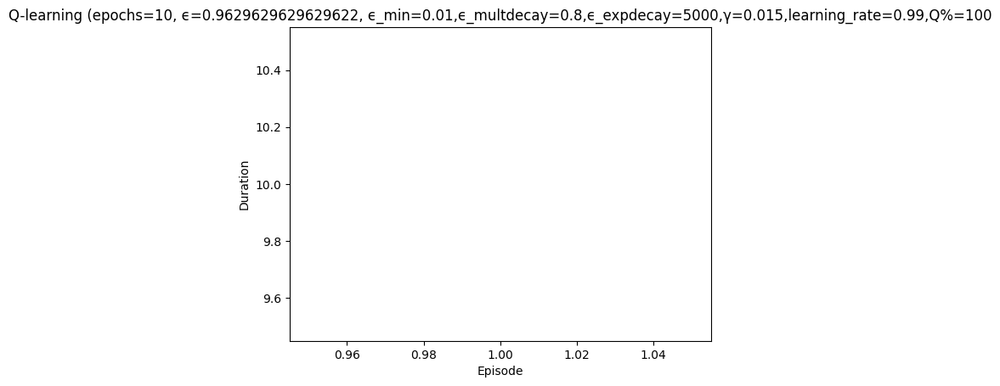

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 2/10 'Q-learning' ϵ=0.7690, γ=0.015,learning_rate=0.99,Q%=100


Episode 2|Iteration 10|reward:  -38.0|last_reward_at:    6|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

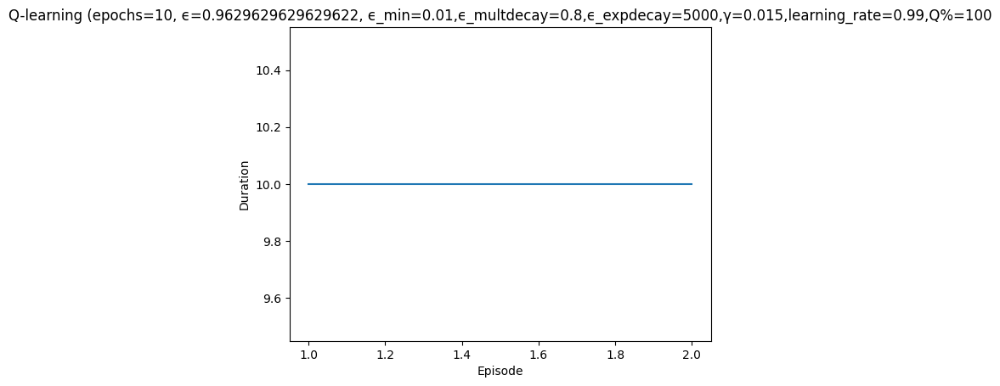

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 3/10 'Q-learning' ϵ=0.7675, γ=0.015,learning_rate=0.99,Q%=100


Episode 3|Iteration 5|reward:    4.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17db0220>)
Attacker reward: 14.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17db0220>)
Attacker reward: -2.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': arra

Episode 3|Iteration 10|reward:   86.0|last_reward_at:   10|Elapsed Time: 0:00:00||


Step called with action: {'connect': array([0, 1, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=100.0, outcome=<cyberbattle.simulation.model.LateralMove object at 0x7faa17da0a90>)
Attacker reward: 100.0
Step called with action: {'connect': array([0, 1, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step

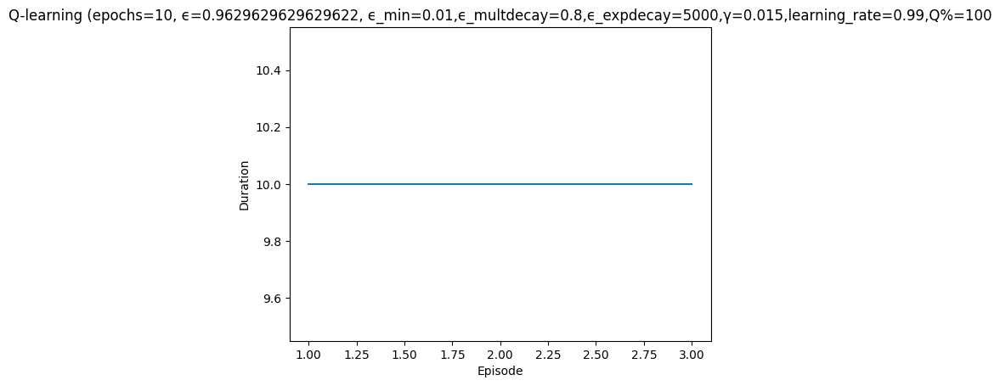

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[ScanExplorerRecentFiles, CrackKeepPassX, Scan...","[ProbeWindows, ProbeLinux]"


  ## Episode: 4/10 'Q-learning' ϵ=0.7660, γ=0.015,learning_rate=0.99,Q%=100


Episode 4|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 4|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 4|Iteration 7|reward:  -21.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17d78340>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=

Episode 4|Iteration 8|reward:  -19.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17d82a00>)
Attacker reward: 2.0


Episode 4|Iteration 10|reward:   80.0|last_reward_at:    9|Elapsed Time: 0:00:00||


Step called with action: {'connect': array([0, 1, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=100.0, outcome=<cyberbattle.simulation.model.LateralMove object at 0x7faa17db6760>)
Attacker reward: 100.0
Step called with action: {'connect': array([0, 1, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-1, outcome=<cyberbattle.simulation.model.LateralMove object at 0x7faa17db6d00>)
Attacker reward: -1
  Episode 4 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 1/5 (0.17)
    explore-connect: 1/2 (0.33)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)

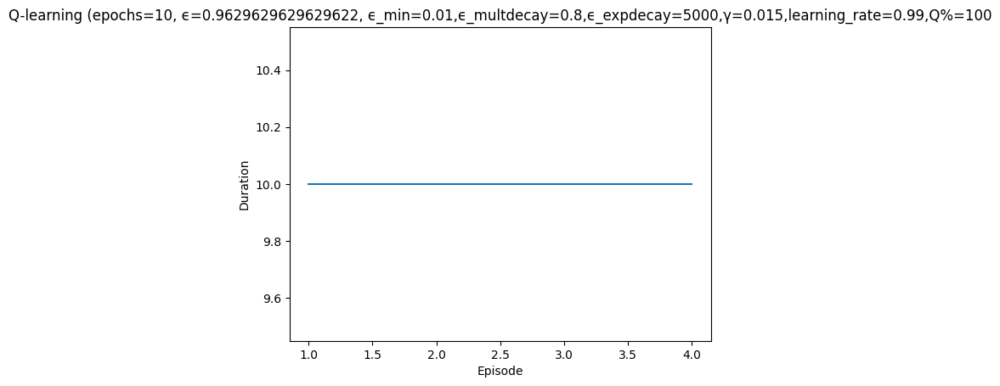

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[ScanExplorerRecentFiles, CrackKeepPassX, Scan...","[ProbeWindows, ProbeLinux]"


  ## Episode: 5/10 'Q-learning' ϵ=0.7644, γ=0.015,learning_rate=0.99,Q%=100


Episode 5|Iteration 7|reward:  -16.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 5|Iteration 7|reward:  -16.0|last_reward_at:    7|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17d5e5b0>)
Attacker reward: -2.0


Episode 5|Iteration 10|reward:  -16.0|last_reward_at:    9|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa17d850d0>)
Attacker reward: 4.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17d5e5b0>)
Attacker reward: -2.0


  Episode 5 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/2 (0.33)
    explore-remote: 1/6 (0.14)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


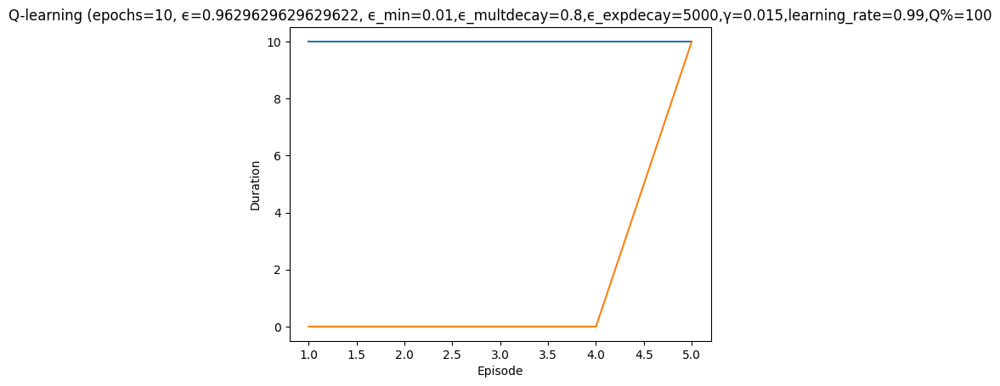

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 6/10 'Q-learning' ϵ=0.7629, γ=0.015,learning_rate=0.99,Q%=100


Episode 6|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 6|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17d23070>)
Attacker reward: 14.0


Episode 6|Iteration 5|reward:    3.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa17da8ca0>)
Attacker reward: 4.0
Step called with action: {'connect': array([0, 1, 5, 0], dtype=int32)}


Episode 6|Iteration 10|reward:  -35.0|last_reward_at:    5|Elapsed Time: 0:00:00||


Executing attacker action {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17d23070>)
Attacker reward: -2.0
Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}


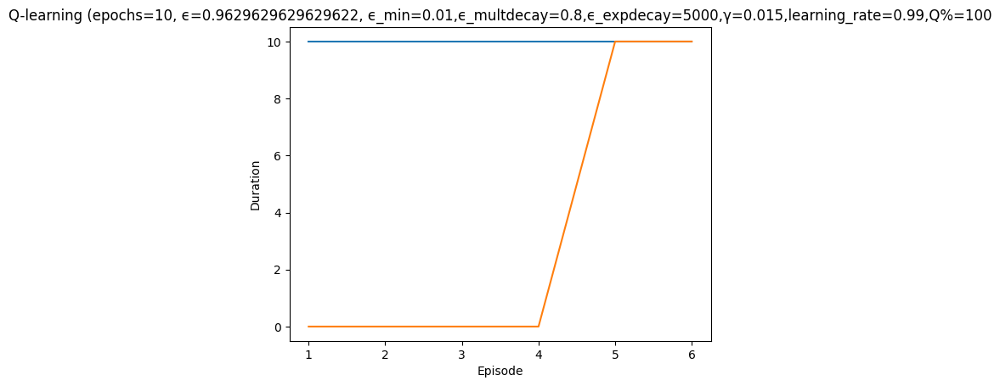

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 7/10 'Q-learning' ϵ=0.7614, γ=0.015,learning_rate=0.99,Q%=100


Episode 7|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 7|Iteration 10|reward:  -40.0|last_reward_at:    2|Elapsed Time: 0:00:00||


Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17c47610>)
Attacker reward: 14.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17c47610>)
Attacker reward: -2.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': arra

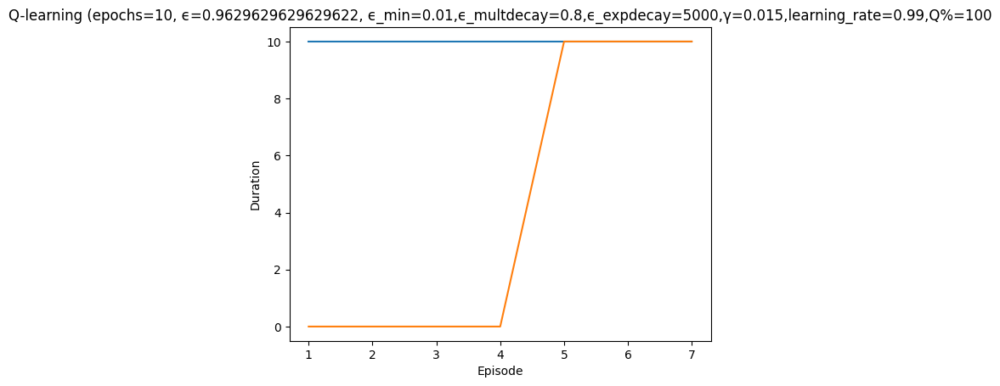

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 8/10 'Q-learning' ϵ=0.7599, γ=0.015,learning_rate=0.99,Q%=100


Episode 8|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 8|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 8|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacke

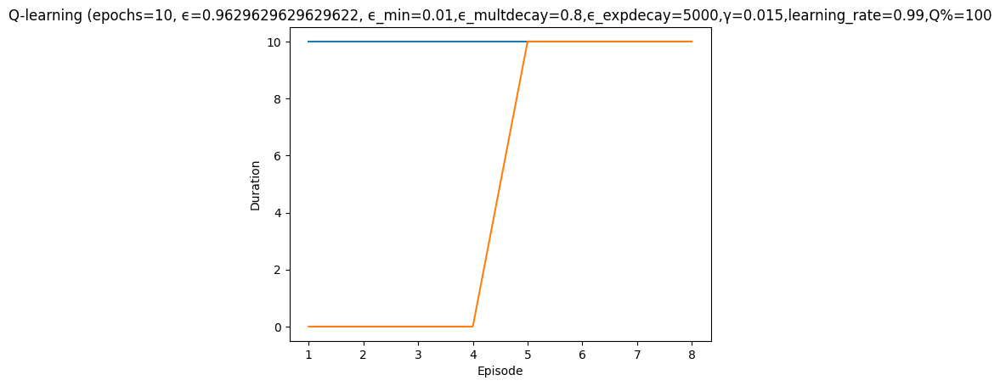

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 9/10 'Q-learning' ϵ=0.7584, γ=0.015,learning_rate=0.99,Q%=100


Episode 9|Iteration 7|reward:  -16.0|last_reward_at:    6|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 9|Iteration 10|reward:  -41.0|last_reward_at:    6|Elapsed Time: 0:00:00||


Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 1, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
  Episode 9 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remo

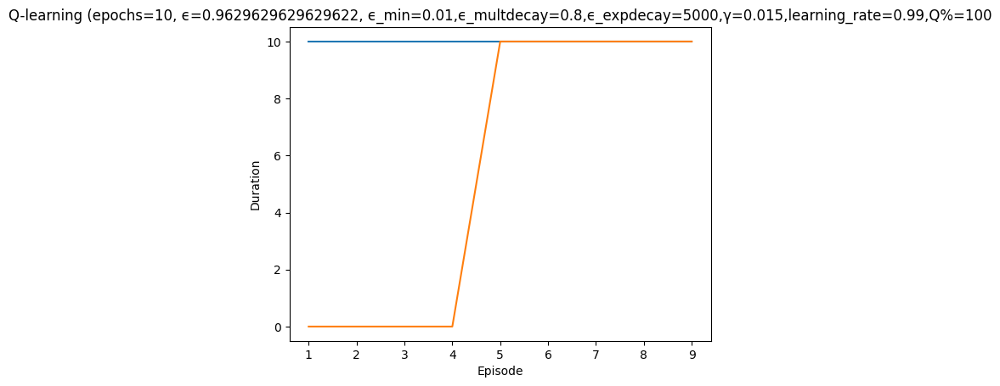

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 10/10 'Q-learning' ϵ=0.7569, γ=0.015,learning_rate=0.99,Q%=100


Episode 10|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}


Episode 10|Iteration 8|reward:   -4.0|last_reward_at:    6|Elapsed Time: 0:00:00||

Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17bd0520>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17c42430>)
Attacker reward: 2.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyber

Episode 10|Iteration 10|reward:  -16.0|last_reward_at:    6|Elapsed Time: 0:00:00||


 {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17c42430>)
Attacker reward: -6.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17c42430>)
Attacker reward: -6.0
  Episode 10 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/2 (0.33)
    explore-remote: 2/4 (0.33)
    explore-connect: 0/1 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0

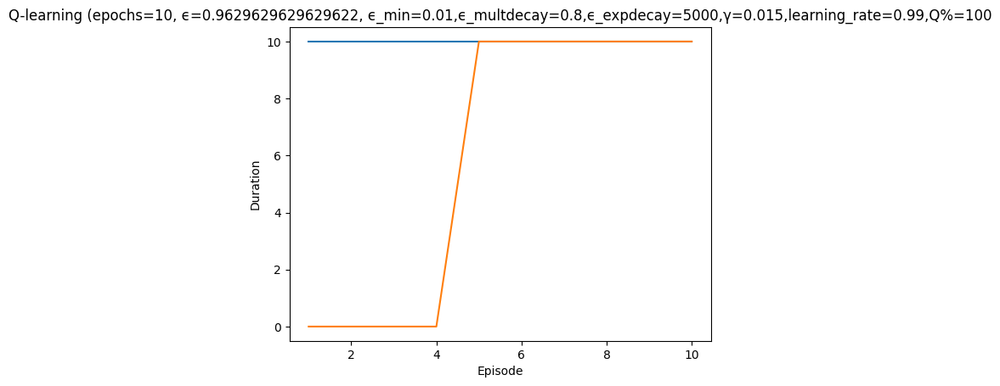

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


simulation ended


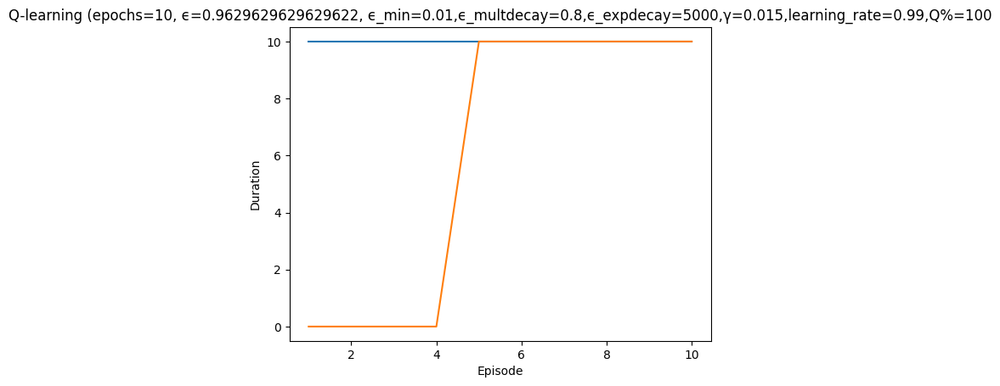

###### Q-learning
Learning with: episode_count=10,iteration_count=10,ϵ=0.9629629629629622,ϵ_min=0.01233716448275862, ϵ_multdecay=0.8,ϵ_expdecay=5000,γ=0.015,learning_rate=0.99,Q%=100
  ## Episode: 1/10 'Q-learning' ϵ=0.9630, γ=0.015,learning_rate=0.99,Q%=100


Episode 1|Iteration 10|reward:   83.0|last_reward_at:   10|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials

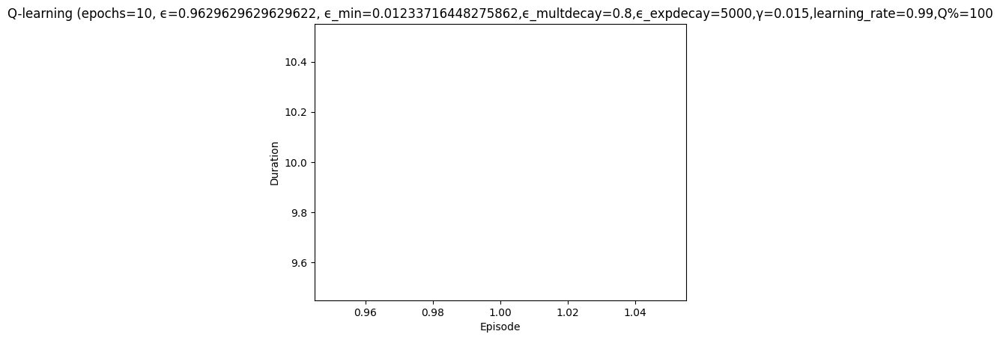

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[ScanExplorerRecentFiles, CrackKeepPassX, Scan...","[ProbeWindows, ProbeLinux]"


  ## Episode: 2/10 'Q-learning' ϵ=0.7690, γ=0.015,learning_rate=0.99,Q%=100


Episode 2|Iteration 5|reward:   -3.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17b2db80>)
Attacker reward: 14.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0

Episode 2|Iteration 6|reward:   -1.0|last_reward_at:    6|Elapsed Time: 0:00:00||

Attacker reward: 2.0
Step called with action: {'connect': array([0, 1, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: 

Episode 2|Iteration 10|reward:   81.0|last_reward_at:   10|Elapsed Time: 0:00:00||


-10
Step called with action: {'connect': array([0, 1, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=100.0, outcome=<cyberbattle.simulation.model.LateralMove object at 0x7faa17d32f70>)
Attacker reward: 100.0
Step called with action: {'connect': array([0, 0, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.m

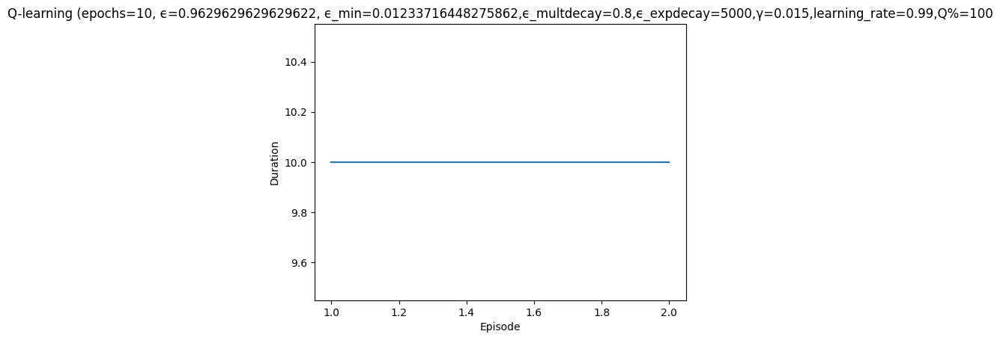

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[ScanExplorerRecentFiles, CrackKeepPassX, Scan...","[ProbeWindows, ProbeLinux]"


  ## Episode: 3/10 'Q-learning' ϵ=0.7675, γ=0.015,learning_rate=0.99,Q%=100


Episode 3|Iteration 6|reward:  -30.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 3|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
  Episo

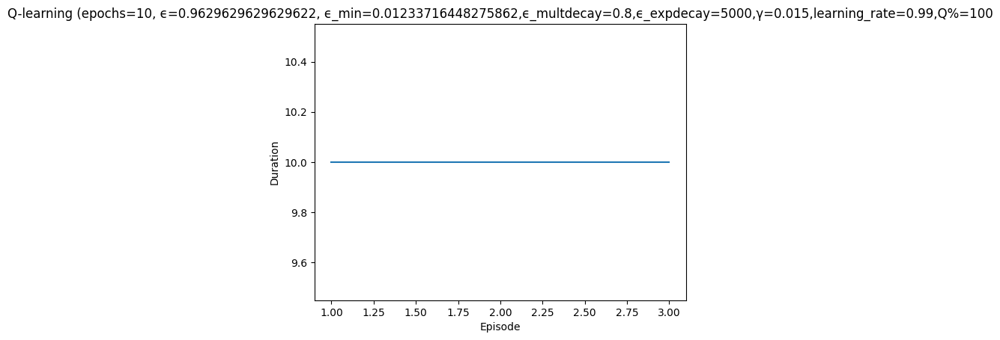

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 4/10 'Q-learning' ϵ=0.7660, γ=0.015,learning_rate=0.99,Q%=100


Episode 4|Iteration 4|reward:    6.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17ae11c0>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult

Episode 4|Iteration 5|reward:   -4.0|last_reward_at:    4|Elapsed Time: 0:00:00||

{'connect': array([0, 0, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 4|Iteration 9|reward:  -16.0|last_reward_at:    7|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa17db18e0>)
Attacker reward: 4.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action:

Episode 4|Iteration 10|reward:  -26.0|last_reward_at:    7|Elapsed Time: 0:00:00||


Attacker reward: -10
  Episode 4 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 2/5 (0.29)
    explore-connect: 0/2 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


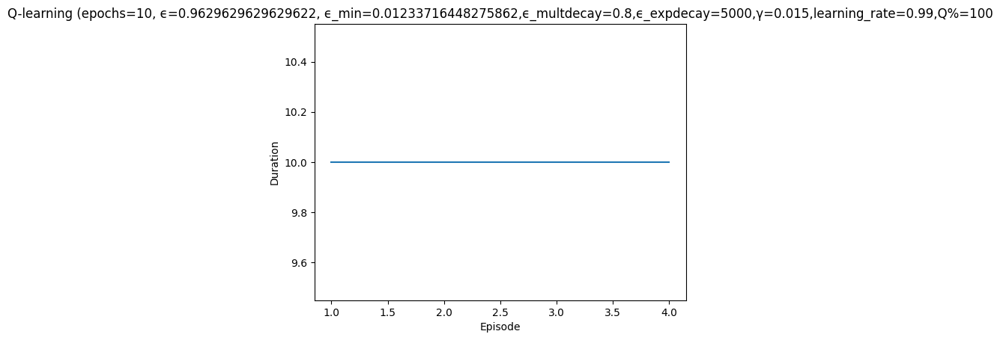

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 5/10 'Q-learning' ϵ=0.7645, γ=0.015,learning_rate=0.99,Q%=100


Episode 5|Iteration 5|reward:   -3.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials

Episode 5|Iteration 6|reward:  -13.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 1, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0


Episode 5|Iteration 10|reward:  -53.0|last_reward_at:    3|Elapsed Time: 0:00:00||


Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 0, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'conn

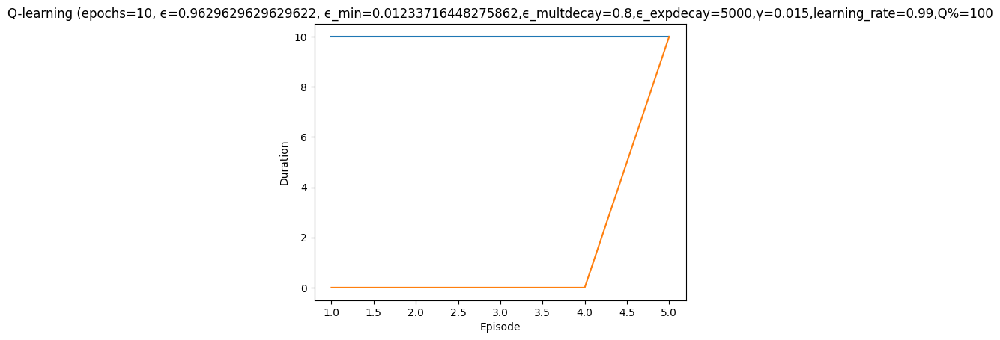

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 6/10 'Q-learning' ϵ=0.7630, γ=0.015,learning_rate=0.99,Q%=100


Episode 6|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 6|Iteration 5|reward:  -25.0|last_reward_at: ----|Elapsed Time: 0:00:00||

{'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17a9e910>)


Episode 6|Iteration 10|reward:  -31.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Attacker reward: 14.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17a9e910>)
Attacker reward: -2.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17a61640>)
Attacker reward: 2.0
Step called with action: {'connect': array([0, 1, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1

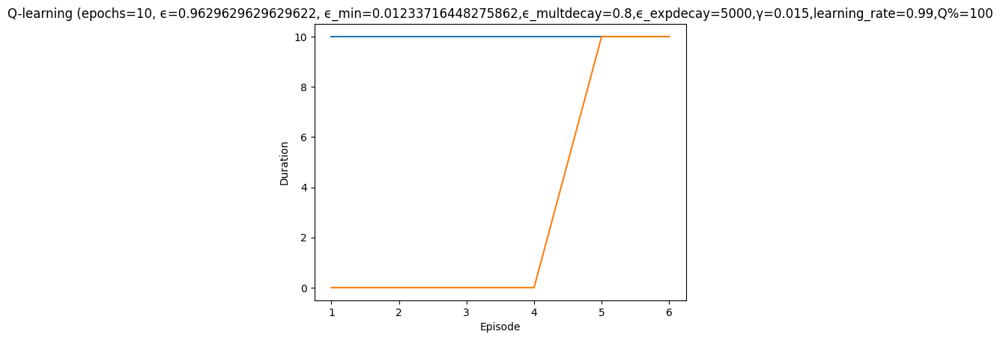

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 7/10 'Q-learning' ϵ=0.7614, γ=0.015,learning_rate=0.99,Q%=100


Episode 7|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 7|Iteration 5|reward:  -25.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 7|Iteration 7|reward:  -16.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa179ea910>)
Attacker reward: 14.0


Episode 7|Iteration 10|reward:  -41.0|last_reward_at:    7|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
  Episode 7 stopped at t=10 loss={loss_string}
  Breakdown [Reward/

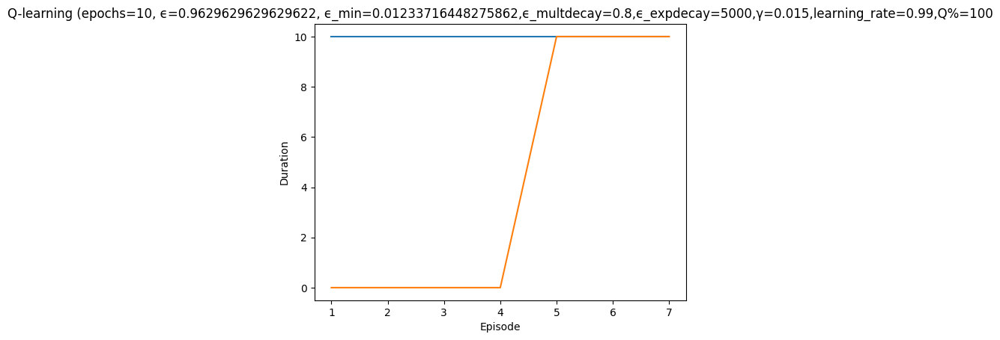

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 8/10 'Q-learning' ϵ=0.7599, γ=0.015,learning_rate=0.99,Q%=100


Episode 8|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 8|Iteration 5|reward:  -25.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action 

Episode 8|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


{'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remot

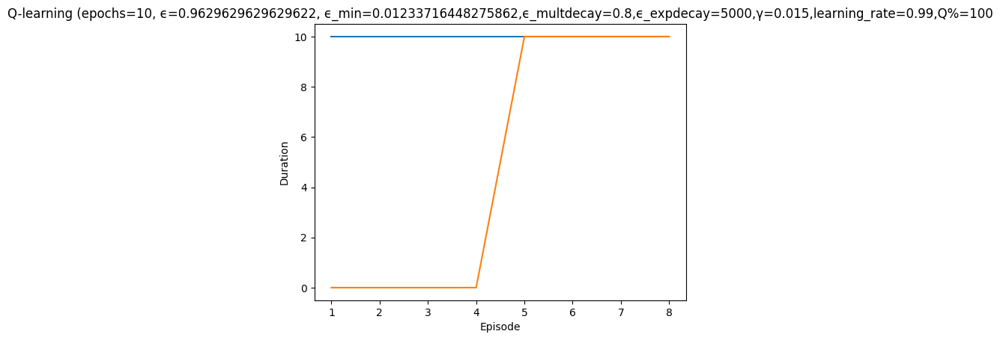

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 9/10 'Q-learning' ϵ=0.7584, γ=0.015,learning_rate=0.99,Q%=100


Episode 9|Iteration 6|reward:  -26.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17a85c10>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 0, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
A

Episode 9|Iteration 10|reward:  -58.0|last_reward_at:    1|Elapsed Time: 0:00:00||


Attacker reward: -2.0
Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'connect': array([0, 1, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 0, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
  Episode 9 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (

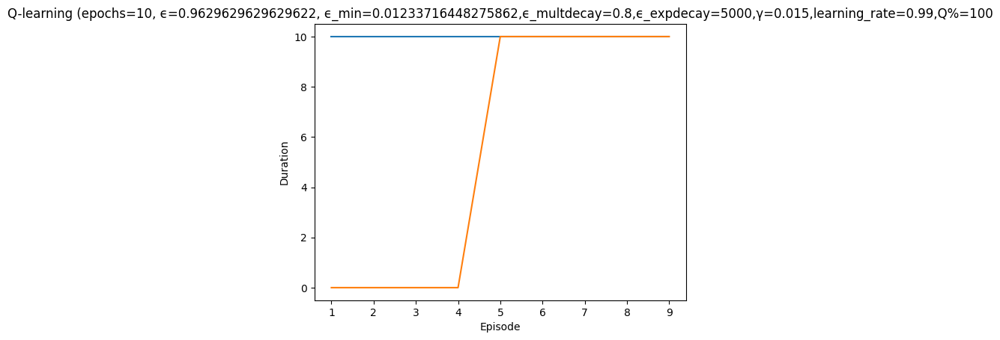

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 10/10 'Q-learning' ϵ=0.7570, γ=0.015,learning_rate=0.99,Q%=100


Episode 10|Iteration 10|reward:  -14.0|last_reward_at:    9|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

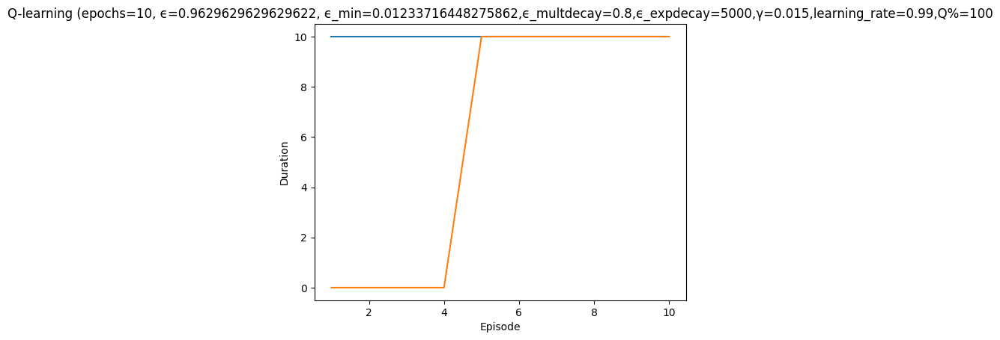

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


simulation ended


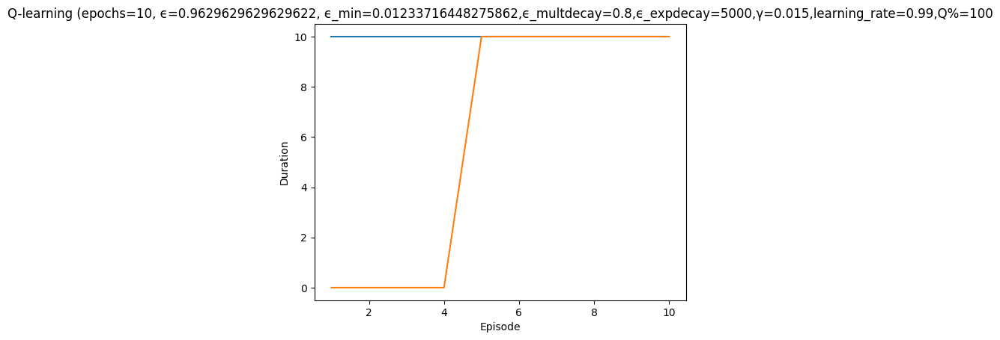

###### Q-learning
Learning with: episode_count=10,iteration_count=10,ϵ=0.9629629629629622,ϵ_min=0.014674328965517243, ϵ_multdecay=0.8,ϵ_expdecay=5000,γ=0.015,learning_rate=0.99,Q%=100
  ## Episode: 1/10 'Q-learning' ϵ=0.9630, γ=0.015,learning_rate=0.99,Q%=100


Episode 1|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

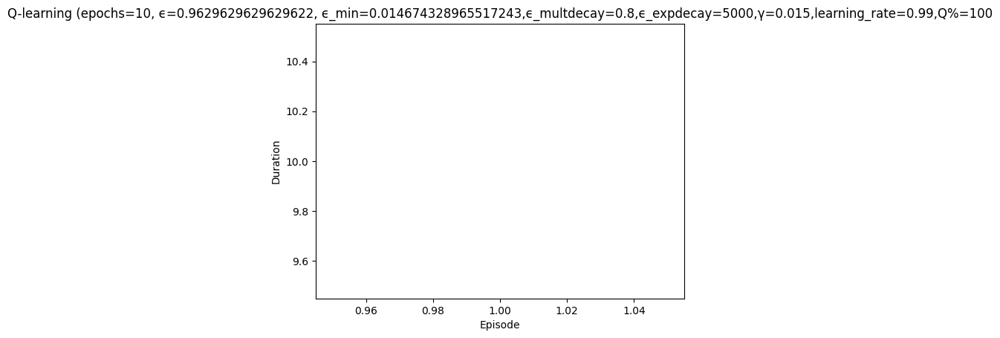

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 2/10 'Q-learning' ϵ=0.7690, γ=0.015,learning_rate=0.99,Q%=100


Episode 2|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 2|Iteration 5|reward:   -6.0|last_reward_at: ----|Elapsed Time: 0:00:00||

attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17bd0cd0>)
Attacker reward: 14.0


Episode 2|Iteration 10|reward:  -26.0|last_reward_at:    9|Elapsed Time: 0:00:00||


Step called with action: {'connect': array([0, 1, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa17c63b50>)
Attacker reward: 4.0
Ste

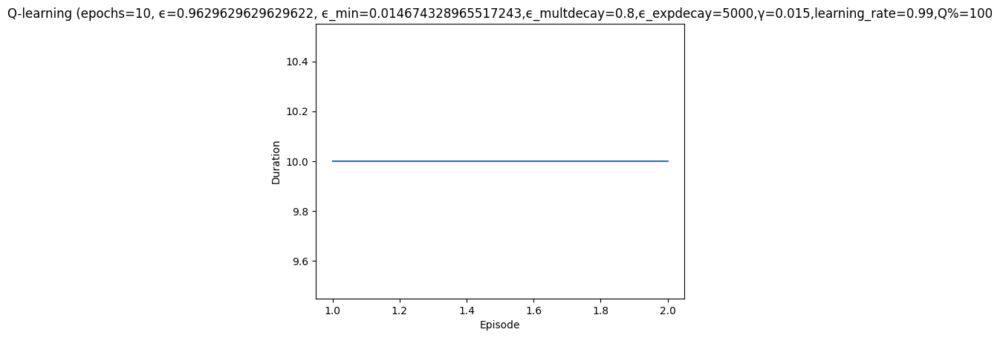

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 3/10 'Q-learning' ϵ=0.7675, γ=0.015,learning_rate=0.99,Q%=100


Episode 3|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 3|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 3|Iteration 8|reward:  -21.0|last_reward_at:    8|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacke

Episode 3|Iteration 10|reward:  -41.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Step called with action: {'connect': array([0, 1, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
  Episode 3 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 0/7 (0.00)
    explore-connect: 0/2 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


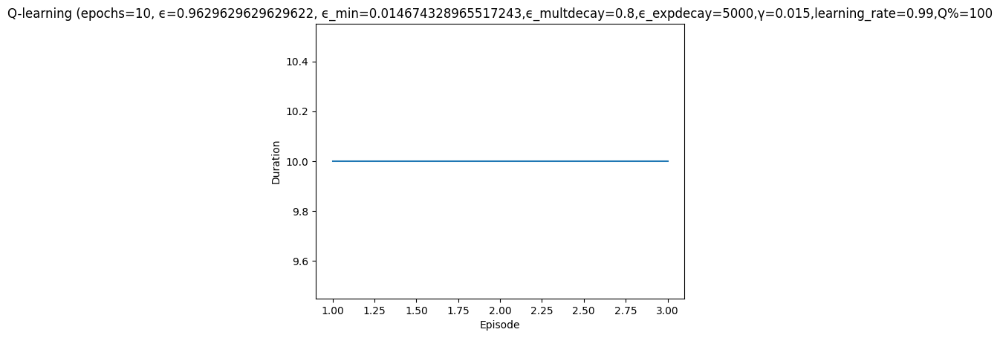

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 4/10 'Q-learning' ϵ=0.7660, γ=0.015,learning_rate=0.99,Q%=100


Episode 4|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 4|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 4|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action 

Episode 4|Iteration 6|reward:  -30.0|last_reward_at: ----|Elapsed Time: 0:00:00||

{'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remot

Episode 4|Iteration 9|reward:  -45.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 4|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


  Episode 4 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/10 (0.00)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


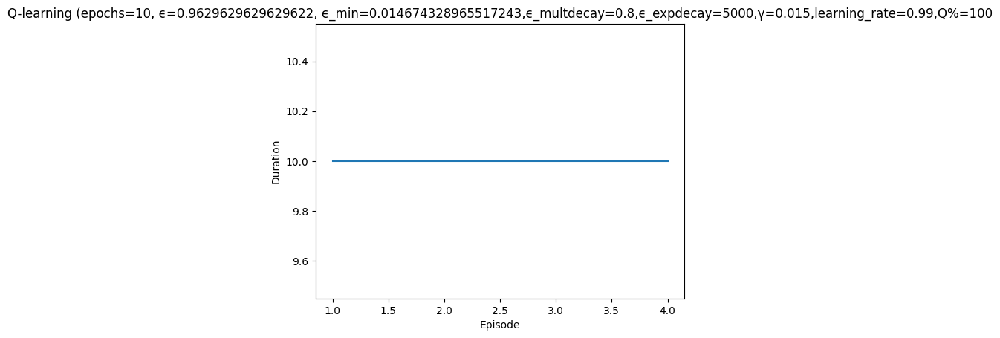

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 5/10 'Q-learning' ϵ=0.7645, γ=0.015,learning_rate=0.99,Q%=100


Episode 5|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward:

Episode 5|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

 -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 5|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 5|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 5|Iteration 5|reward:  -25.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 5|Iteration 9|reward:  -26.0|last_reward_at:    9|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.m

Episode 5|Iteration 10|reward:  -31.0|last_reward_at:    9|Elapsed Time: 0:00:00||


attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
  Episode 5 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 0/9 (0.00)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


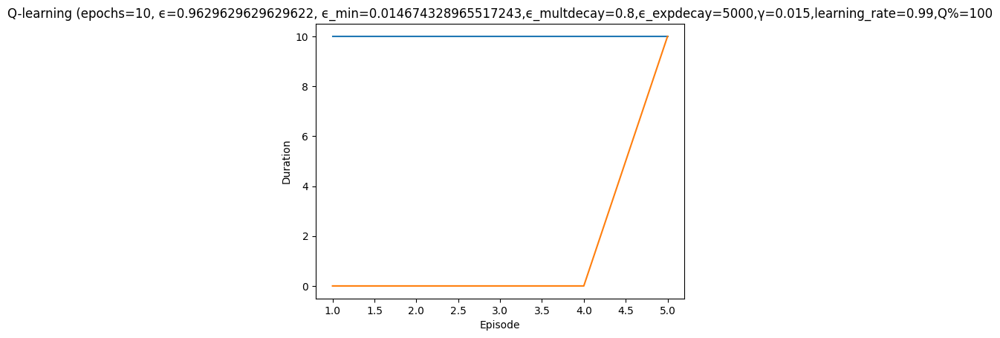

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 6/10 'Q-learning' ϵ=0.7630, γ=0.015,learning_rate=0.99,Q%=100


Episode 6|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 6|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 6|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 6|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 6|Iteration 5|reward:  -25.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 6|Iteration 10|reward:  -27.0|last_reward_at:   10|Elapsed Time: 0:00:00||


Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17c638b0>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5

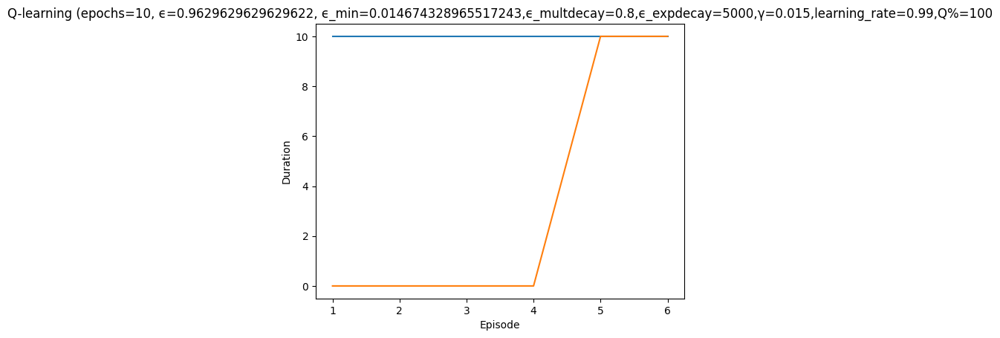

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 7/10 'Q-learning' ϵ=0.7615, γ=0.015,learning_rate=0.99,Q%=100


Episode 7|Iteration 5|reward:   -8.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials

Episode 7|Iteration 7|reward:  -11.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa40356520>)
Attacker reward: 2.0


Episode 7|Iteration 7|reward:  -11.0|last_reward_at:    7|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17c35670>)


Episode 7|Iteration 8|reward:  -13.0|last_reward_at:    7|Elapsed Time: 0:00:00||

Attacker reward: -2.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 7|Iteration 9|reward:  -18.0|last_reward_at:    7|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17c35670>)
Attacker reward: 

Episode 7|Iteration 10|reward:  -20.0|last_reward_at:    7|Elapsed Time: 0:00:00||


-2.0
  Episode 7 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/3 (0.25)
    explore-remote: 1/4 (0.20)
    explore-connect: 0/1 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


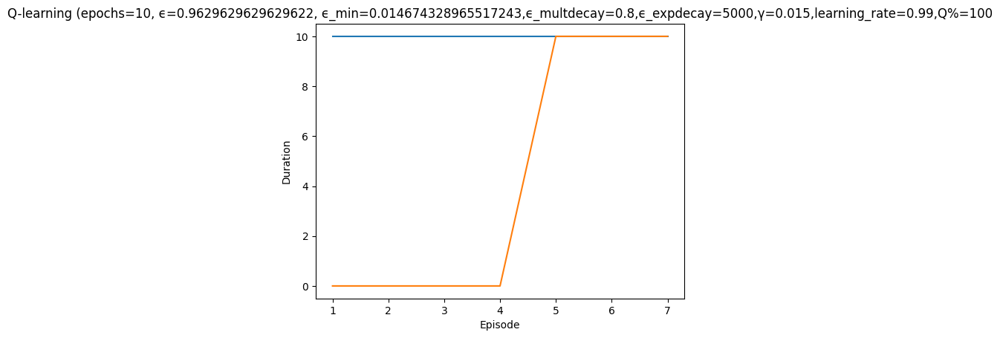

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 8/10 'Q-learning' ϵ=0.7600, γ=0.015,learning_rate=0.99,Q%=100


Episode 8|Iteration 3|reward:   -1.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17db01f0>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Att

Episode 8|Iteration 4|reward:  -11.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Executing attacker action {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'connect': array([0, 0, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)


Episode 8|Iteration 5|reward:  -21.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Attacker reward: -10.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa17d823a0>)
Attacker reward: 4.0


Episode 8|Iteration 6|reward:  -17.0|last_reward_at:    6|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 0, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)


Episode 8|Iteration 7|reward:  -27.0|last_reward_at:    6|Elapsed Time: 0:00:00||

Attacker reward: -10
Step called with action: {'connect': array([0, 1, 2, 0], dtype=int32)}


Episode 8|Iteration 10|reward:   63.0|last_reward_at:    8|Elapsed Time: 0:00:00||

Executing attacker action {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=100.0, outcome=<cyberbattle.simulation.model.LateralMove object at 0x7faa17d2cfa0>)
Attacker reward: 100.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


  Episode 8 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 1/3 (0.25)
    explore-connect: 1/4 (0.20)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


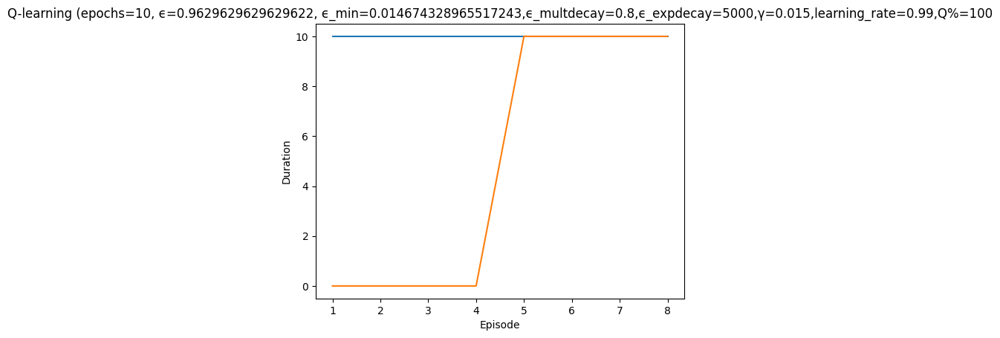

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[ScanExplorerRecentFiles, CrackKeepPassX, Scan...","[ProbeWindows, ProbeLinux]"


  ## Episode: 9/10 'Q-learning' ϵ=0.7585, γ=0.015,learning_rate=0.99,Q%=100


Episode 9|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 9|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 9|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 9|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action 

Episode 9|Iteration 9|reward:  -45.0|last_reward_at: ----|Elapsed Time: 0:00:00||

{'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remot

Episode 9|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
  Episode 9 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/10 (0.00)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 1


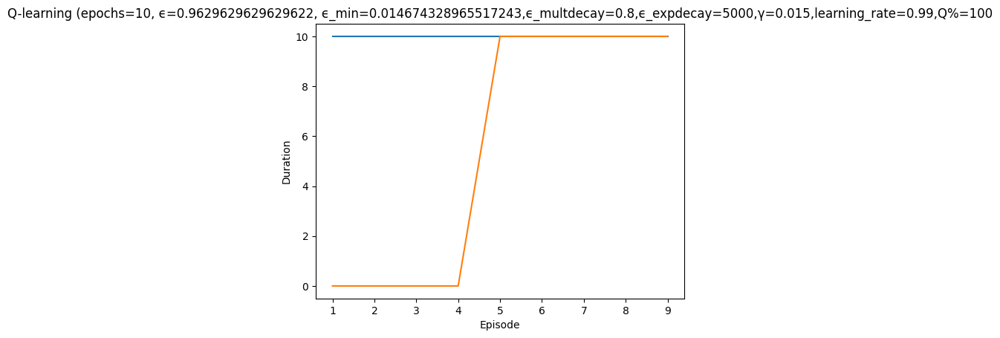

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 10/10 'Q-learning' ϵ=0.7570, γ=0.015,learning_rate=0.99,Q%=100


Episode 10|Iteration 9|reward:  -17.0|last_reward_at:    7|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17dd4250>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
A

Episode 10|Iteration 10|reward:  -23.0|last_reward_at:    7|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa40362790>)
Attacker reward: -6.0
  Episode 10 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 2/4 (0.33)
    explore-connect: 0/2 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


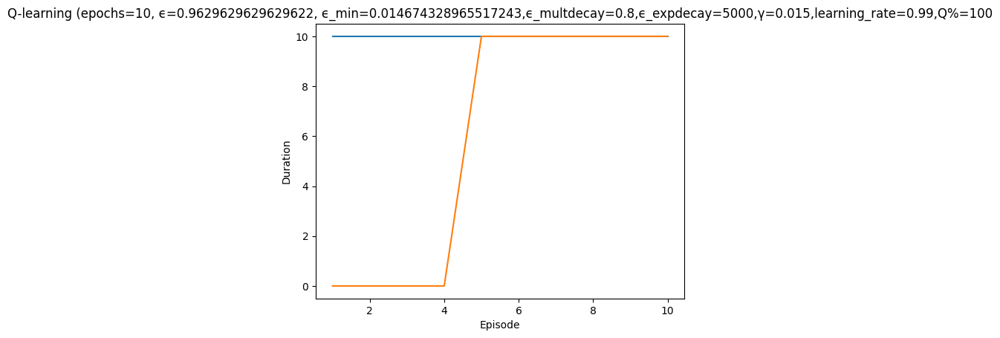

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


simulation ended


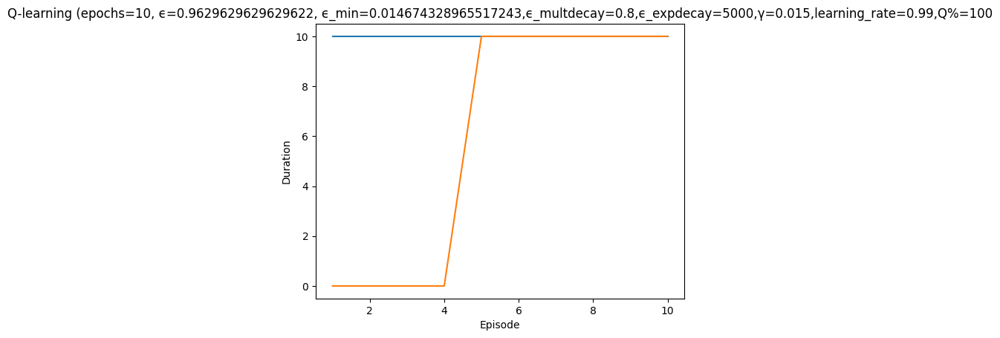

###### Q-learning
Learning with: episode_count=10,iteration_count=10,ϵ=0.9629629629629622,ϵ_min=0.017011493448275863, ϵ_multdecay=0.8,ϵ_expdecay=5000,γ=0.015,learning_rate=0.99,Q%=100
  ## Episode: 1/10 'Q-learning' ϵ=0.9630, γ=0.015,learning_rate=0.99,Q%=100


Episode 1|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

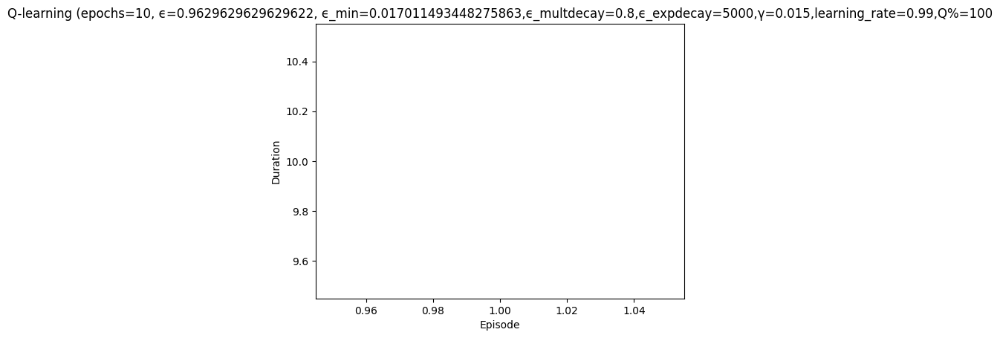

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 2/10 'Q-learning' ϵ=0.7690, γ=0.015,learning_rate=0.99,Q%=100


Episode 2|Iteration 5|reward:   -6.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 2|Iteration 6|reward:  -11.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action:

Episode 2|Iteration 10|reward:  -51.0|last_reward_at:    5|Elapsed Time: 0:00:00||


 {'connect': array([0, 0, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 7, 0]

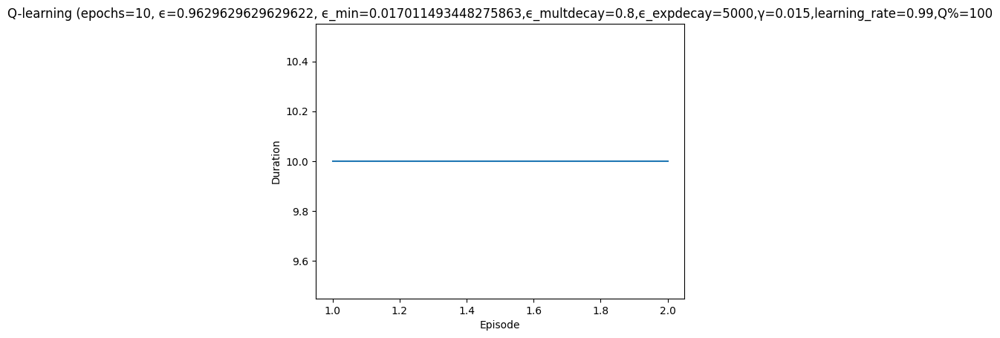

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 3/10 'Q-learning' ϵ=0.7675, γ=0.015,learning_rate=0.99,Q%=100


Episode 3|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 3|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 3|Iteration 8|reward:  -40.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacke

Episode 3|Iteration 9|reward:  -45.0|last_reward_at: ----|Elapsed Time: 0:00:00||

{'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 3|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Attacker reward: -5.0
  Episode 3 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/10 (0.00)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 1


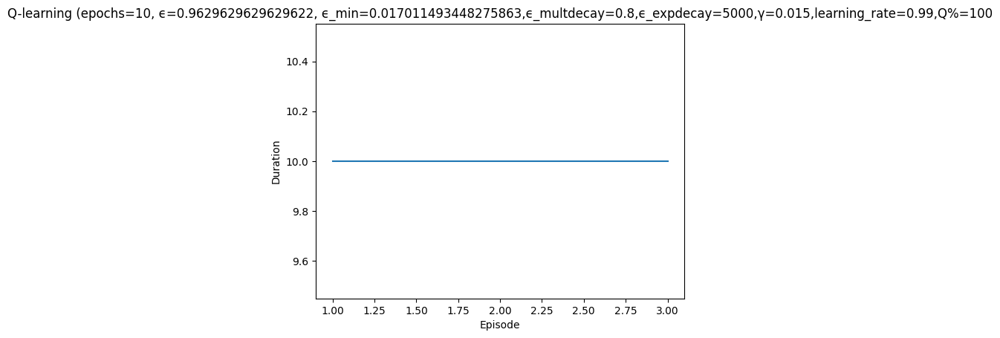

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 4/10 'Q-learning' ϵ=0.7660, γ=0.015,learning_rate=0.99,Q%=100


Episode 4|Iteration 3|reward:   11.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17bbb6d0>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult

Episode 4|Iteration 4|reward:   15.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa17e19490>)
Attacker reward: 4.0


Episode 4|Iteration 6|reward:    3.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 1, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17bbb6d0>)
Attacker reward: -2.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyber

Episode 4|Iteration 10|reward:  -28.0|last_reward_at:    4|Elapsed Time: 0:00:00||


Attacker reward: -6.0
Step called with action: {'connect': array([0, 0, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 1, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
  Episode 4 stopped at t=10 loss={loss_string}
  

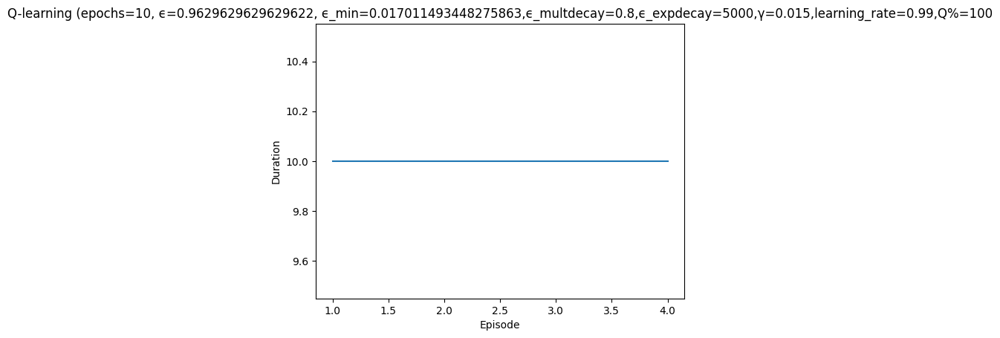

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 5/10 'Q-learning' ϵ=0.7645, γ=0.015,learning_rate=0.99,Q%=100


Episode 5|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 5|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 5|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed:

Episode 5|Iteration 7|reward:  -23.0|last_reward_at:    4|Elapsed Time: 0:00:00||

 {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17b1fcd0>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 1, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17b1fcd0>)
Attacker reward: -2.0
Step called with action: {'connect': array([0, 0, 0, 0], dtype=int32)}
Executing attacker action {'connect': ar

Episode 5|Iteration 10|reward:  -43.0|last_reward_at:    4|Elapsed Time: 0:00:00||


Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
  Episode 5 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 0/5 (0.00)
    explore-connect: 0/3 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


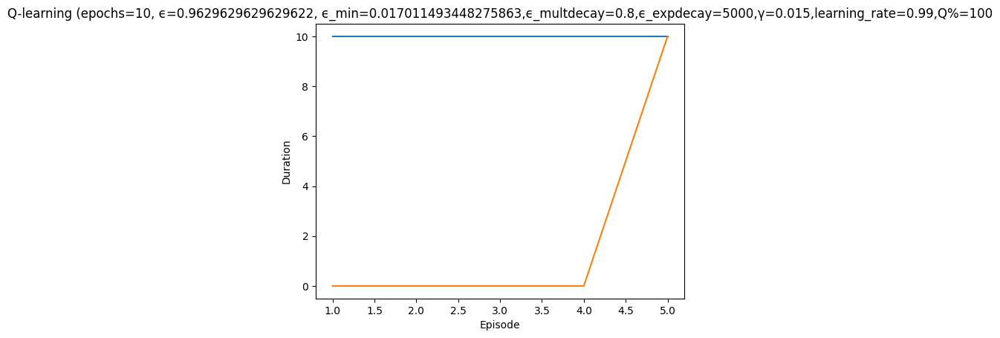

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 6/10 'Q-learning' ϵ=0.7630, γ=0.015,learning_rate=0.99,Q%=100


Episode 6|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 6|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


{'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remot

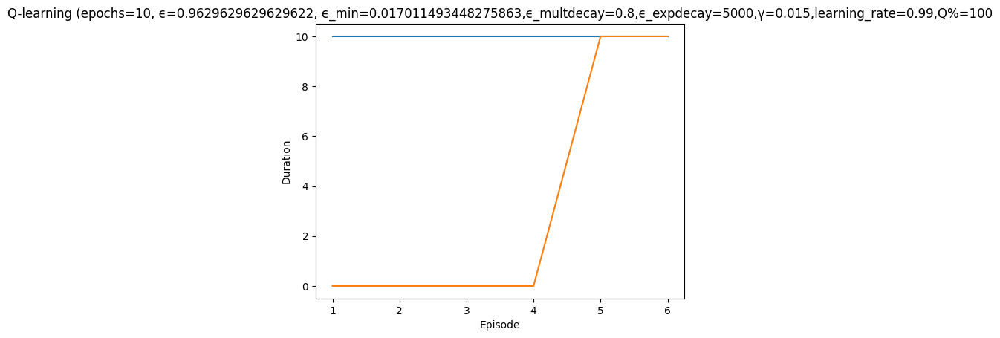

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 7/10 'Q-learning' ϵ=0.7615, γ=0.015,learning_rate=0.99,Q%=100


Episode 7|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 7|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 7|Iteration 7|reward:  -35.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacke

Episode 7|Iteration 10|reward:  -36.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Step called with action: {'connect': array([0, 1, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
  Episode 7 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 0/8 (0.00)
    explore-connect: 0/1 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 2


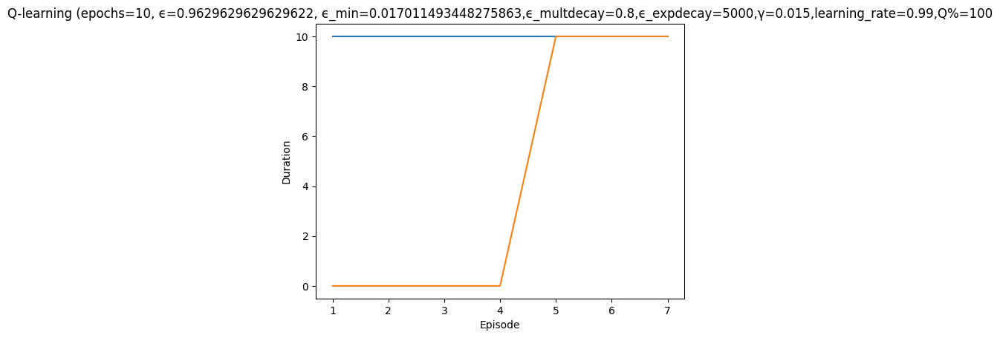

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 8/10 'Q-learning' ϵ=0.7600, γ=0.015,learning_rate=0.99,Q%=100


Episode 8|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa1789c3d0>)
Attacker reward: 

Episode 8|Iteration 2|reward:    9.0|last_reward_at:    2|Elapsed Time: 0:00:00||

14.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa178a8c70>)


Episode 8|Iteration 5|reward:    1.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Attacker reward: 4.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa1789c3d0>)
Attacker reward: -2.0
Step called with action: {'connect': array([0, 0, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)


Episode 8|Iteration 10|reward:  -44.0|last_reward_at:    3|Elapsed Time: 0:00:00||


Attacker reward: -10
Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'connect': array([0, 1, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=i

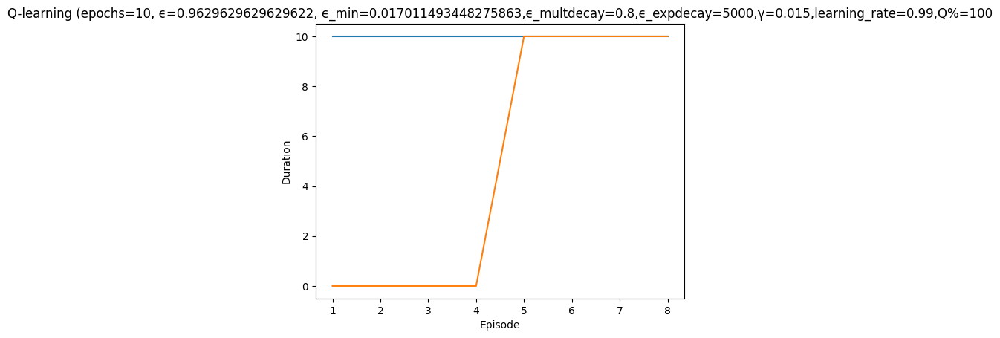

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 9/10 'Q-learning' ϵ=0.7585, γ=0.015,learning_rate=0.99,Q%=100


Episode 9|Iteration 1|reward:   14.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa178c4a90>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7fa9c0e73190>)
Attacker reward: 4.0


Episode 9|Iteration 3|reward:   13.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action:

Episode 9|Iteration 4|reward:    8.0|last_reward_at:    2|Elapsed Time: 0:00:00||

 {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action:

Episode 9|Iteration 7|reward:   -5.0|last_reward_at:    7|Elapsed Time: 0:00:00||

 {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 0, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7fa9c0e73400>)
Attacker reward: 2.

Episode 9|Iteration 10|reward:  -23.0|last_reward_at:    7|Elapsed Time: 0:00:00||



attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa178c4a90>)
Attacker reward: -2.0
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7fa9c0e73190>)
Attacker reward: -6.0
  Episode 9 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoR

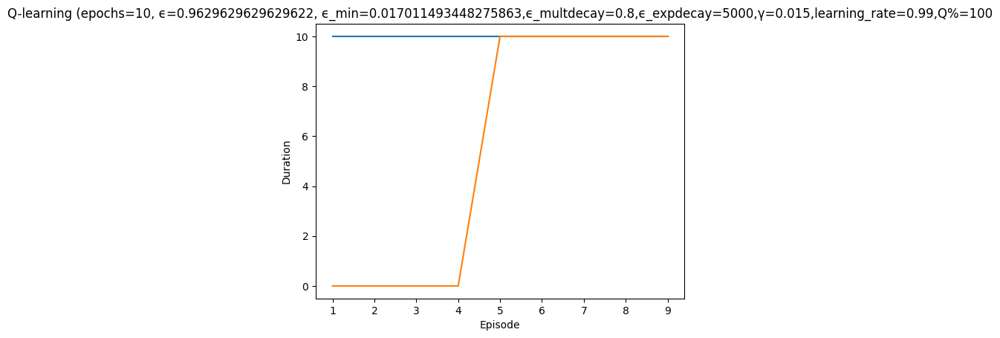

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 10/10 'Q-learning' ϵ=0.7570, γ=0.015,learning_rate=0.99,Q%=100


Episode 10|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}


Episode 10|Iteration 1|reward:   14.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa178e1be0>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 10|Iteration 2|reward:    9.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 1, 7, 0], dtype=int32)}


Episode 10|Iteration 3|reward:   -1.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Executing attacker action {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 4, 0], dtype=int32)}
attacker action: 

Episode 10|Iteration 6|reward:  -31.0|last_reward_at:    1|Elapsed Time: 0:00:00||

 ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 0, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker action: 

Episode 10|Iteration 7|reward:  -41.0|last_reward_at:    1|Elapsed Time: 0:00:00||

 ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0


Episode 10|Iteration 10|reward:   49.0|last_reward_at:    9|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 1, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=100.0, outcome=<cyberbattle.simulation.model.LateralMove object at 0x7fa9c0e12880>)
Attacker reward: 100.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=

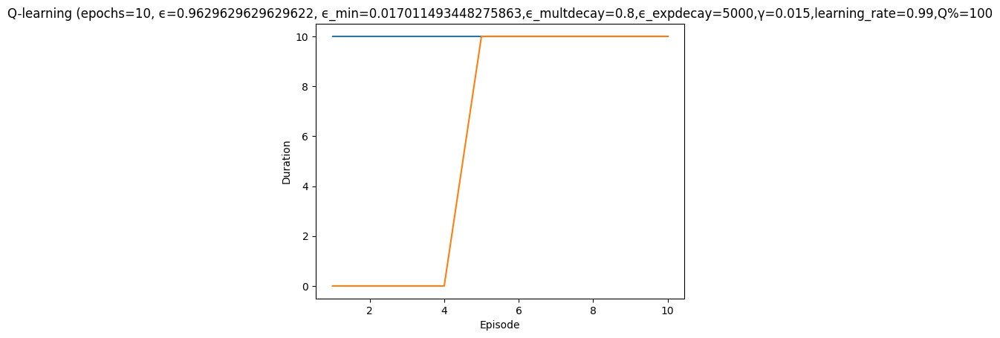

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[ScanExplorerRecentFiles, CrackKeepPassX, Scan...","[ProbeWindows, ProbeLinux]"


simulation ended


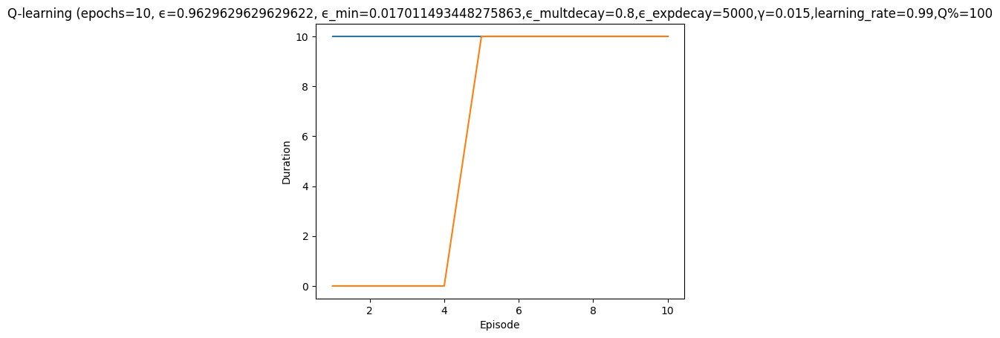

###### Q-learning
Learning with: episode_count=10,iteration_count=10,ϵ=0.9629629629629622,ϵ_min=0.019348657931034484, ϵ_multdecay=0.8,ϵ_expdecay=5000,γ=0.015,learning_rate=0.99,Q%=100
  ## Episode: 1/10 'Q-learning' ϵ=0.9630, γ=0.015,learning_rate=0.99,Q%=100


Episode 1|Iteration 10|reward:  -39.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0ead490>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Att

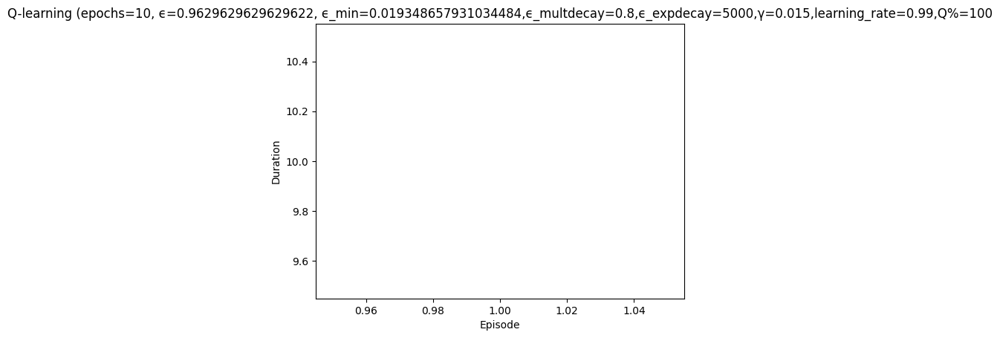

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 2/10 'Q-learning' ϵ=0.7690, γ=0.015,learning_rate=0.99,Q%=100


Episode 2|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 2|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}


Episode 2|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executi

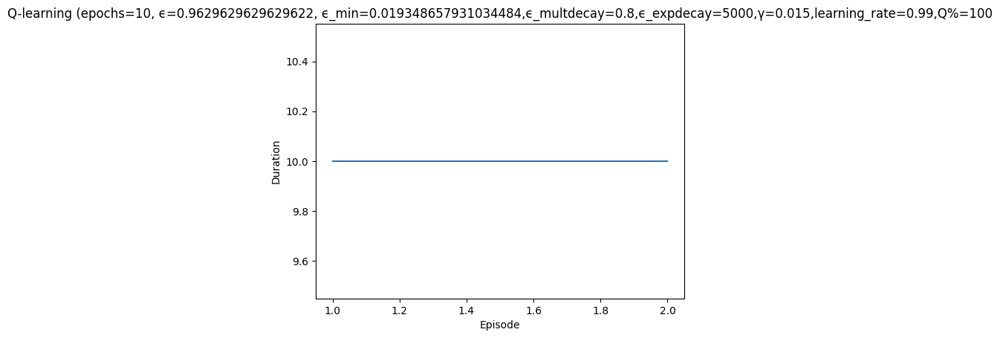

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 3/10 'Q-learning' ϵ=0.7675, γ=0.015,learning_rate=0.99,Q%=100


Episode 3|Iteration 5|reward:  -25.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 3|Iteration 9|reward:  -45.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacke

Episode 3|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


  Episode 3 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/10 (0.00)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


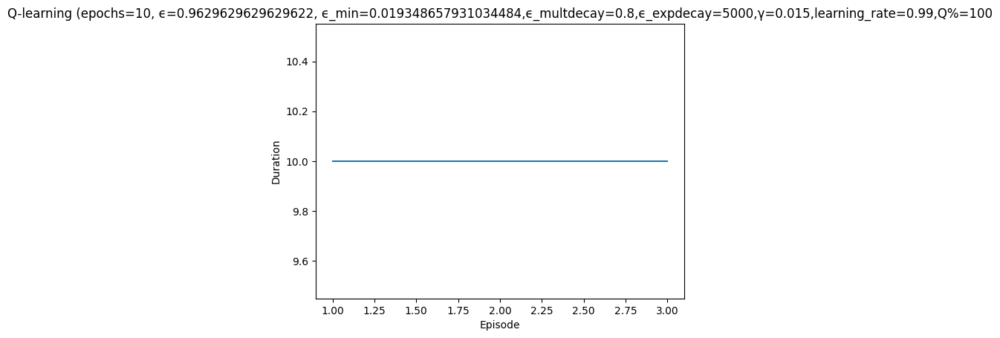

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 4/10 'Q-learning' ϵ=0.7660, γ=0.015,learning_rate=0.99,Q%=100


Episode 4|Iteration 4|reward:   -1.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 4|Iteration 6|reward:  -16.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0dbee50>)
Attacker reward: -2.0


Episode 4|Iteration 7|reward:  -18.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}


Episode 4|Iteration 10|reward:  -40.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0dbee50>)
Attacker reward: -2.0
Step called with action: {'connect': array([0, 0, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0


Episode 4|Iteration 10|reward:  -40.0|last_reward_at:    4|Elapsed Time: 0:00:00||


  Episode 4 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/2 (0.33)
    explore-remote: 0/4 (0.00)
    explore-connect: 0/3 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


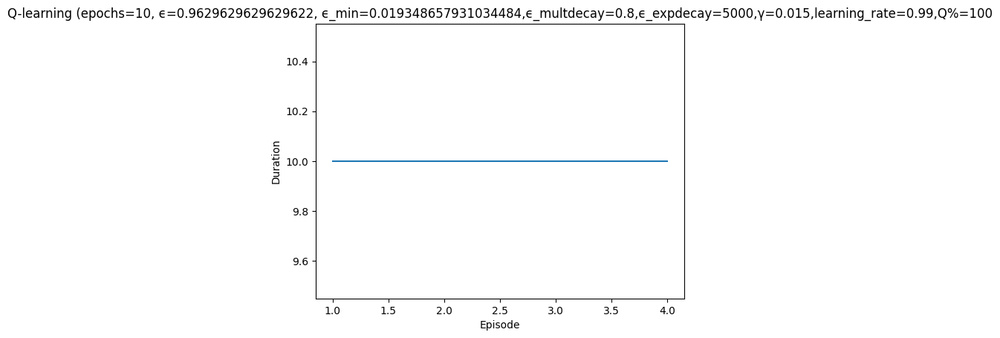

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 5/10 'Q-learning' ϵ=0.7645, γ=0.015,learning_rate=0.99,Q%=100


Episode 5|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}

Episode 5|Iteration 3|reward:    4.0|last_reward_at: ----|Elapsed Time: 0:00:00||


attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0cfa550>)
Attacker reward: 14.0


Episode 5|Iteration 6|reward:   -3.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7fa9c0c4df70>)
Attacker reward: 4.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  Actio

Episode 5|Iteration 7|reward:  -13.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}

Episode 5|Iteration 10|reward:  -30.0|last_reward_at:    5|Elapsed Time: 0:00:00||



attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 0, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0cfa550>)
Attacker reward: -2.0
  Episode 5 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 1/5 (0.17)
    explore-connect: 0/2 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote

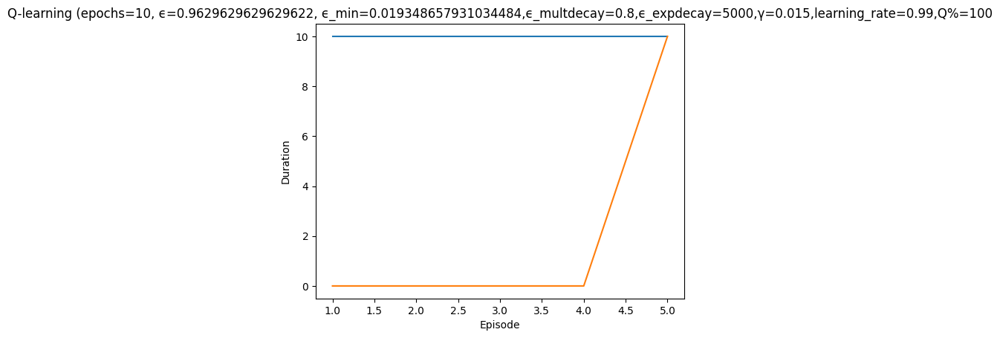

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 6/10 'Q-learning' ϵ=0.7630, γ=0.015,learning_rate=0.99,Q%=100


Episode 6|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 6|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 6|Iteration 5|reward:   -6.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0ca5730>)
Attacker reward: 14.0


Episode 6|Iteration 6|reward:   94.0|last_reward_at:    6|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 1, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=100.0, outcome=<cyberbattle.simulation.model.LateralMove object at 0x7fa9c0c6dd30>)
Attacker reward: 100.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7fa9c0be0520>)
Attacker reward: 2.0


Episode 6|Iteration 9|reward:   80.0|last_reward_at:    7|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 1, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7fa9c0be0520>)
Attacker reward: -6.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyb

Episode 6|Iteration 10|reward:   74.0|last_reward_at:    7|Elapsed Time: 0:00:00||


  Episode 6 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 1/6 (0.14)
    explore-connect: 1/1 (0.50)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


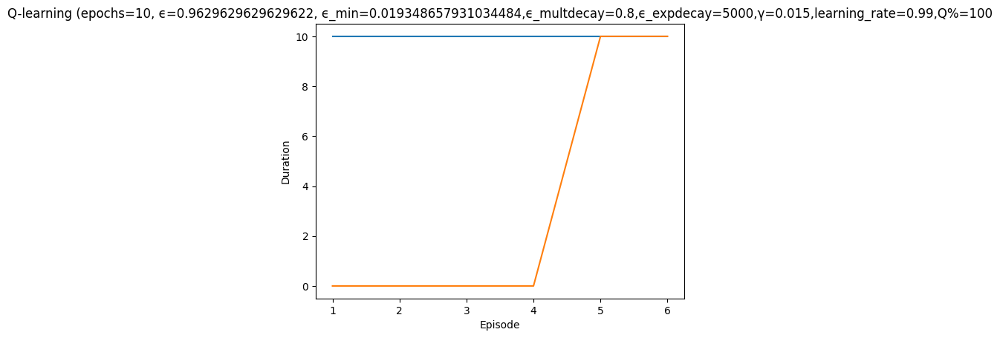

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[ScanExplorerRecentFiles, CrackKeepPassX, Scan...","[ProbeWindows, ProbeLinux]"


  ## Episode: 7/10 'Q-learning' ϵ=0.7615, γ=0.015,learning_rate=0.99,Q%=100


Episode 7|Iteration 10|reward:  -35.0|last_reward_at:    5|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

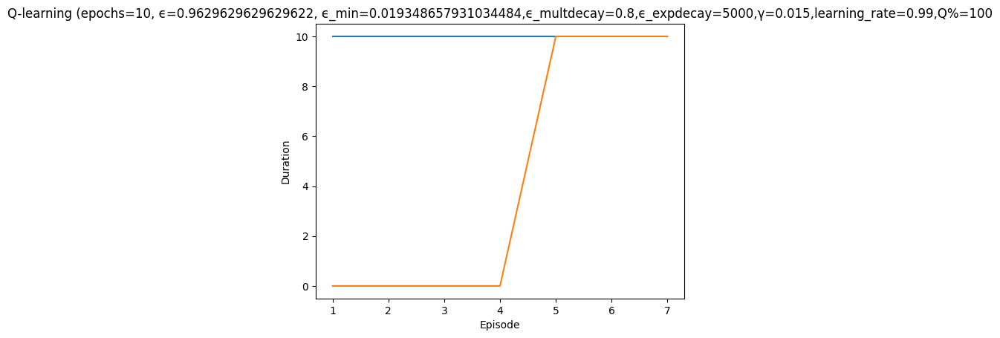

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 8/10 'Q-learning' ϵ=0.7600, γ=0.015,learning_rate=0.99,Q%=100


Episode 8|Iteration 10|reward:  -21.0|last_reward_at:    9|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

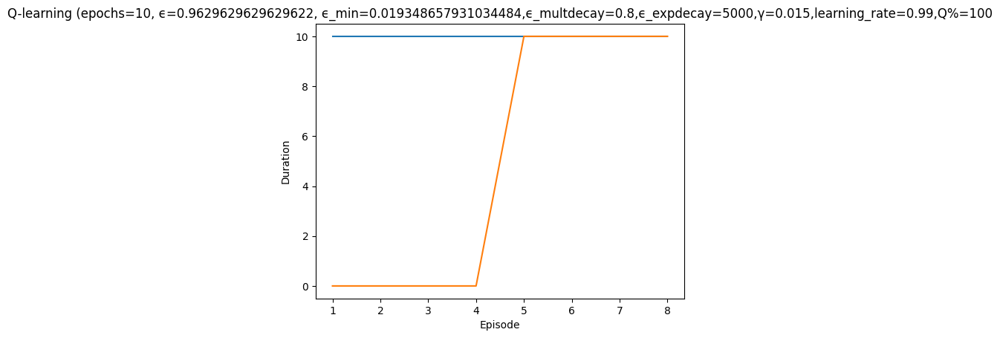

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 9/10 'Q-learning' ϵ=0.7585, γ=0.015,learning_rate=0.99,Q%=100


Episode 9|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

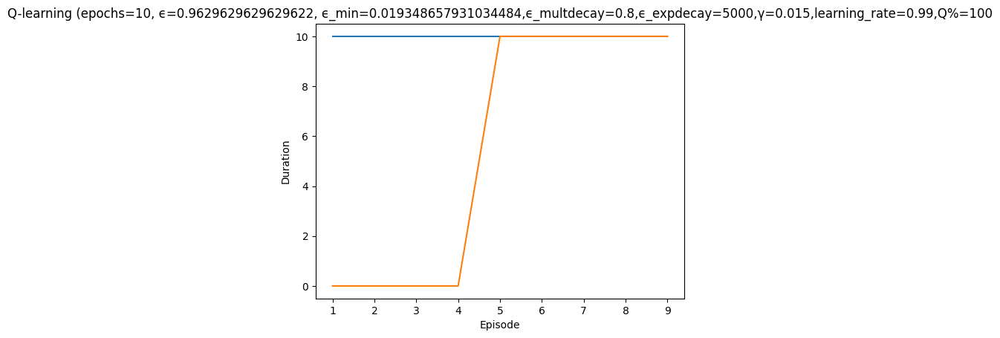

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 10/10 'Q-learning' ϵ=0.7571, γ=0.015,learning_rate=0.99,Q%=100


Episode 10|Iteration 10|reward:  -28.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

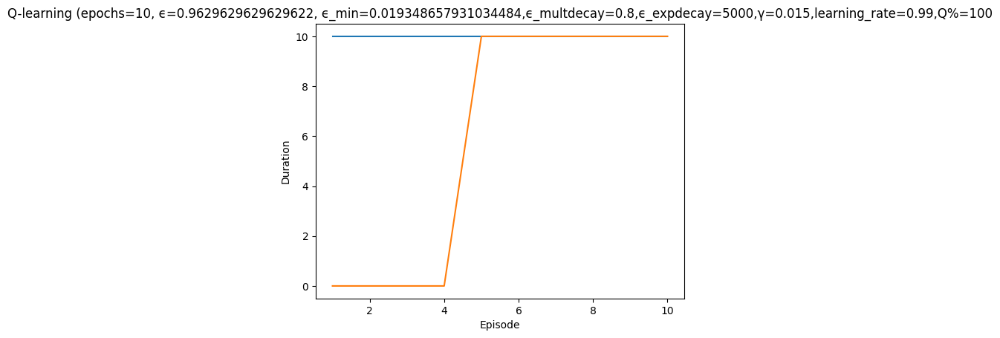

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


simulation ended


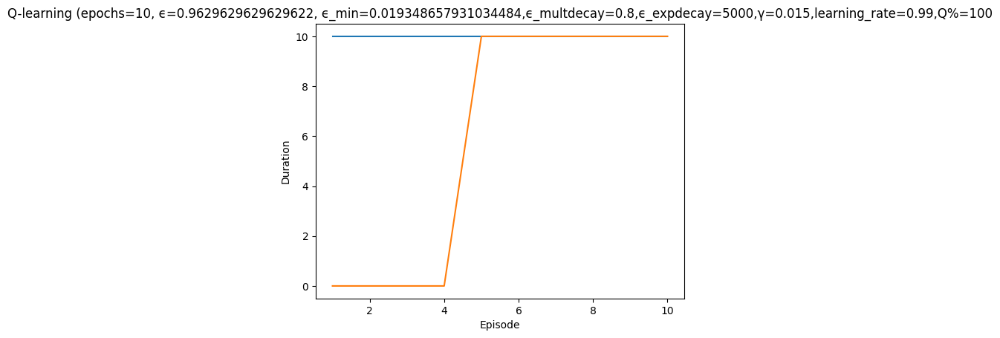

###### Q-learning
Learning with: episode_count=10,iteration_count=10,ϵ=0.9629629629629622,ϵ_min=0.021685822413793104, ϵ_multdecay=0.8,ϵ_expdecay=5000,γ=0.015,learning_rate=0.99,Q%=100
  ## Episode: 1/10 'Q-learning' ϵ=0.9630, γ=0.015,learning_rate=0.99,Q%=100


Episode 1|Iteration 10|reward:  -38.0|last_reward_at:    7|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

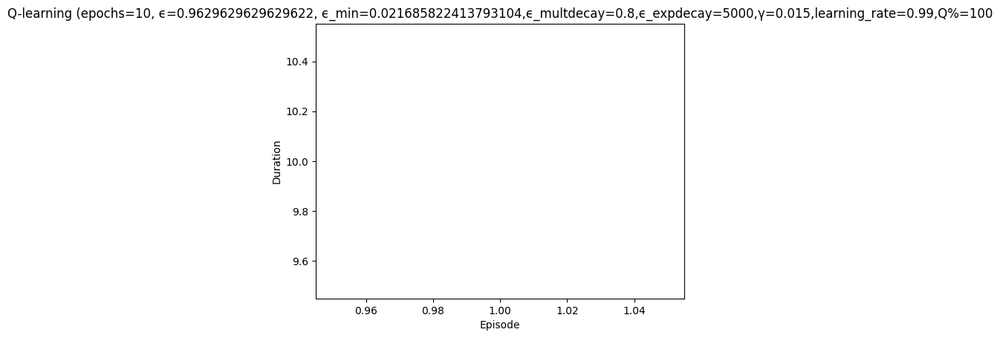

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 2/10 'Q-learning' ϵ=0.7690, γ=0.015,learning_rate=0.99,Q%=100


Episode 2|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 2|Iteration 5|reward:  -25.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 2|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

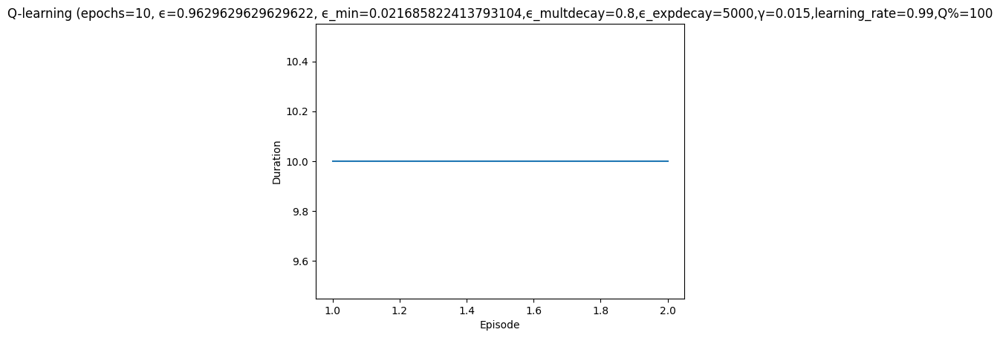

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 3/10 'Q-learning' ϵ=0.7675, γ=0.015,learning_rate=0.99,Q%=100


Episode 3|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 3|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa402ebd30>)


Episode 3|Iteration 8|reward:  -16.0|last_reward_at:    6|Elapsed Time: 0:00:00||

Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17c35e50>)
Attacker reward: 2.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa402ebd30>)
Attacker reward: -2.0
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1

Episode 3|Iteration 9|reward:  -12.0|last_reward_at:    9|Elapsed Time: 0:00:00||

{'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa17c35c10>)
Attacker reward: 4.0
Step called with action: {'connect': array([0, 0, 0, 0], dtype=int32)}


Episode 3|Iteration 10|reward:  -22.0|last_reward_at:    9|Elapsed Time: 0:00:00||


Executing attacker action {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
  Episode 3 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 2/4 (0.33)
    explore-connect: 0/2 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


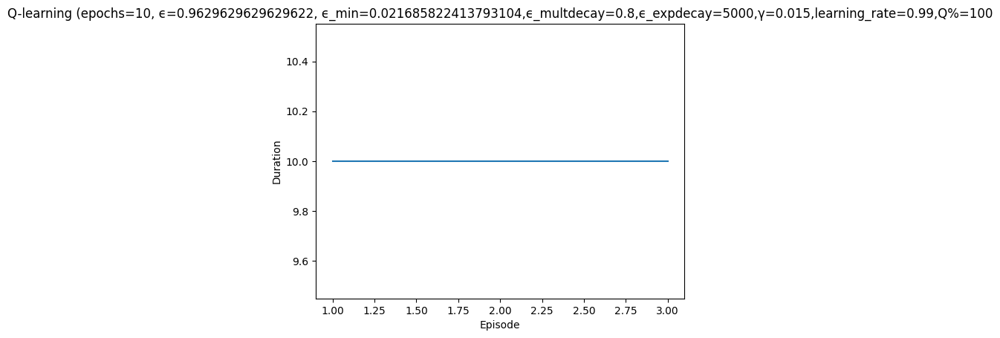

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 4/10 'Q-learning' ϵ=0.7660, γ=0.015,learning_rate=0.99,Q%=100


Episode 4|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 4|Iteration 8|reward:  -40.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 4|Iteration 9|reward:  -45.0|last_reward_at: ----|Elapsed Time: 0:00:00||

{'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 4|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Attacker reward: -5.0
  Episode 4 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/10 (0.00)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 1


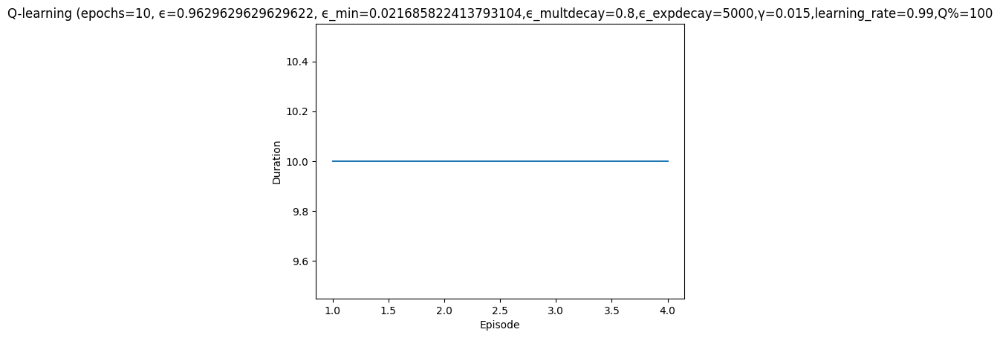

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 5/10 'Q-learning' ϵ=0.7645, γ=0.015,learning_rate=0.99,Q%=100


Episode 5|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 5|Iteration 5|reward:  -25.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 5|Iteration 8|reward:  -40.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 5|Iteration 9|reward:  -45.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 5|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Attacker reward: -5.0
  Episode 5 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/10 (0.00)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


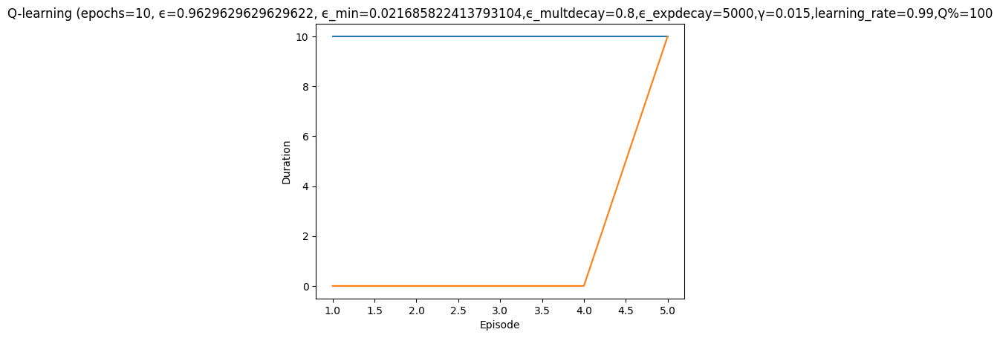

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 6/10 'Q-learning' ϵ=0.7630, γ=0.015,learning_rate=0.99,Q%=100


Episode 6|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 6|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}


Episode 6|Iteration 6|reward:  -30.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executi

Episode 6|Iteration 7|reward:  -35.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}


Episode 6|Iteration 9|reward:  -45.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 6|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
  Episode 6 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/10 (0.00)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


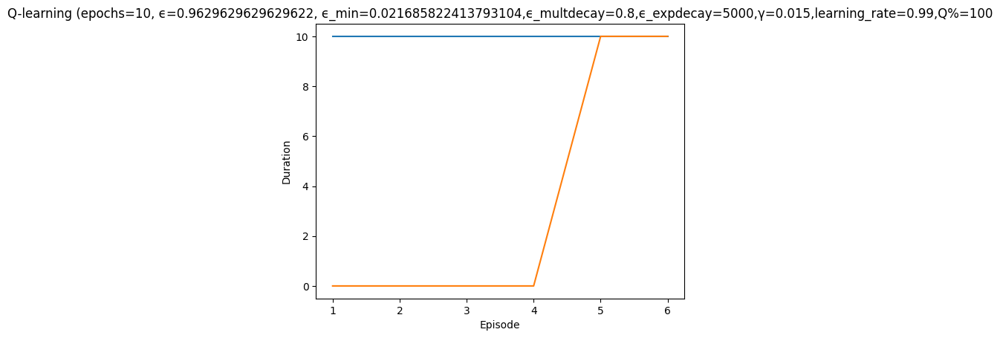

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 7/10 'Q-learning' ϵ=0.7615, γ=0.015,learning_rate=0.99,Q%=100


Episode 7|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 7|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 7|Iteration 7|reward:  -35.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executi

Episode 7|Iteration 8|reward:  -40.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 7|Iteration 9|reward:  -45.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}


Episode 7|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
  Episode 7 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/10 (0.00)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


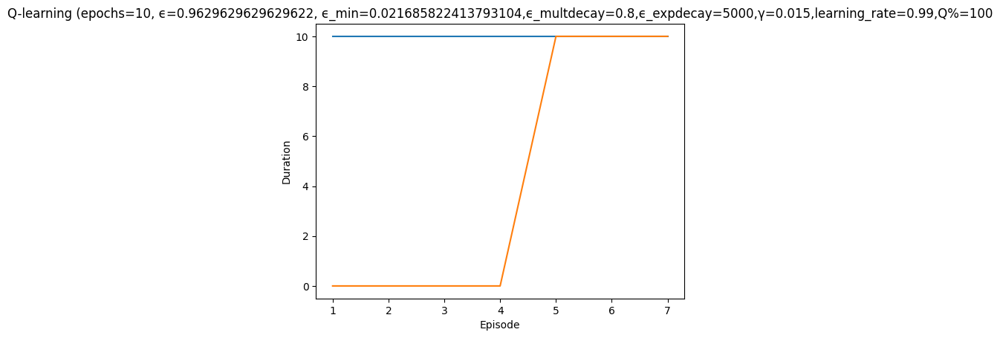

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 8/10 'Q-learning' ϵ=0.7601, γ=0.015,learning_rate=0.99,Q%=100


Episode 8|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 8|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 8|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: 

Episode 8|Iteration 7|reward:  -16.0|last_reward_at:    7|Elapsed Time: 0:00:00||

{'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local

Episode 8|Iteration 10|reward:  -29.0|last_reward_at:   10|Elapsed Time: 0:00:00||


-5.0
Step called with action: {'connect': array([0, 1, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17bf4310>)
Attacker reward: 2.0
  Episode 8 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 1/7 (0.12)
    explore-connect: 0/1 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to explor

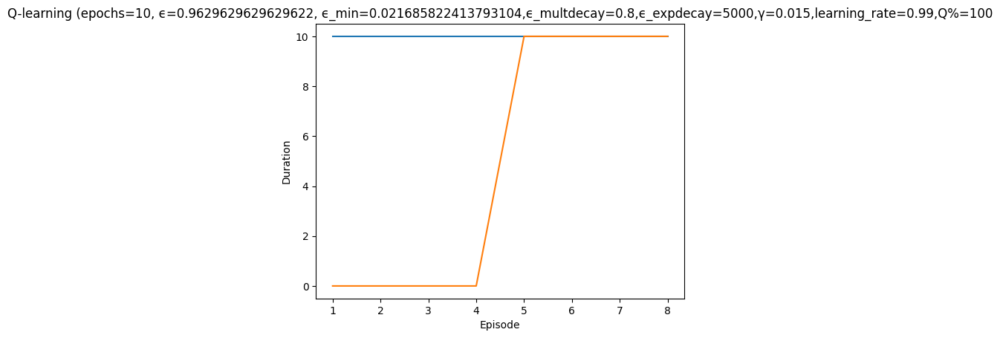

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 9/10 'Q-learning' ϵ=0.7586, γ=0.015,learning_rate=0.99,Q%=100


Episode 9|Iteration 1|reward:   14.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1])}
Executing attacker action {'local_vulnerability': array([0, 1])}
attacker Action being executed: {'local_vulnerability': array([0, 1])}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17d66700>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)


Episode 9|Iteration 2|reward:    4.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Attacker reward: -10
Step called with action: {'connect': array([0, 1, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)


Episode 9|Iteration 3|reward:   -6.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action 

Episode 9|Iteration 5|reward:  -21.0|last_reward_at:    1|Elapsed Time: 0:00:00||

{'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 0, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: 

Episode 9|Iteration 9|reward:  -47.0|last_reward_at:    6|Elapsed Time: 0:00:00||

{'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa40315970>)
Attacker reward: 4.0
Step called with action: {'connect': array([0, 0, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'c

Episode 9|Iteration 10|reward:  -57.0|last_reward_at:    6|Elapsed Time: 0:00:00||


Attacker reward: -10.0
  Episode 9 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 1/1 (0.50)
    explore-connect: 0/7 (0.00)
    exploit-local: 1/0 (1.00)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 1


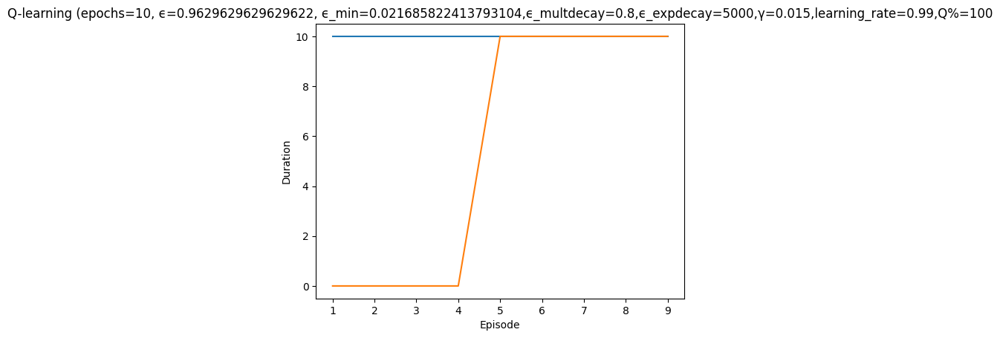

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 10/10 'Q-learning' ϵ=0.7571, γ=0.015,learning_rate=0.99,Q%=100


Episode 10|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 10|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 10|Iteration 4|reward:   -1.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17da01f0>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 10|Iteration 5|reward:   -6.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 1, 7, 0], dtype=int32)}


Episode 10|Iteration 6|reward:  -16.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Executing attacker action {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10


Episode 10|Iteration 7|reward:  -14.0|last_reward_at:    7|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17da9b50>)
Attacker reward: 2.0
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)


Episode 10|Iteration 10|reward:  -40.0|last_reward_at:    7|Elapsed Time: 0:00:00||


Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17da9b50>)
Attacker reward: -6.0
Step called with action: {'connect': array([0, 0, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
  Episode 10 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 1/5 (0.17)
    explore-connect: 0/3 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit 

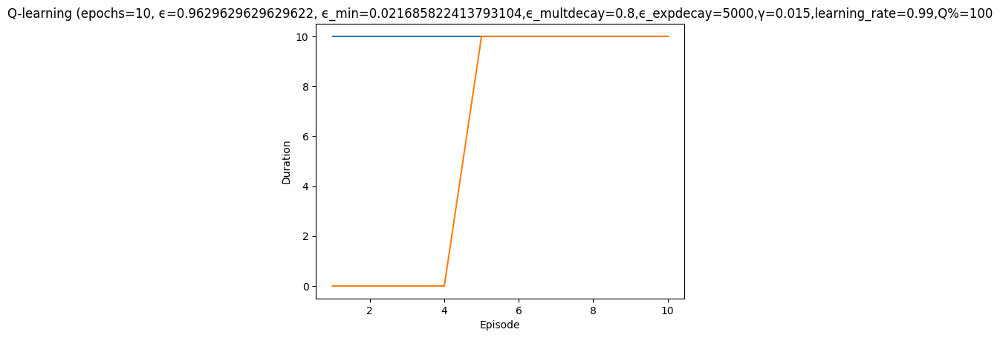

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


simulation ended


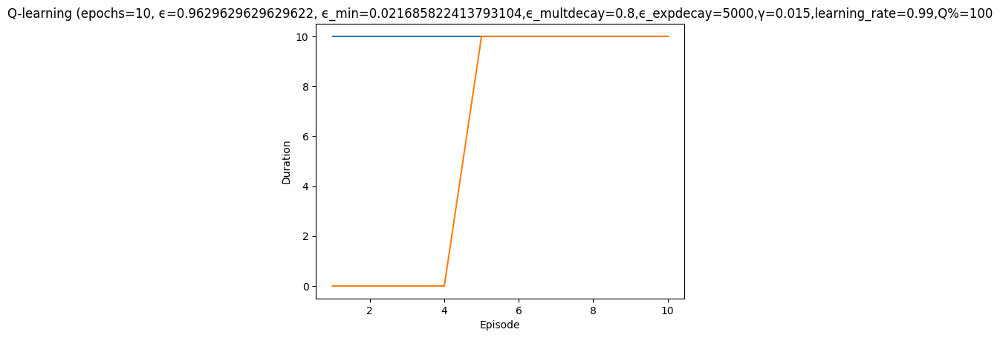

###### Q-learning
Learning with: episode_count=10,iteration_count=10,ϵ=0.9629629629629622,ϵ_min=0.024022986896551725, ϵ_multdecay=0.8,ϵ_expdecay=5000,γ=0.015,learning_rate=0.99,Q%=100
  ## Episode: 1/10 'Q-learning' ϵ=0.9630, γ=0.015,learning_rate=0.99,Q%=100


Episode 1|Iteration 10|reward:  -33.0|last_reward_at:    3|Elapsed Time: 0:00:00||


Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa4035d1f0>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa179ea6d0>)
Attacker reward: 2.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': 

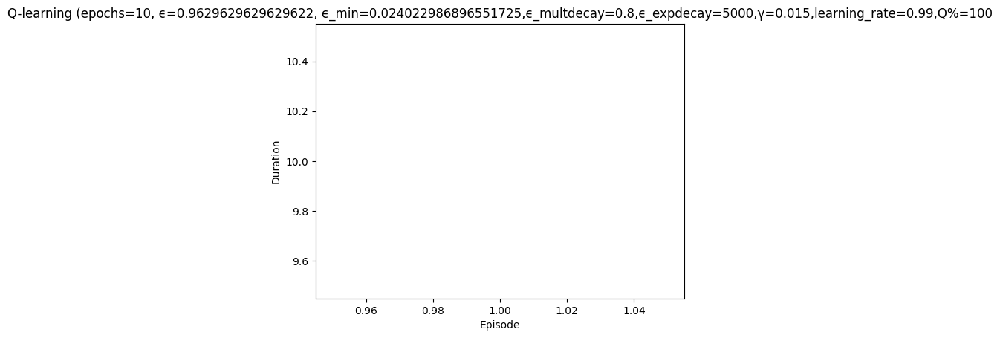

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 2/10 'Q-learning' ϵ=0.7690, γ=0.015,learning_rate=0.99,Q%=100


Episode 2|Iteration 4|reward:    3.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17ae18b0>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Att

Episode 2|Iteration 6|reward:   -5.0|last_reward_at:    4|Elapsed Time: 0:00:00||

{'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17ae18b0>)
Attacker reward: -2.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa17caee50>)
Attacker reward: -6.0


Episode 2|Iteration 10|reward:  -35.0|last_reward_at:    4|Elapsed Time: 0:00:00||


Step called with action: {'connect': array([0, 0, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 1, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtyp

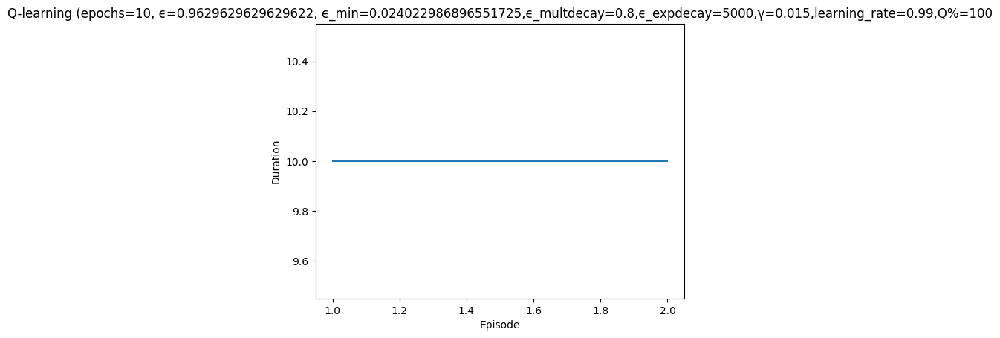

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 3/10 'Q-learning' ϵ=0.7675, γ=0.015,learning_rate=0.99,Q%=100


Episode 3|Iteration 6|reward:  -30.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 3|Iteration 7|reward:  -35.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 3|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
  Episo

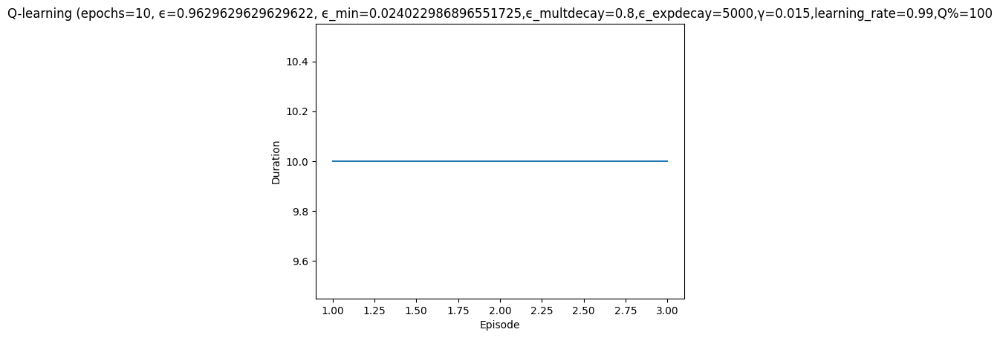

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 4/10 'Q-learning' ϵ=0.7660, γ=0.015,learning_rate=0.99,Q%=100


Episode 4|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 4|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 4|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 4|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


  Episode 4 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/10 (0.00)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


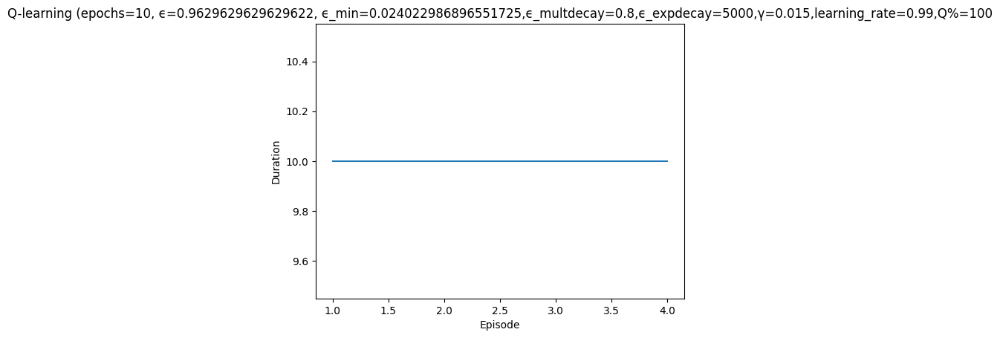

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 5/10 'Q-learning' ϵ=0.7645, γ=0.015,learning_rate=0.99,Q%=100


Episode 5|Iteration 5|reward:   -6.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 5|Iteration 5|reward:   -6.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}


Episode 5|Iteration 8|reward:  -18.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa4036db80>)
Attacker reward: -2.0
Step called with action: {'remo

Episode 5|Iteration 9|reward:  -23.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}


Episode 5|Iteration 10|reward:  -19.0|last_reward_at:   10|Elapsed Time: 0:00:00||


Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7fa9c0c35310>)
Attacker reward: 4.0
  Episode 5 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 1/7 (0.12)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 1


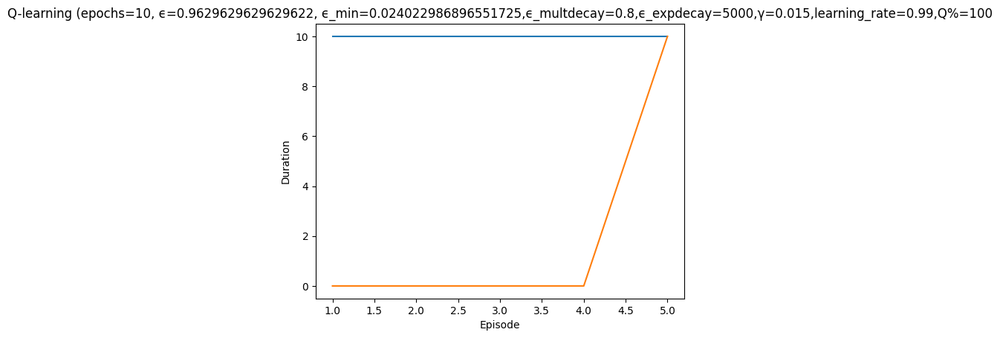

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 6/10 'Q-learning' ϵ=0.7630, γ=0.015,learning_rate=0.99,Q%=100


Episode 6|Iteration 5|reward:   -6.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 6|Iteration 8|reward:  -22.0|last_reward_at:    7|Elapsed Time: 0:00:00||

attacker Action being executed: {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7fa9c0db5cd0>)
Attacker reward: 4.0
Step called with action: {'connect': array([0, 1, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 1, 0], dtype=int32)}
attacke

Episode 6|Iteration 9|reward:  -32.0|last_reward_at:    7|Elapsed Time: 0:00:00||

Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}


Episode 6|Iteration 10|reward:  -37.0|last_reward_at:    7|Elapsed Time: 0:00:00||


Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
  Episode 6 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 1/5 (0.17)
    explore-connect: 0/3 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


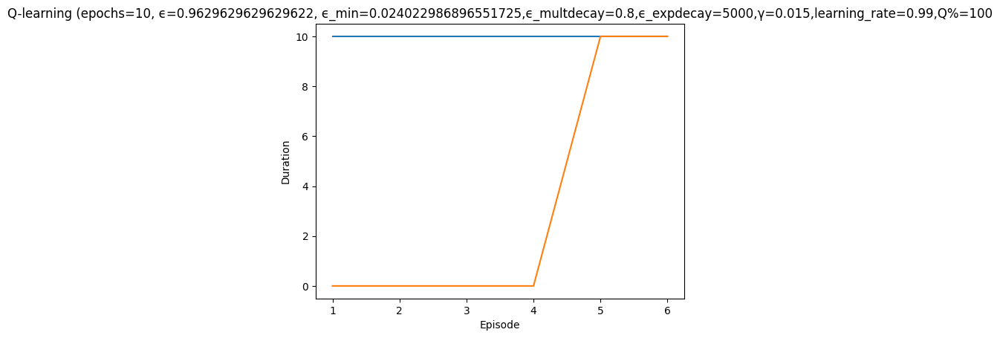

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 7/10 'Q-learning' ϵ=0.7616, γ=0.015,learning_rate=0.99,Q%=100


Episode 7|Iteration 2|reward:    9.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0bcee20>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Att

Episode 7|Iteration 7|reward:  -33.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 1, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0bcee20>)
Attacker reward: -2.0
Step called with action: {'connect': array([0, 0, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step calle

Episode 7|Iteration 10|reward:  -35.0|last_reward_at:    9|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa179e99d0>)
Attacker reward: 2.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0bcee20>)
Attacker reward: -2.0
  Episode 7 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/3 (0.25)
    explore-remote: 1/1 (0.50)
    explore-connect: 0/4 (0.00)
    exploit-local: 0/0 (NaN)
    ex

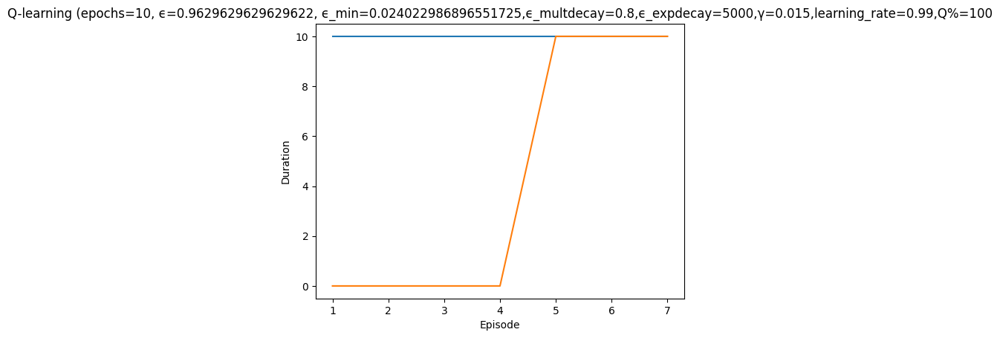

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 8/10 'Q-learning' ϵ=0.7601, γ=0.015,learning_rate=0.99,Q%=100


Episode 8|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 8|Iteration 5|reward:  -25.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 8|Iteration 10|reward:  -36.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0d2f970>)
Attacker reward: 14.0
Step called with action: {'remo

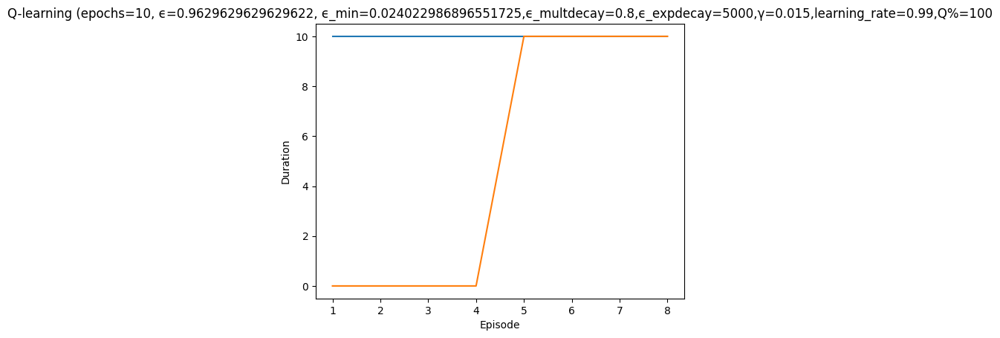

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 9/10 'Q-learning' ϵ=0.7586, γ=0.015,learning_rate=0.99,Q%=100


Episode 9|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 9|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 9|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action 

Episode 9|Iteration 10|reward:  -36.0|last_reward_at:    7|Elapsed Time: 0:00:00||


{'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0cf5130>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([

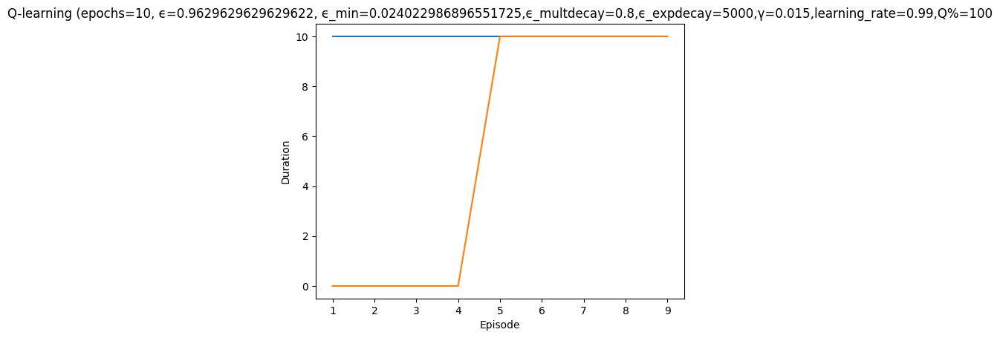

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 10/10 'Q-learning' ϵ=0.7571, γ=0.015,learning_rate=0.99,Q%=100


Episode 10|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 10|Iteration 8|reward:  -21.0|last_reward_at:    8|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 10|Iteration 10|reward:   77.0|last_reward_at:   10|Elapsed Time: 0:00:00||


Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17e12310>)
Attacker reward: -2.0
Step called with action: {'connect': array([0, 1, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=100.0, outcome=<cyberbattle.simulation.model.LateralMove object at 0x7fa9c0bcebe0>)
Attacker reward: 100.0
  Episode 10 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 0/7 (0.00)
    explore-connect: 1/0 (1.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
 

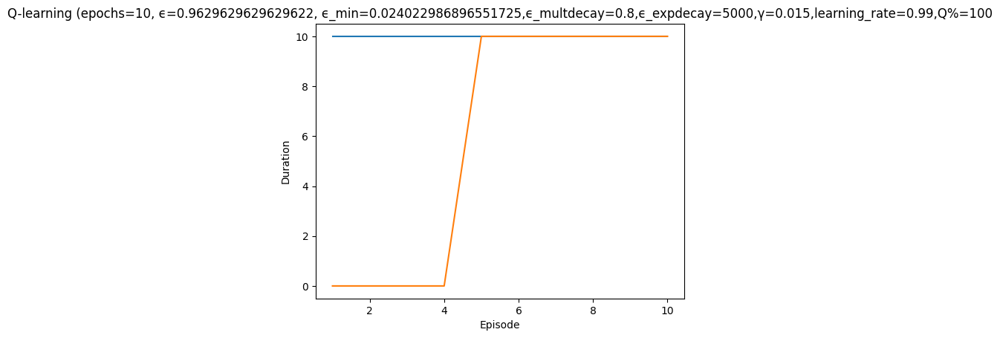

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[ScanExplorerRecentFiles, CrackKeepPassX, Scan...","[ProbeWindows, ProbeLinux]"


simulation ended


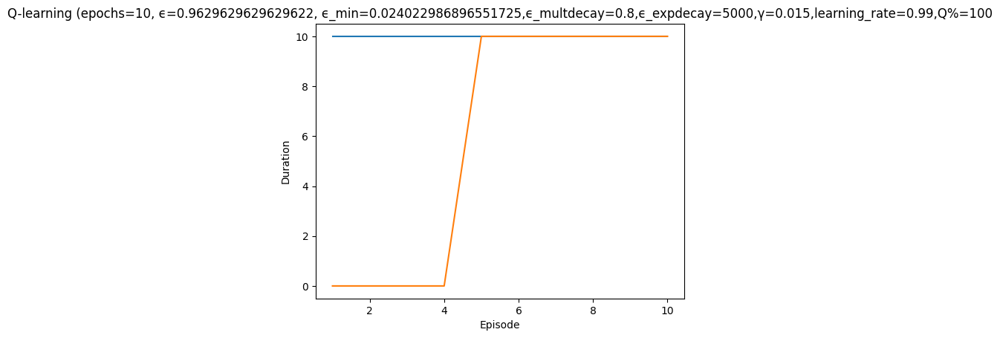

###### Q-learning
Learning with: episode_count=10,iteration_count=10,ϵ=0.9629629629629622,ϵ_min=0.026360151379310345, ϵ_multdecay=0.8,ϵ_expdecay=5000,γ=0.015,learning_rate=0.99,Q%=100
  ## Episode: 1/10 'Q-learning' ϵ=0.9630, γ=0.015,learning_rate=0.99,Q%=100


Episode 1|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

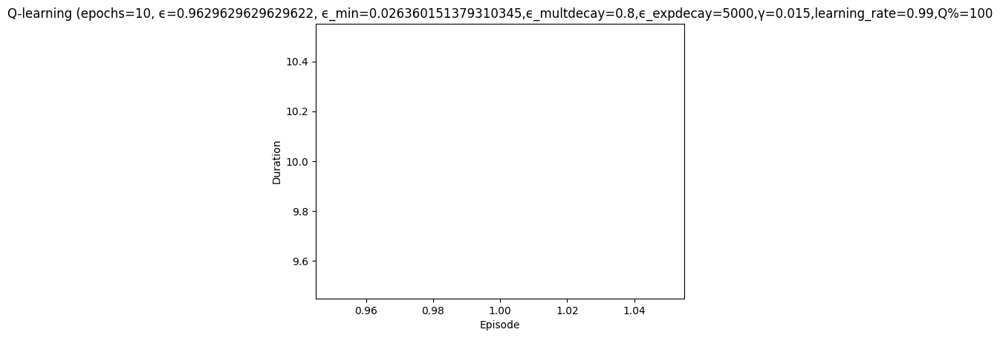

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 2/10 'Q-learning' ϵ=0.7690, γ=0.015,learning_rate=0.99,Q%=100


Episode 2|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 2|Iteration 6|reward:  -16.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 0, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 2|Iteration 10|reward:  -32.0|last_reward_at:   10|Elapsed Time: 0:00:00||


Attacker reward: -5.0
Step called with action: {'connect': array([0, 1, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded o

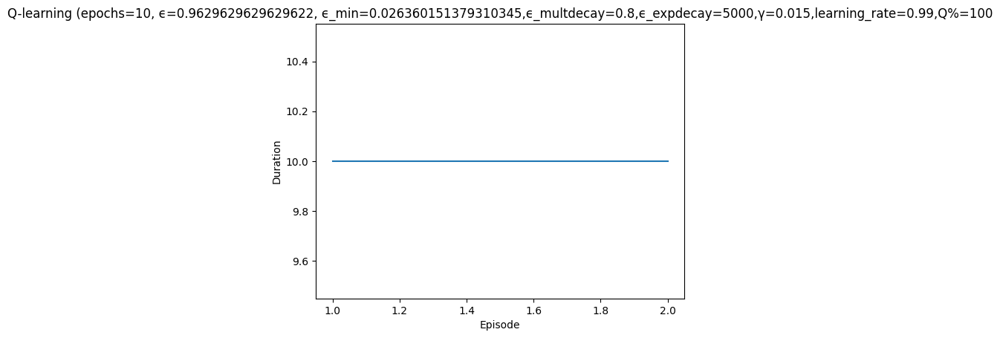

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 3/10 'Q-learning' ϵ=0.7675, γ=0.015,learning_rate=0.99,Q%=100


Episode 3|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0d51670>)
Attacker reward: 14.0


Episode 3|Iteration 4|reward:   -2.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 1, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 0, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa17a382b0>)
Attacker reward: 4.0
Ste

Episode 3|Iteration 6|reward:  -17.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 3|Iteration 10|reward:  -35.0|last_reward_at:    9|Elapsed Time: 0:00:00||


Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7fa9c0cb8a00>)
Attacker reward: 2.0
Step called with action: {'connect': array([0, 0, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 6, 0], dtype=int32)}
attacker action:  ActionResult(rew

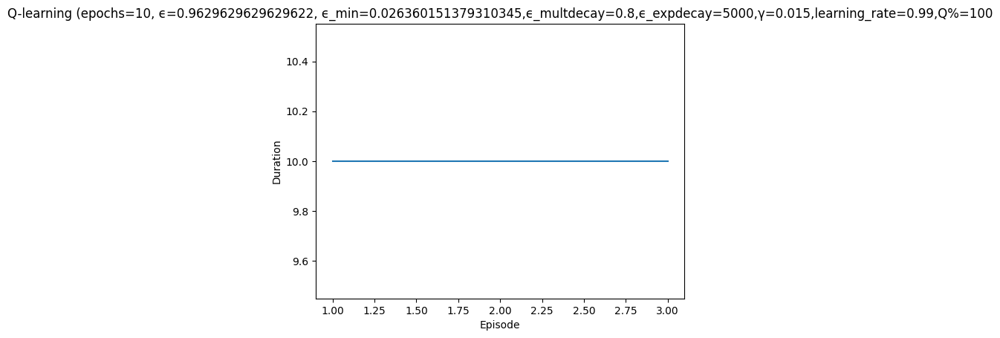

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 4/10 'Q-learning' ϵ=0.7660, γ=0.015,learning_rate=0.99,Q%=100


Episode 4|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 4|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 4|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 4|Iteration 8|reward:  -19.0|last_reward_at:    7|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0d51580>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult

Episode 4|Iteration 9|reward:  -25.0|last_reward_at:    7|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa1789e460>)
Attacker reward: -6.0
Step called with action: {'connect': array([0, 1, 5, 0], dtype=int32)}


Episode 4|Iteration 10|reward:  -35.0|last_reward_at:    7|Elapsed Time: 0:00:00||


Executing attacker action {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
  Episode 4 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 1/6 (0.14)
    explore-connect: 0/2 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 1


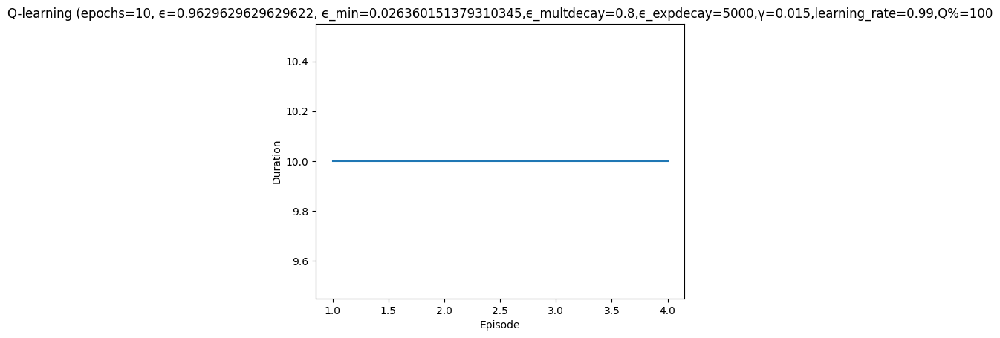

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 5/10 'Q-learning' ϵ=0.7645, γ=0.015,learning_rate=0.99,Q%=100


Episode 5|Iteration 10|reward:  -39.0|last_reward_at:   10|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

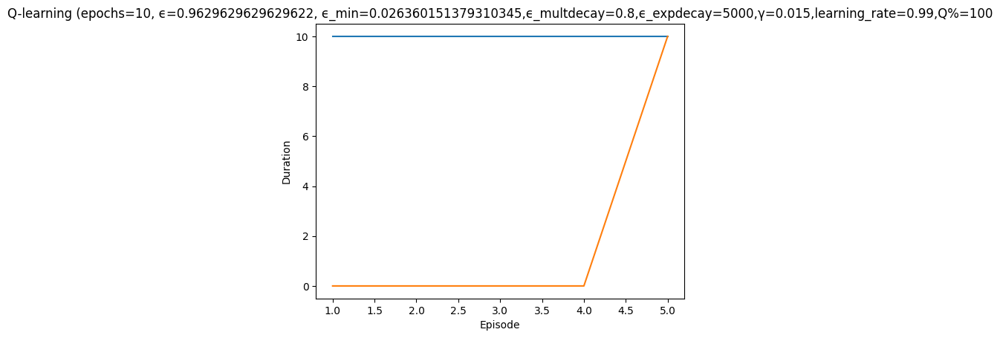

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 6/10 'Q-learning' ϵ=0.7631, γ=0.015,learning_rate=0.99,Q%=100


Episode 6|Iteration 1|reward:   14.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17a380d0>)
Attacker reward: 14.0


Episode 6|Iteration 10|reward:  -29.0|last_reward_at:    9|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7fa9c0d0e0a0>)
Attacker reward: 2.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17a380d0>)
Attacker reward: -2.0
Step called with action: {'connect': array([0, 0, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 5, 0], dtype=int32)}

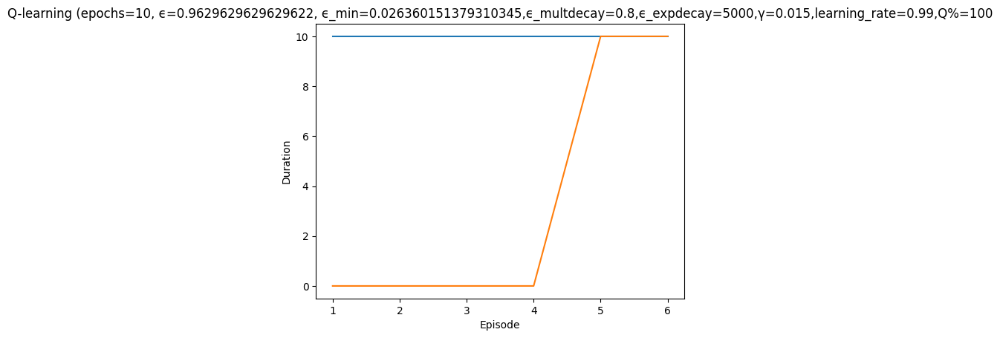

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 7/10 'Q-learning' ϵ=0.7616, γ=0.015,learning_rate=0.99,Q%=100


Episode 7|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 7|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 7|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 7|Iteration 10|reward:  -31.0|last_reward_at:   10|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

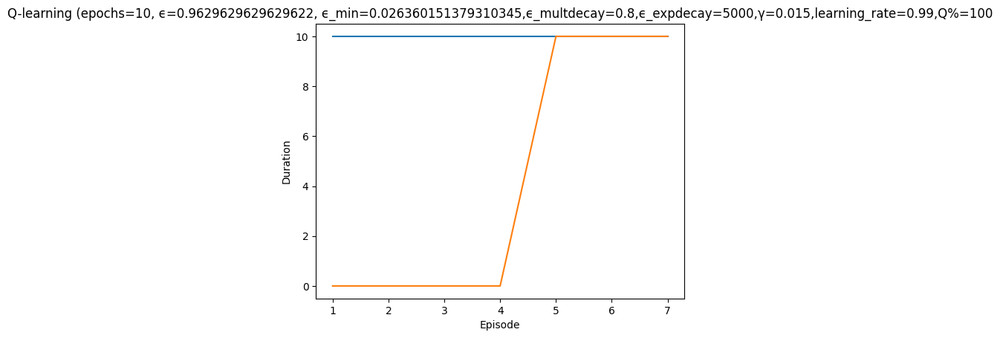

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 8/10 'Q-learning' ϵ=0.7601, γ=0.015,learning_rate=0.99,Q%=100


Episode 8|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: 

Episode 8|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

{'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa1792e6a0>)
Attacker reward: 14.0


Episode 8|Iteration 3|reward:    4.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 1, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)


Episode 8|Iteration 10|reward:  -43.0|last_reward_at:    3|Elapsed Time: 0:00:00||


Attacker reward: -10
Step called with action: {'connect': array([0, 0, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa1792e6a0>)
Attacker reward: -2.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.

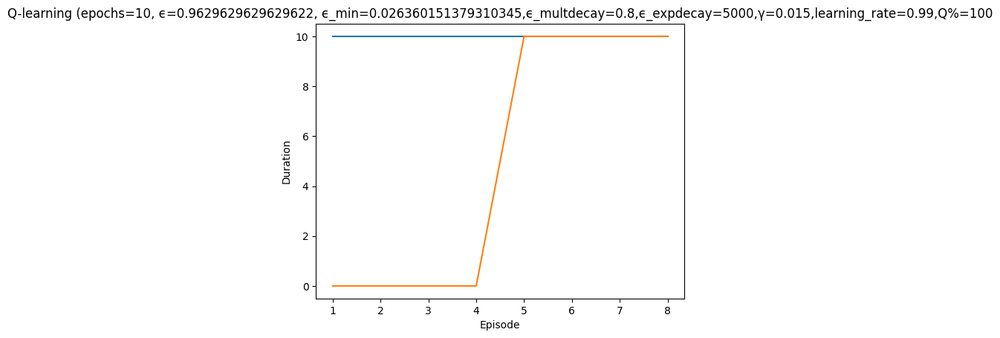

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 9/10 'Q-learning' ϵ=0.7586, γ=0.015,learning_rate=0.99,Q%=100


Episode 9|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 9|Iteration 3|reward:    4.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17aa1e80>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 6, 0], dtype=int32)}


Episode 9|Iteration 4|reward:   -6.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Executing attacker action {'connect': array([0, 0, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10


Episode 9|Iteration 10|reward:   66.0|last_reward_at:   10|Elapsed Time: 0:00:00||


Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'connect': array([0, 0, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17aa1e80>)
Attacker reward: -2.0
Step calle

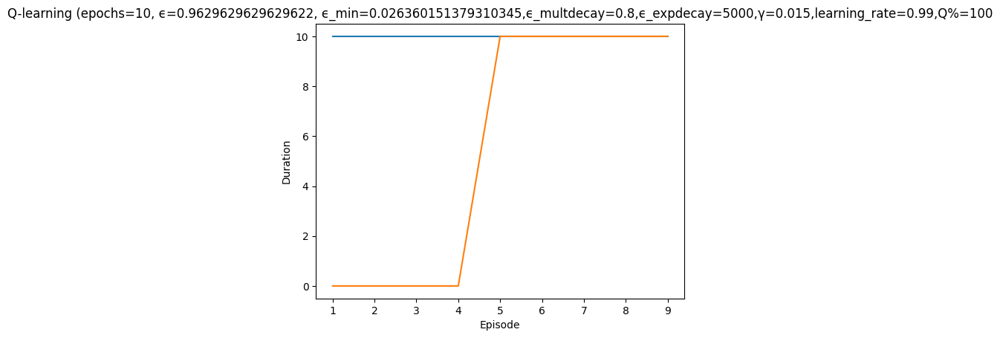

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[ScanExplorerRecentFiles, CrackKeepPassX, Scan...","[ProbeWindows, ProbeLinux]"


  ## Episode: 10/10 'Q-learning' ϵ=0.7572, γ=0.015,learning_rate=0.99,Q%=100


Episode 10|Iteration 9|reward:  -41.0|last_reward_at:    9|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17e183d0>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 1, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Att

Episode 10|Iteration 10|reward:  -46.0|last_reward_at:    9|Elapsed Time: 0:00:00||


Attacker reward: -5.0
  Episode 10 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 1/2 (0.33)
    explore-connect: 0/5 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 1


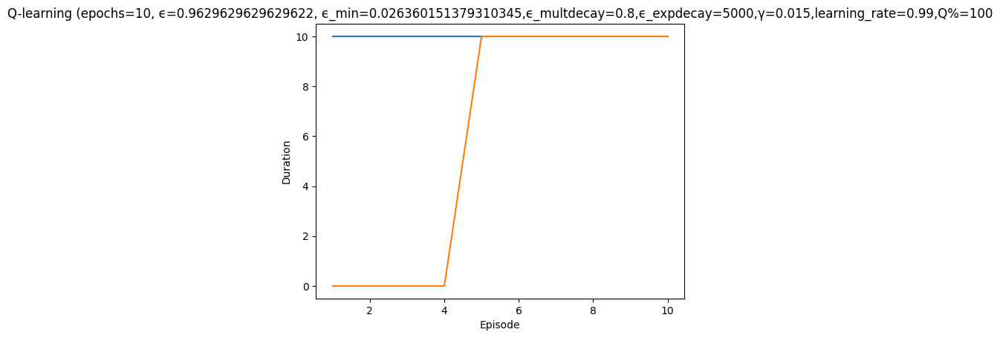

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


simulation ended


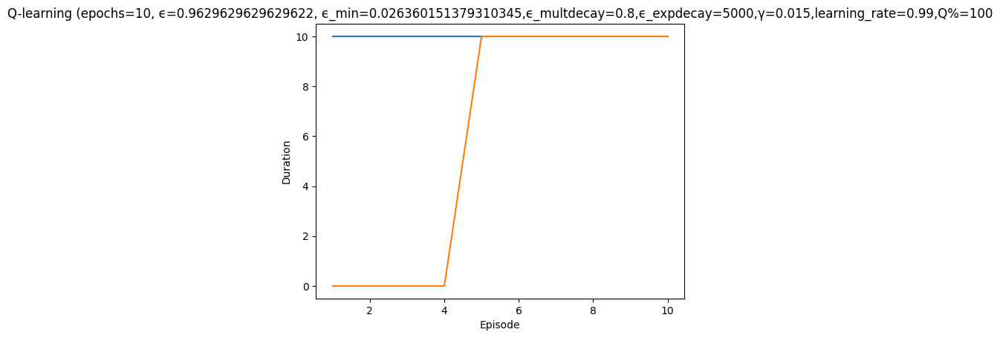

###### Q-learning
Learning with: episode_count=10,iteration_count=10,ϵ=0.9629629629629622,ϵ_min=0.028697315862068966, ϵ_multdecay=0.8,ϵ_expdecay=5000,γ=0.015,learning_rate=0.99,Q%=100
  ## Episode: 1/10 'Q-learning' ϵ=0.9630, γ=0.015,learning_rate=0.99,Q%=100


Episode 1|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

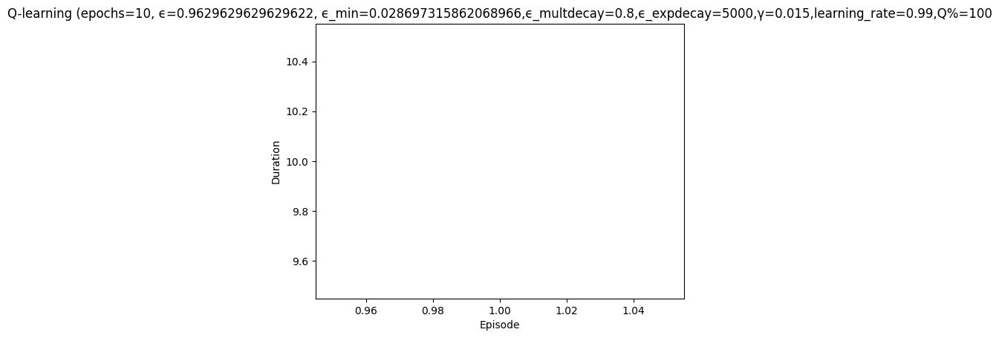

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 2/10 'Q-learning' ϵ=0.7690, γ=0.015,learning_rate=0.99,Q%=100


Episode 2|Iteration 7|reward:  -36.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17b41370>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
A

Episode 2|Iteration 8|reward:  -46.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Attacker reward: -10
Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0


Episode 2|Iteration 10|reward:  -66.0|last_reward_at:    2|Elapsed Time: 0:00:00||


Step called with action: {'connect': array([0, 1, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
  Episode 2 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 0/2 (0.00)
    explore-connect: 0/7 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


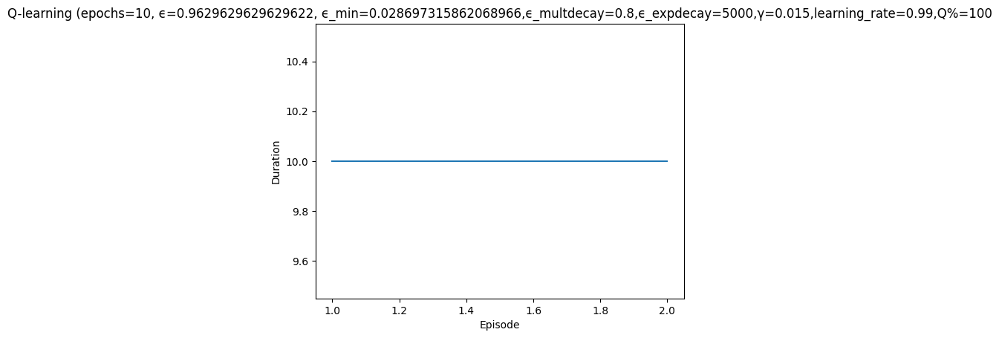

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 3/10 'Q-learning' ϵ=0.7675, γ=0.015,learning_rate=0.99,Q%=100


Episode 3|Iteration 6|reward:  -30.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 3|Iteration 7|reward:  -35.0|last_reward_at: ----|Elapsed Time: 0:00:00||

{'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 3|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
  Episo

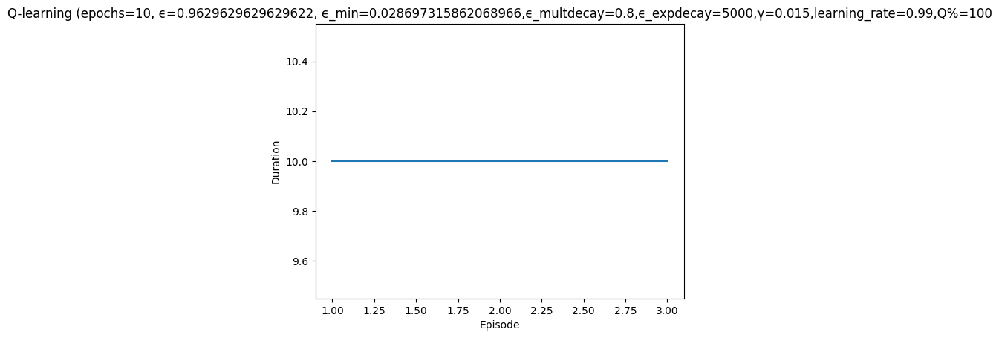

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 4/10 'Q-learning' ϵ=0.7660, γ=0.015,learning_rate=0.99,Q%=100


Episode 4|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 4|Iteration 10|reward:  -24.0|last_reward_at:    7|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17dc76d0>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa4025f700>)
Attacker reward: 4.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array(

  Episode 4 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 1/6 (0.14)
    explore-connect: 0/1 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 2


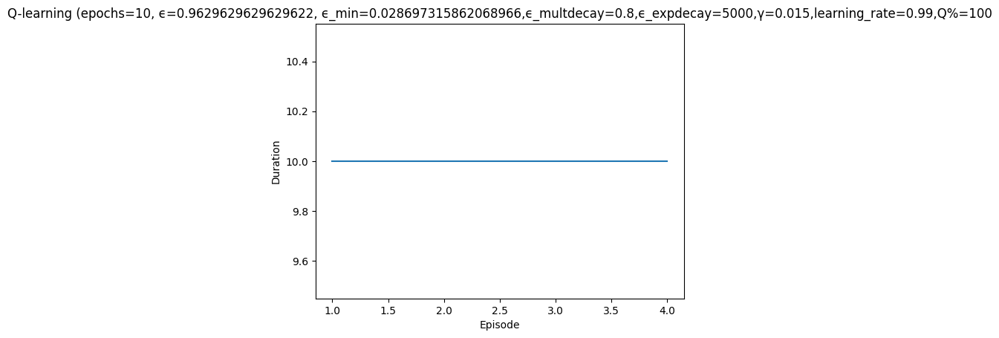

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 5/10 'Q-learning' ϵ=0.7646, γ=0.015,learning_rate=0.99,Q%=100


Episode 5|Iteration 4|reward:   -6.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials

Episode 5|Iteration 7|reward:  -12.0|last_reward_at:    7|Elapsed Time: 0:00:00||

{'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa

Episode 5|Iteration 10|reward:  -32.0|last_reward_at:    7|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
  Episode 5 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 1/6 (0.14)
    explore-connect: 0/2 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


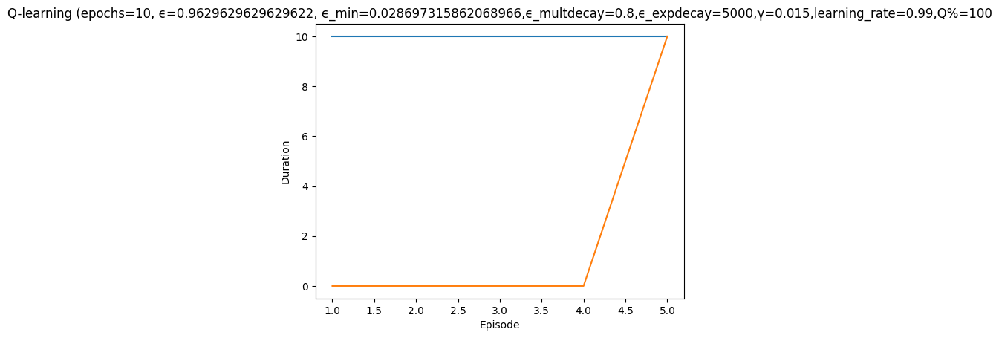

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 6/10 'Q-learning' ϵ=0.7631, γ=0.015,learning_rate=0.99,Q%=100


Episode 6|Iteration 3|reward:    4.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17e852b0>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult

Episode 6|Iteration 4|reward:   -6.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Attacker reward: -10
Step called with action: {'connect': array([0, 1, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)


Episode 6|Iteration 9|reward:  -29.0|last_reward_at:    8|Elapsed Time: 0:00:00||

Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17e852b0>)
Attacker reward: -2.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker 

Episode 6|Iteration 10|reward:  -39.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Step called with action: {'connect': array([0, 0, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
  Episode 6 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 1/3 (0.25)
    explore-connect: 0/4 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


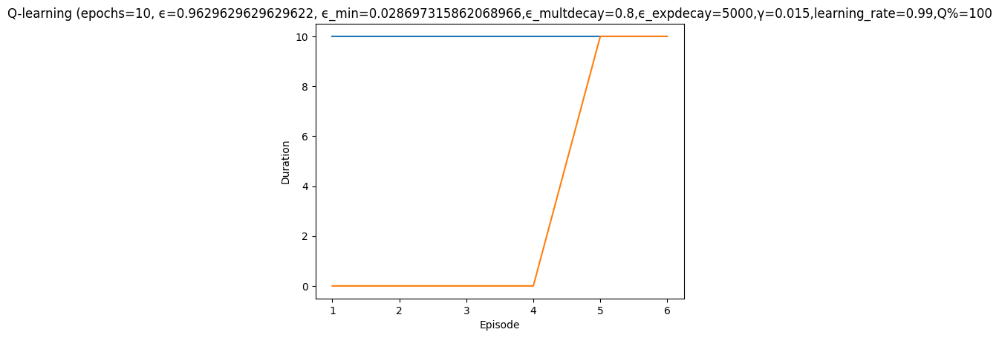

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 7/10 'Q-learning' ϵ=0.7616, γ=0.015,learning_rate=0.99,Q%=100


Episode 7|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 7|Iteration 5|reward:  -25.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 7|Iteration 7|reward:  -35.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 7|Iteration 8|reward:  -40.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 7|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
  Episode 7 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/10 (0.00)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


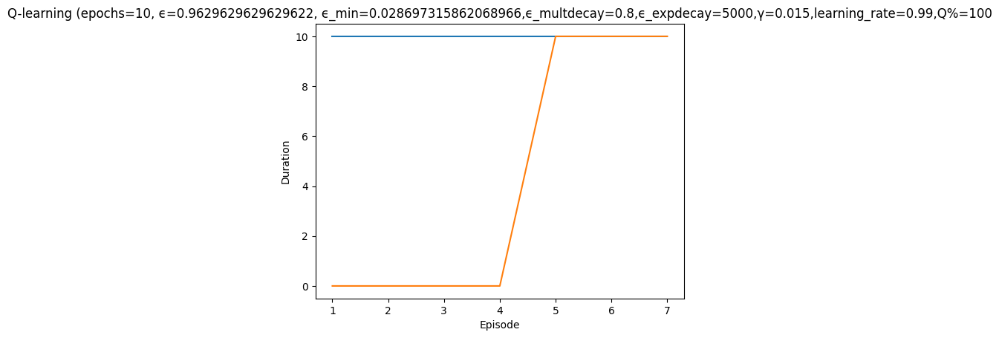

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 8/10 'Q-learning' ϵ=0.7601, γ=0.015,learning_rate=0.99,Q%=100


Episode 8|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 8|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 8|Iteration 8|reward:  -36.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17bada90>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 1, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 0, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step calle

Episode 8|Iteration 9|reward:  -46.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 0, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10


Episode 8|Iteration 10|reward:  -56.0|last_reward_at:    4|Elapsed Time: 0:00:00||


Step called with action: {'connect': array([0, 0, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
  Episode 8 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 0/4 (0.00)
    explore-connect: 0/5 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


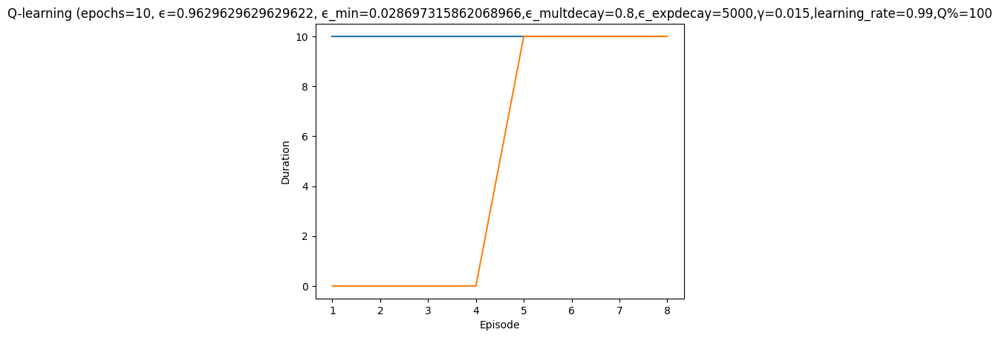

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 9/10 'Q-learning' ϵ=0.7587, γ=0.015,learning_rate=0.99,Q%=100


Episode 9|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 9|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 9|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 9|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

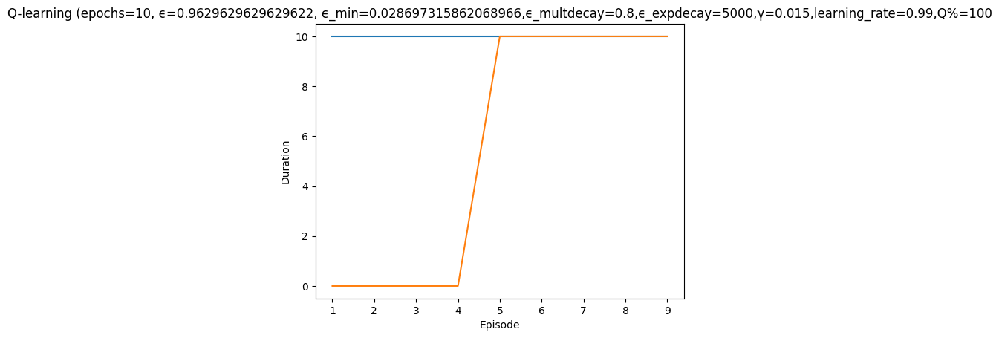

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 10/10 'Q-learning' ϵ=0.7572, γ=0.015,learning_rate=0.99,Q%=100


Episode 10|Iteration 10|reward:  -23.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

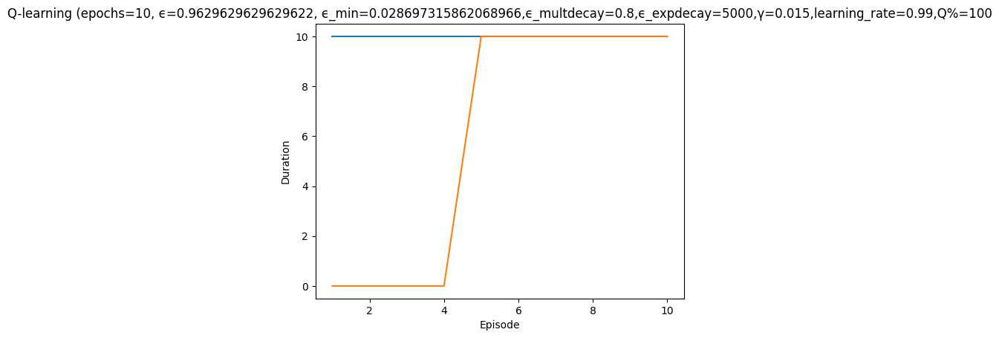

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


simulation ended


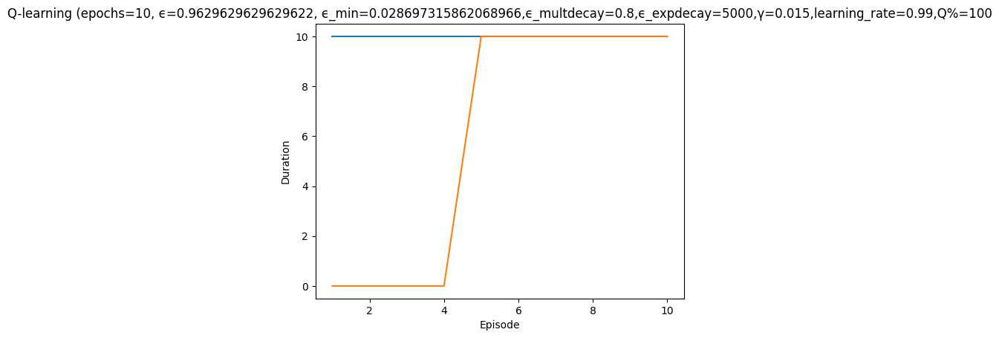

###### Q-learning
Learning with: episode_count=10,iteration_count=10,ϵ=0.9629629629629622,ϵ_min=0.031034480344827586, ϵ_multdecay=0.8,ϵ_expdecay=5000,γ=0.015,learning_rate=0.99,Q%=100
  ## Episode: 1/10 'Q-learning' ϵ=0.9630, γ=0.015,learning_rate=0.99,Q%=100


Episode 1|Iteration 10|reward:  -31.0|last_reward_at:   10|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

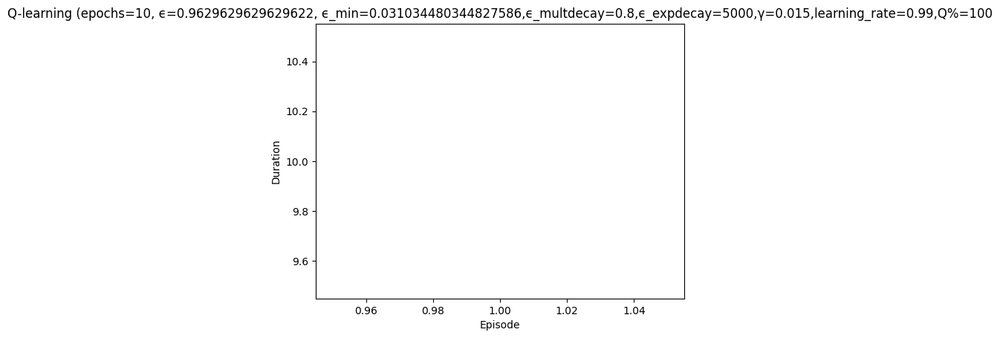

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 2/10 'Q-learning' ϵ=0.7690, γ=0.015,learning_rate=0.99,Q%=100


Episode 2|Iteration 2|reward:   16.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1])}
Executing attacker action {'local_vulnerability': array([0, 1])}
attacker Action being executed: {'local_vulnerability': array([0, 1])}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0be0310>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa178c4130>)
Attacker reward: 2.0


Episode 2|Iteration 3|reward:   20.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa178c4d00>)
Attacker reward: 4.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}


Episode 2|Iteration 10|reward:  -38.0|last_reward_at:    3|Elapsed Time: 0:00:00||


Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa178c4d00>)
Attacker reward: -6.0
Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'connect': array([0, 1, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing a

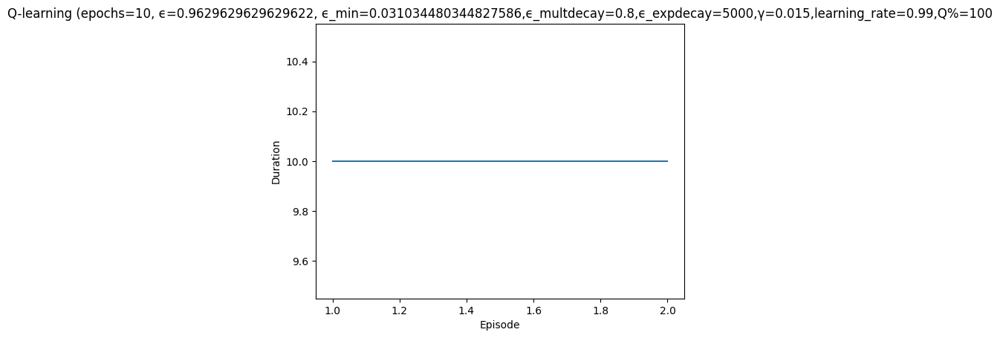

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 3/10 'Q-learning' ϵ=0.7675, γ=0.015,learning_rate=0.99,Q%=100


Episode 3|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}


Episode 3|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 3|Iteration 6|reward:  -30.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 3|Iteration 8|reward:  -40.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}


Episode 3|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
  Episode 3 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/10 (0.00)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


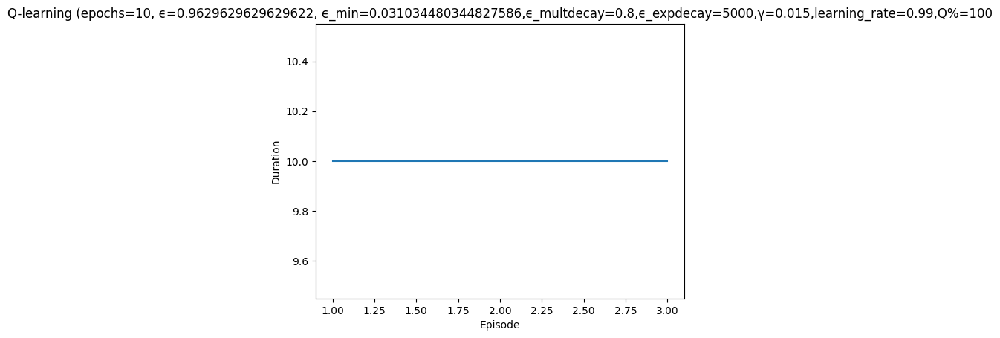

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 4/10 'Q-learning' ϵ=0.7661, γ=0.015,learning_rate=0.99,Q%=100


Episode 4|Iteration 3|reward:    8.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0ddad00>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 1, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattl

Episode 4|Iteration 6|reward:   -1.0|last_reward_at:    3|Elapsed Time: 0:00:00||

-2.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0ddad00>)
Attacker reward: -2.0
Step called with action: {'connect': array([0, 1, 3, 0], dtype=int32)}


Episode 4|Iteration 8|reward:  -21.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Executing attacker action {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'connect': array([0, 0, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: 

Episode 4|Iteration 10|reward:  -36.0|last_reward_at:    3|Elapsed Time: 0:00:00||


{'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 1, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
  Episode 4 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/2 (0.33)
    explore-remote: 1/2 (0.33)
    explore-connect: 0/4 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


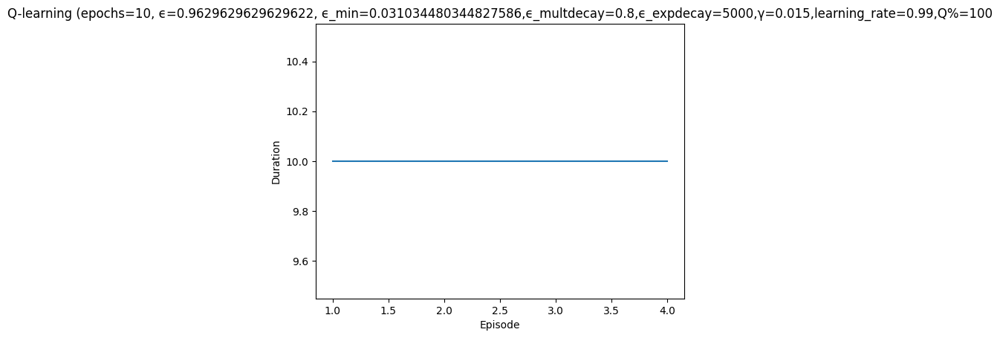

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 5/10 'Q-learning' ϵ=0.7646, γ=0.015,learning_rate=0.99,Q%=100


Episode 5|Iteration 3|reward:   13.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17a2e370>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult

Episode 5|Iteration 4|reward:  113.0|last_reward_at:    4|Elapsed Time: 0:00:00||

attacker action:  ActionResult(reward=100.0, outcome=<cyberbattle.simulation.model.LateralMove object at 0x7faa17a2efd0>)
Attacker reward: 100.0


Episode 5|Iteration 6|reward:  101.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 0, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17a2e370>)
Attacker reward: -2.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyber

Episode 5|Iteration 9|reward:   83.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 1, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17a2e370>)
Attacker reward: -2.0
Step called with action:

Episode 5|Iteration 10|reward:   73.0|last_reward_at:    4|Elapsed Time: 0:00:00||


 {'connect': array([0, 1, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
  Episode 5 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/2 (0.33)
    explore-remote: 1/2 (0.33)
    explore-connect: 1/3 (0.25)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


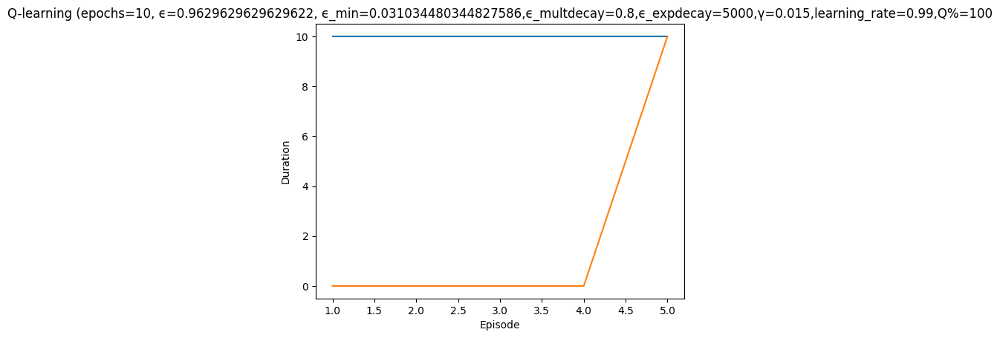

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[ScanExplorerRecentFiles, CrackKeepPassX, Scan...","[ProbeWindows, ProbeLinux]"


  ## Episode: 6/10 'Q-learning' ϵ=0.7631, γ=0.015,learning_rate=0.99,Q%=100


Episode 6|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials

Episode 6|Iteration 3|reward:    4.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}


Episode 6|Iteration 5|reward:   -4.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17d1d7c0>)
Attacker reward: 2.0
Step called with action: {'connect': array([0, 1, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'connect': array([0, 1, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 4, 0], dtype=int32)}
attacker action:  

Episode 6|Iteration 6|reward:  -14.0|last_reward_at:    4|Elapsed Time: 0:00:00||

ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17d1d7c0>)
Attacker reward:

Episode 6|Iteration 8|reward:  -22.0|last_reward_at:    4|Elapsed Time: 0:00:00||

 -6.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0d59d90>)
Attacker reward: -2.0
Step called with action: {'connect': array([0, 0, 5, 0], dtype=int32)}


Episode 6|Iteration 9|reward:  -32.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Executing attacker action {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}


Episode 6|Iteration 10|reward:  -28.0|last_reward_at:   10|Elapsed Time: 0:00:00||


Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa17c703a0>)
Attacker reward: 4.0
  Episode 6 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 2/3 (0.40)
    explore-connect: 0/3 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


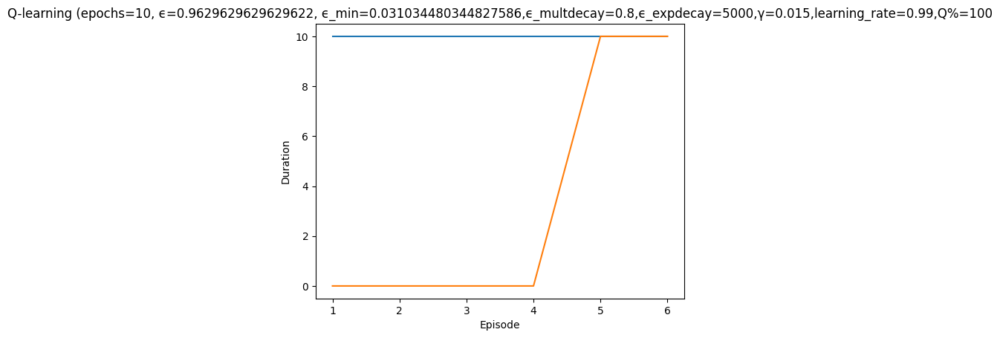

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 7/10 'Q-learning' ϵ=0.7616, γ=0.015,learning_rate=0.99,Q%=100


Episode 7|Iteration 2|reward:    4.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17a20dc0>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulatio

Episode 7|Iteration 3|reward:    2.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 1, 3, 0], dtype=int32)}


Episode 7|Iteration 5|reward:   -6.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Executing attacker action {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa179d4700>)
Attacker reward: 2.0
Step called with action: {'connect': array([0, 0, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10


Episode 7|Iteration 6|reward:  -16.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 0, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)


Episode 7|Iteration 8|reward:  -32.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa179d4700>)
Attacker reward: -6.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 7|Iteration 10|reward:  -47.0|last_reward_at:    5|Elapsed Time: 0:00:00||


Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
  Episode 7 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 1/2 (0.33)
    explore-connect: 0/5 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 1


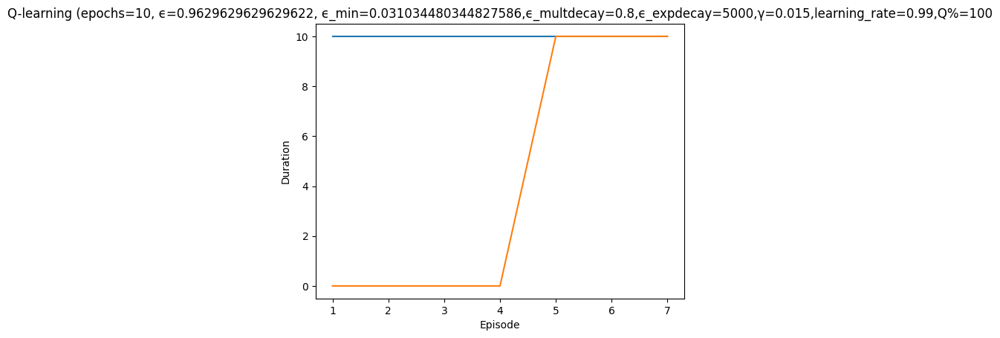

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 8/10 'Q-learning' ϵ=0.7602, γ=0.015,learning_rate=0.99,Q%=100


Episode 8|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action 

Episode 8|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

{'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 8|Iteration 6|reward:  -16.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0c1ac10>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 1, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}


Episode 8|Iteration 10|reward:  -31.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0c1ac10>)
Attacker reward: -2.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa179e9f70>)
Attacker reward: 2.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, ou

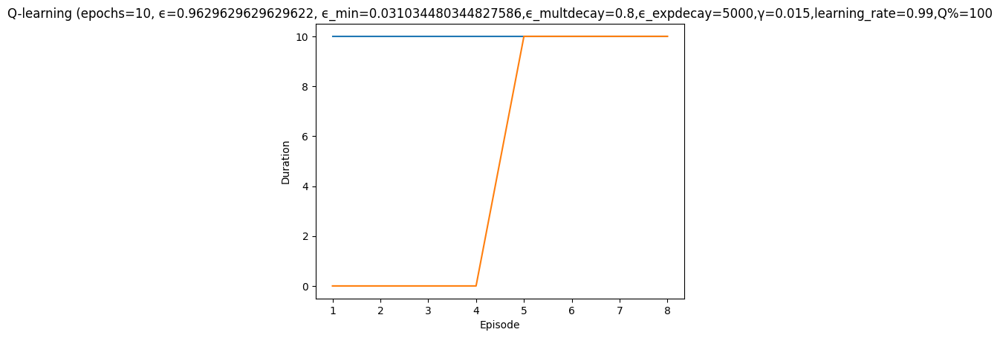

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 9/10 'Q-learning' ϵ=0.7587, γ=0.015,learning_rate=0.99,Q%=100


Episode 9|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 9|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

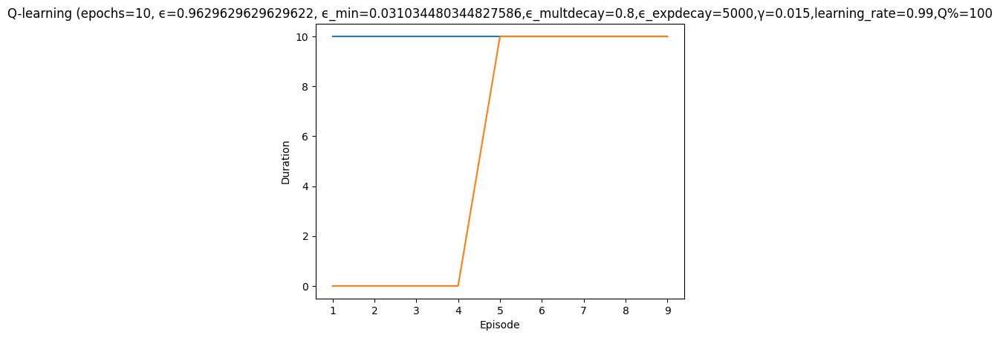

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 10/10 'Q-learning' ϵ=0.7572, γ=0.015,learning_rate=0.99,Q%=100


Episode 10|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}


Episode 10|Iteration 10|reward:   52.0|last_reward_at:    4|Elapsed Time: 0:00:00||


Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0c711c0>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 2, 0], dtype=

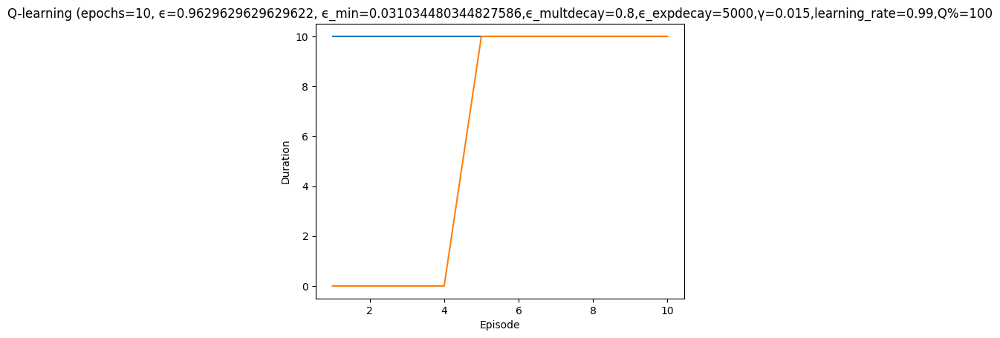

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[ScanExplorerRecentFiles, CrackKeepPassX, Scan...","[ProbeWindows, ProbeLinux]"


simulation ended


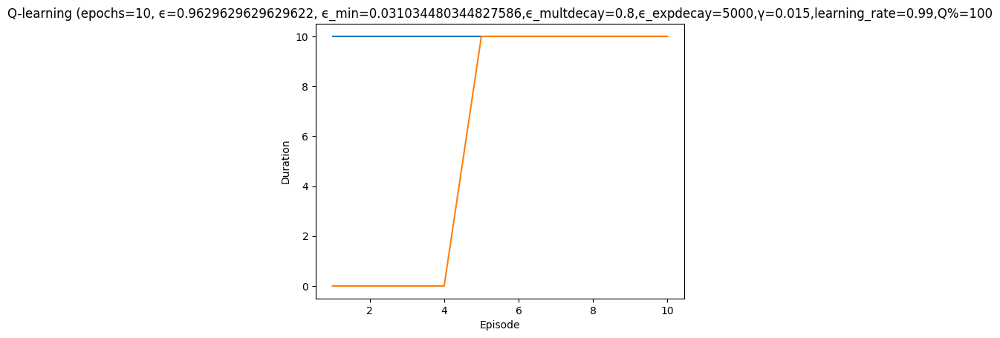

###### Q-learning
Learning with: episode_count=10,iteration_count=10,ϵ=0.9629629629629622,ϵ_min=0.03337164482758621, ϵ_multdecay=0.8,ϵ_expdecay=5000,γ=0.015,learning_rate=0.99,Q%=100
  ## Episode: 1/10 'Q-learning' ϵ=0.9630, γ=0.015,learning_rate=0.99,Q%=100


Episode 1|Iteration 10|reward:  -20.0|last_reward_at:    6|Elapsed Time: 0:00:00||


Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa1796daf0>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult

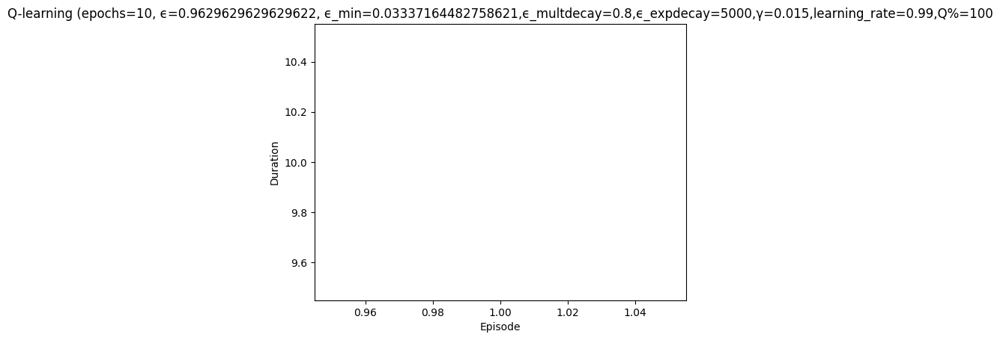

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 2/10 'Q-learning' ϵ=0.7690, γ=0.015,learning_rate=0.99,Q%=100


Episode 2|Iteration 4|reward:    3.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0c71460>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult

Episode 2|Iteration 6|reward:  -17.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 2|Iteration 10|reward:  -52.0|last_reward_at:    3|Elapsed Time: 0:00:00||


Attacker reward: -5.0
Step called with action: {'connect': array([0, 1, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 0, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
  Episode 2 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Succ

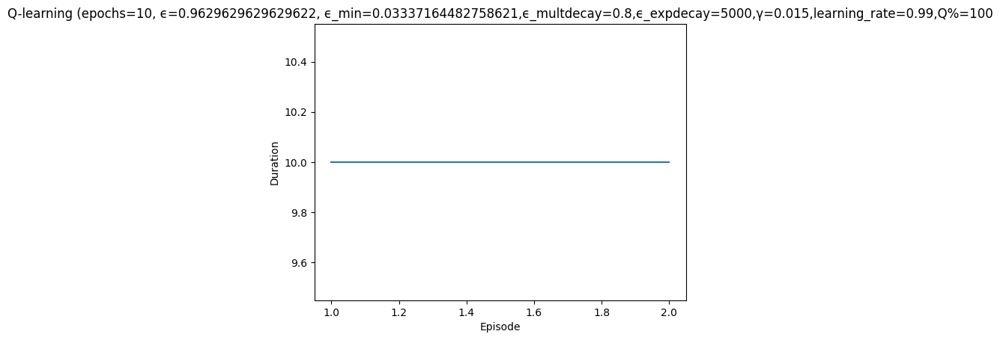

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 3/10 'Q-learning' ϵ=0.7675, γ=0.015,learning_rate=0.99,Q%=100


Episode 3|Iteration 10|reward:  -53.0|last_reward_at:    1|Elapsed Time: 0:00:00||


Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0ae5ee0>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 1, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
A

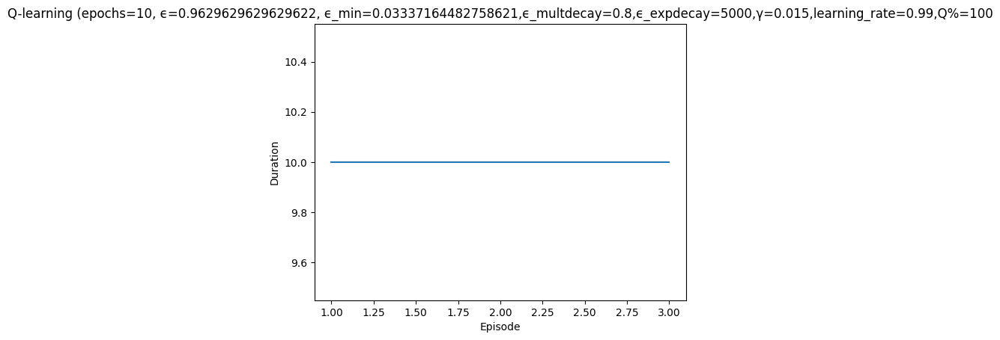

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 4/10 'Q-learning' ϵ=0.7661, γ=0.015,learning_rate=0.99,Q%=100


Episode 4|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

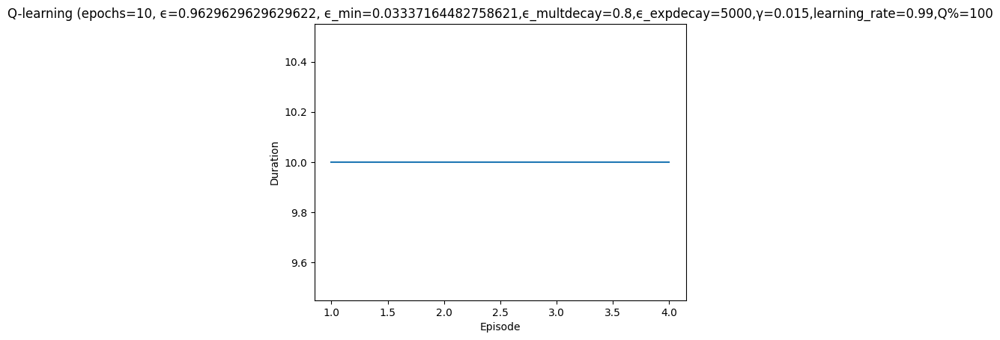

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 5/10 'Q-learning' ϵ=0.7646, γ=0.015,learning_rate=0.99,Q%=100


Episode 5|Iteration 5|reward:    1.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0d45460>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulatio

Episode 5|Iteration 6|reward:   -1.0|last_reward_at:    4|Elapsed Time: 0:00:00||

attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0d45460>)
Attacker reward: -2.0


Episode 5|Iteration 10|reward:  -24.0|last_reward_at:    7|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17d1d160>)
Attacker reward: 2.0
Step called with action: {'connect': array([0, 1, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


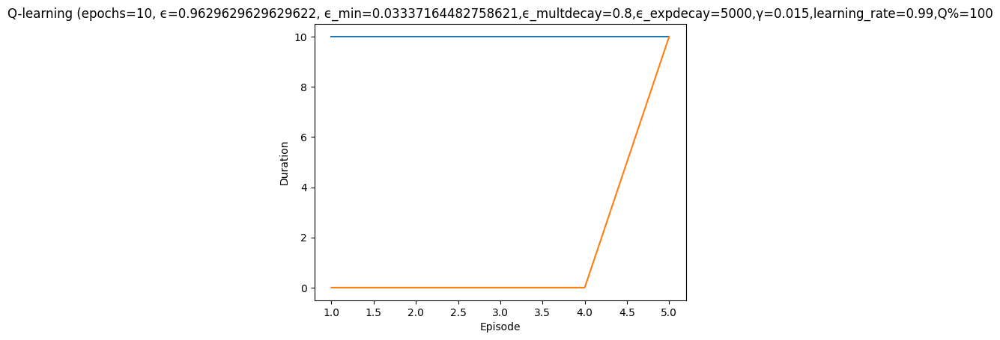

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 6/10 'Q-learning' ϵ=0.7631, γ=0.015,learning_rate=0.99,Q%=100


Episode 6|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 6|Iteration 10|reward:  -39.0|last_reward_at:    5|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7fa9c0c26730>)
Attacker reward: 2.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionRe

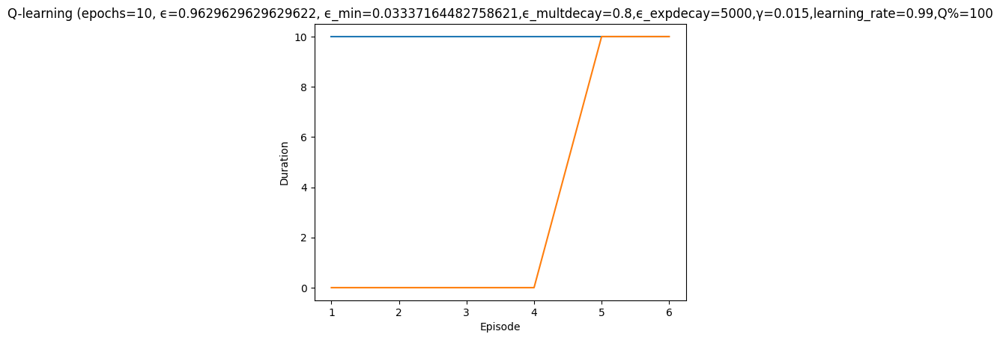

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 7/10 'Q-learning' ϵ=0.7616, γ=0.015,learning_rate=0.99,Q%=100


Episode 7|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 7|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}


Episode 7|Iteration 10|reward:  -14.0|last_reward_at:   10|Elapsed Time: 0:00:00||


Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0d1d7f0>)
Attacker reward: 14.0
Step called with action: {'remo

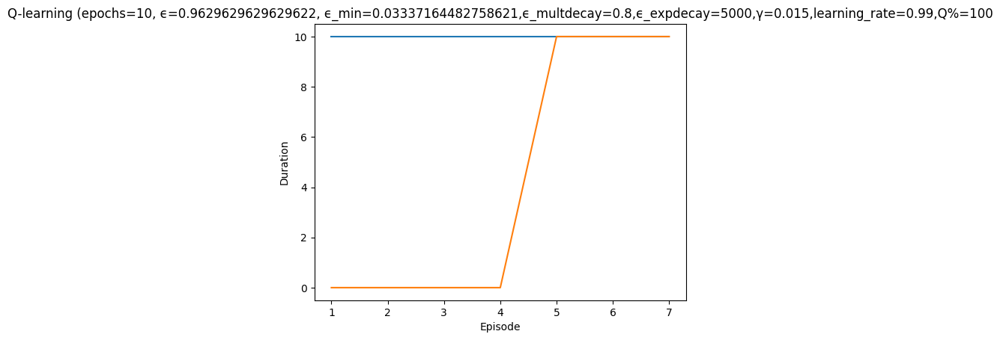

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 8/10 'Q-learning' ϵ=0.7602, γ=0.015,learning_rate=0.99,Q%=100


Episode 8|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 8|Iteration 10|reward:  -22.0|last_reward_at:    7|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials

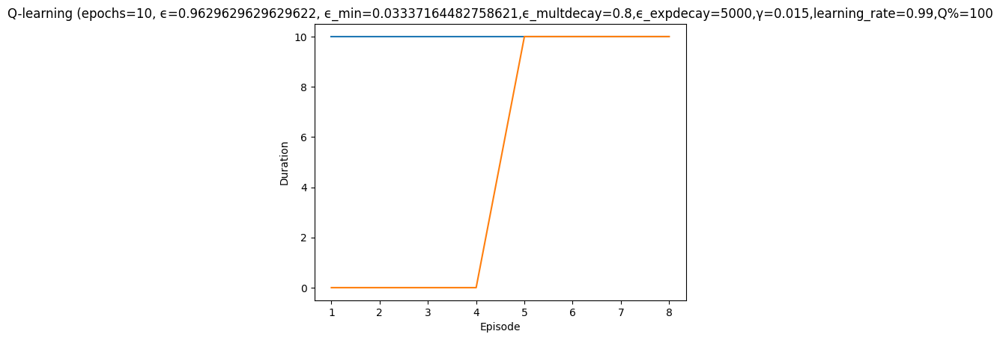

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 9/10 'Q-learning' ϵ=0.7587, γ=0.015,learning_rate=0.99,Q%=100


Episode 9|Iteration 7|reward:  -13.0|last_reward_at:    6|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 9|Iteration 10|reward:  -35.0|last_reward_at:    6|Elapsed Time: 0:00:00||


Attacker reward: -2.0
Step called with action: {'connect': array([0, 0, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
  Episode 9 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/2 (0.33)
    explore-remote: 0/5 (0.00)
    explore-connect: 0/2 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 2


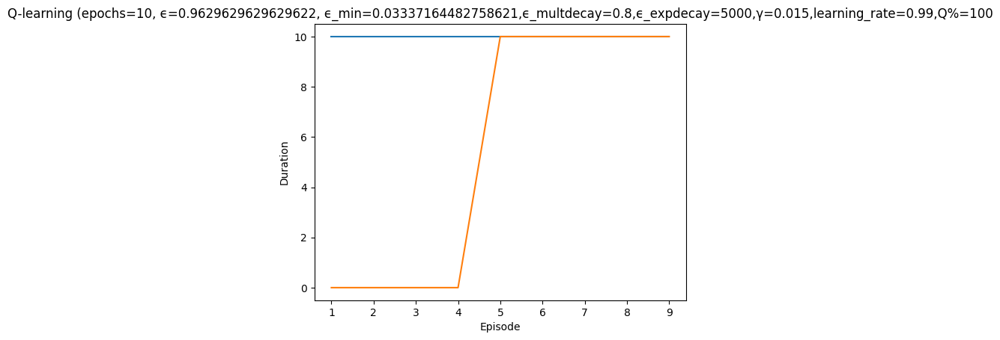

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 10/10 'Q-learning' ϵ=0.7573, γ=0.015,learning_rate=0.99,Q%=100


Episode 10|Iteration 5|reward:  -13.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0d1d0d0>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'connect': array([0, 0, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step calle

Episode 10|Iteration 10|reward:  -37.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa40259190>)
Attacker reward: 2.0
Step called with action: {'connect': array([0, 0, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step c

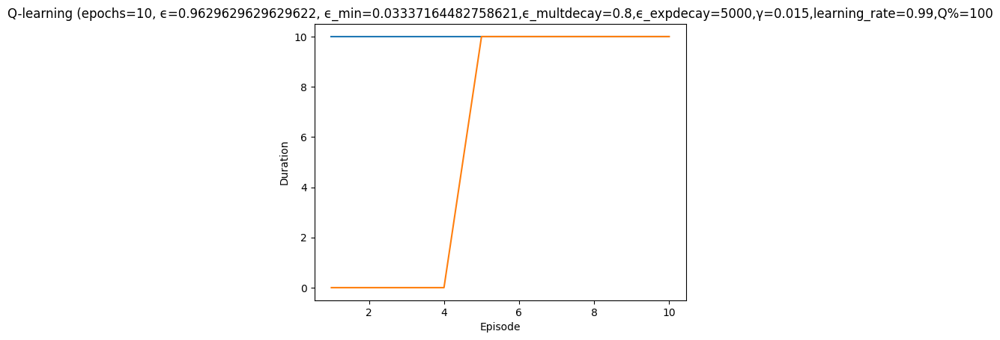

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


simulation ended


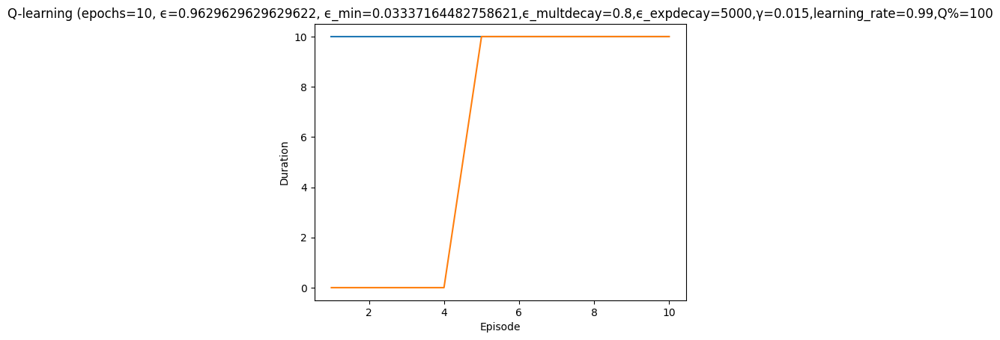

###### Q-learning
Learning with: episode_count=10,iteration_count=10,ϵ=0.9629629629629622,ϵ_min=0.03570880931034483, ϵ_multdecay=0.8,ϵ_expdecay=5000,γ=0.015,learning_rate=0.99,Q%=100
  ## Episode: 1/10 'Q-learning' ϵ=0.9630, γ=0.015,learning_rate=0.99,Q%=100


Episode 1|Iteration 10|reward:  -35.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

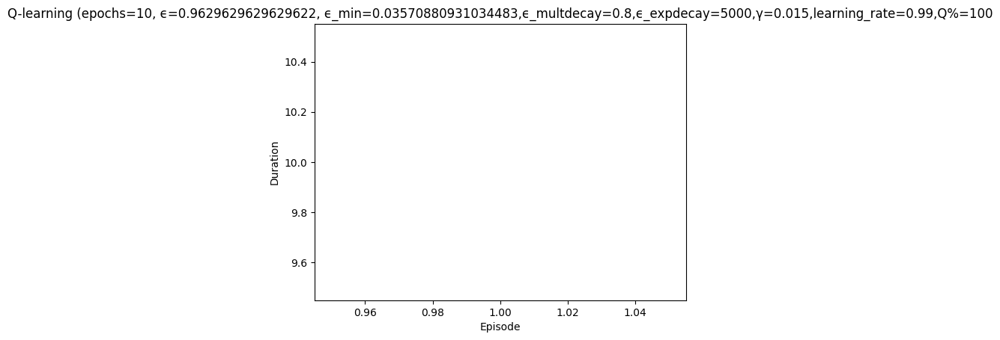

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 2/10 'Q-learning' ϵ=0.7690, γ=0.015,learning_rate=0.99,Q%=100


Episode 2|Iteration 6|reward:  -11.0|last_reward_at:    6|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 2|Iteration 8|reward:  -17.0|last_reward_at:    8|Elapsed Time: 0:00:00||

Attacker reward: -10.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa40356670>)
Attacker reward: 4.0
Step called with action: {'connect': array([0, 0, 3, 0], dtype=int32)}


Episode 2|Iteration 10|reward:  -32.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Executing attacker action {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
  Episode 2 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 1/6 (0.14)
    explore-connect: 0/2 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


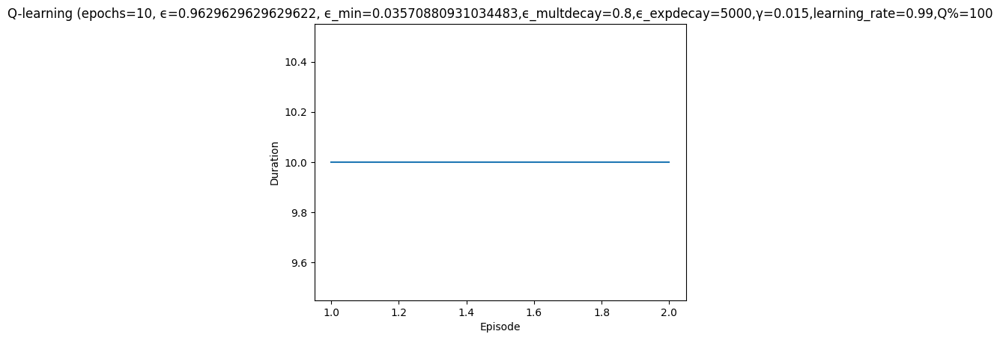

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 3/10 'Q-learning' ϵ=0.7676, γ=0.015,learning_rate=0.99,Q%=100


Episode 3|Iteration 8|reward:  -21.0|last_reward_at:    8|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 3|Iteration 9|reward:  -31.0|last_reward_at:    8|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 1, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10


Episode 3|Iteration 10|reward:  -29.0|last_reward_at:   10|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17d23040>)
Attacker reward: 2.0
  Episode 3 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 1/7 (0.12)
    explore-connect: 0/1 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


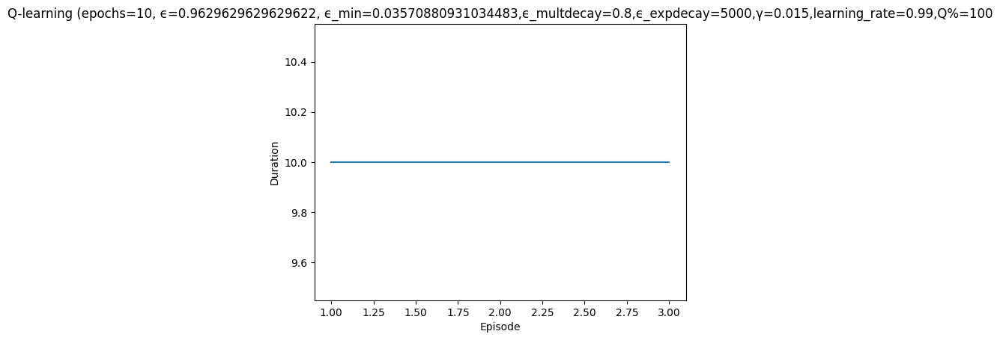

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 4/10 'Q-learning' ϵ=0.7661, γ=0.015,learning_rate=0.99,Q%=100


Episode 4|Iteration 8|reward:   90.0|last_reward_at:    8|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 4|Iteration 9|reward:   80.0|last_reward_at:    8|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 4|Iteration 10|reward:   75.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
  Episode 4 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 1/6 (0.14)
    explore-connect: 1/1 (0.50)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 1


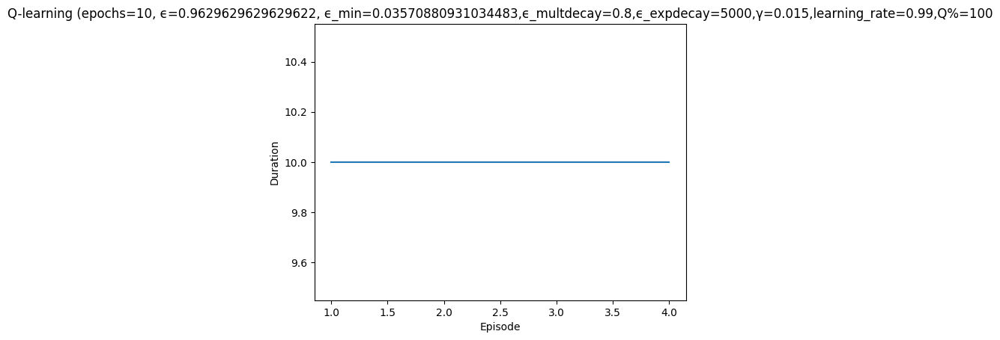

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[ScanExplorerRecentFiles, CrackKeepPassX, Scan...","[ProbeWindows, ProbeLinux]"


  ## Episode: 5/10 'Q-learning' ϵ=0.7646, γ=0.015,learning_rate=0.99,Q%=100


Episode 5|Iteration 4|reward:    3.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17cbde80>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Att

Episode 5|Iteration 4|reward:    3.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 0, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)


Episode 5|Iteration 10|reward:  -32.0|last_reward_at:    7|Elapsed Time: 0:00:00||


Attacker reward: -10.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17cbde80>)
Attacker reward: -2.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17d669a0>)
Attacker reward: 2.0
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 

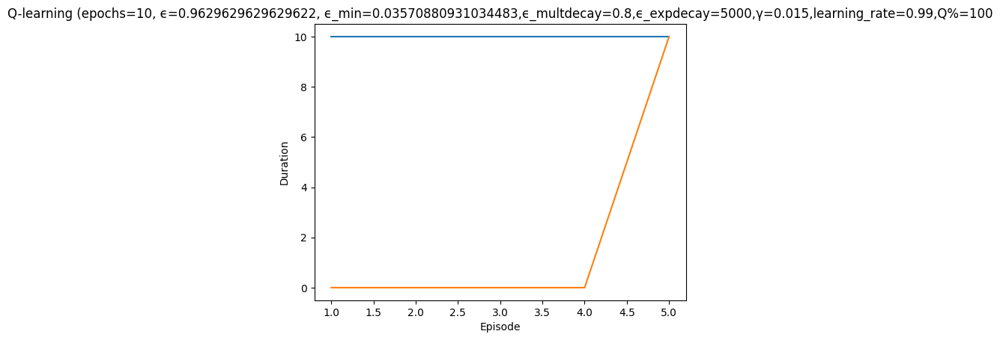

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 6/10 'Q-learning' ϵ=0.7631, γ=0.015,learning_rate=0.99,Q%=100


Episode 6|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}


Episode 6|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executi

Episode 6|Iteration 5|reward:  -25.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0


Episode 6|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

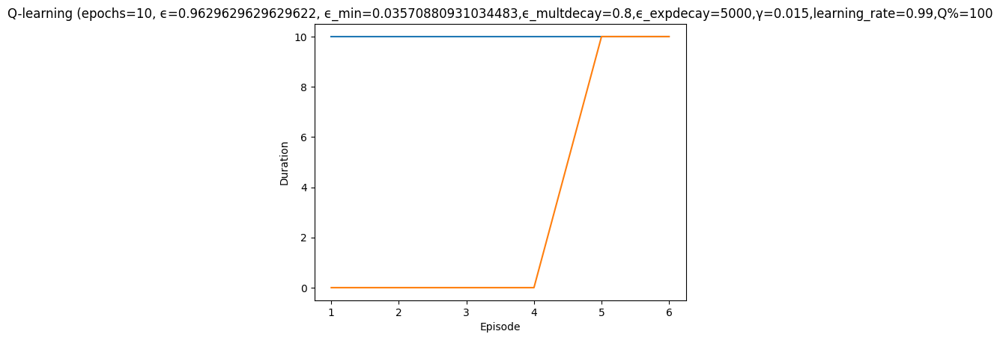

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 7/10 'Q-learning' ϵ=0.7617, γ=0.015,learning_rate=0.99,Q%=100


Episode 7|Iteration 3|reward:    4.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials

Episode 7|Iteration 4|reward:   -6.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 0, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}


Episode 7|Iteration 9|reward:  -36.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17db14f0>)
Attacker reward: 2.0
Step called with action: {'connect': array([0, 1, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attack

Episode 7|Iteration 10|reward:  -46.0|last_reward_at:    5|Elapsed Time: 0:00:00||


Executing attacker action {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
  Episode 7 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 1/2 (0.33)
    explore-connect: 0/5 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


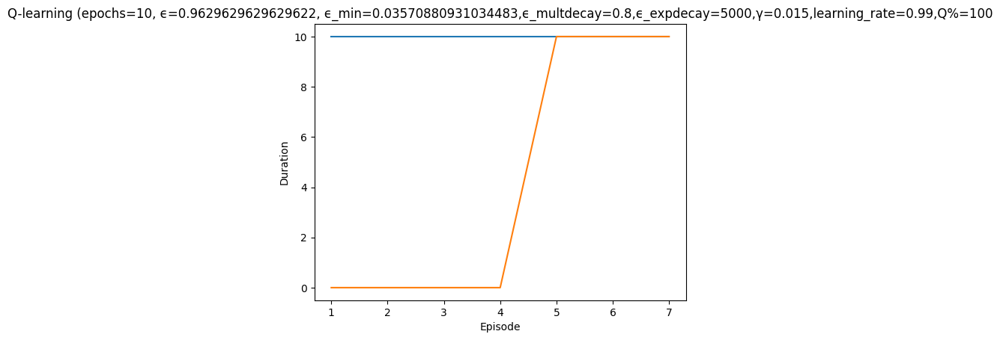

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 8/10 'Q-learning' ϵ=0.7602, γ=0.015,learning_rate=0.99,Q%=100


Episode 8|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 8|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action 

Episode 8|Iteration 6|reward:   -7.0|last_reward_at:    6|Elapsed Time: 0:00:00||

{'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17b1f430>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Exec

Episode 8|Iteration 7|reward:  -12.0|last_reward_at:    6|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 8|Iteration 10|reward:   73.0|last_reward_at:    9|Elapsed Time: 0:00:00||


Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=100.0, outcome=<cyberbattle.simulation.model.LateralMove object at 0x7faa40353190>)
Attacker reward: 100.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
  Ep

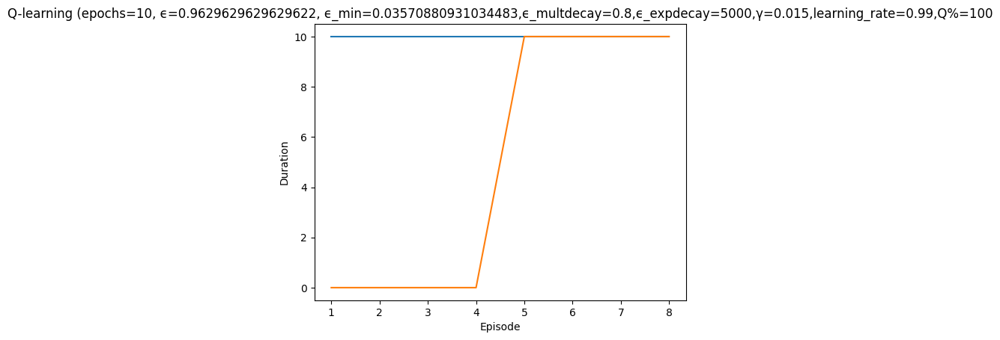

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[ScanExplorerRecentFiles, CrackKeepPassX, Scan...","[ProbeWindows, ProbeLinux]"


  ## Episode: 9/10 'Q-learning' ϵ=0.7587, γ=0.015,learning_rate=0.99,Q%=100


Episode 9|Iteration 5|reward:  -25.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 9|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

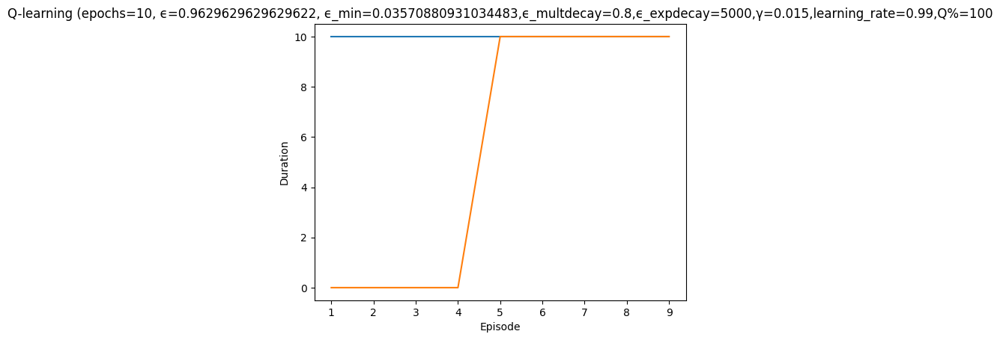

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 10/10 'Q-learning' ϵ=0.7573, γ=0.015,learning_rate=0.99,Q%=100


Episode 10|Iteration 4|reward:   -6.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0ca5f70>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Att

Episode 10|Iteration 10|reward:  -58.0|last_reward_at:    2|Elapsed Time: 0:00:00||


Executing attacker action {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7fa9c0ca5f70>)
Attacker reward: -2.0
Step called with action: {'connect': array([0, 1, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing 

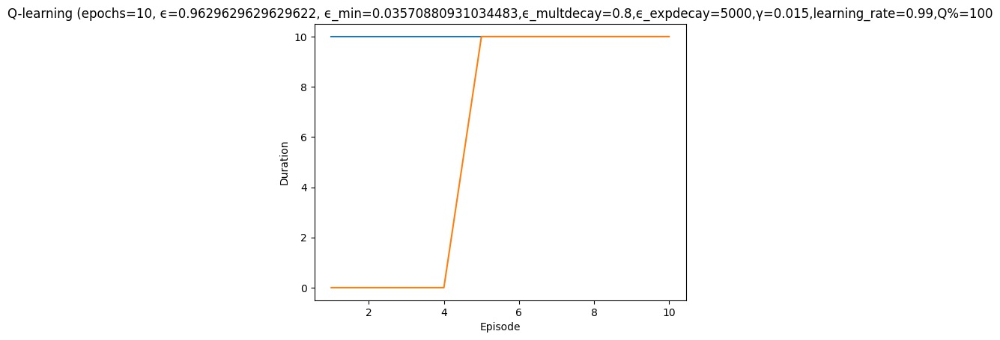

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


simulation ended


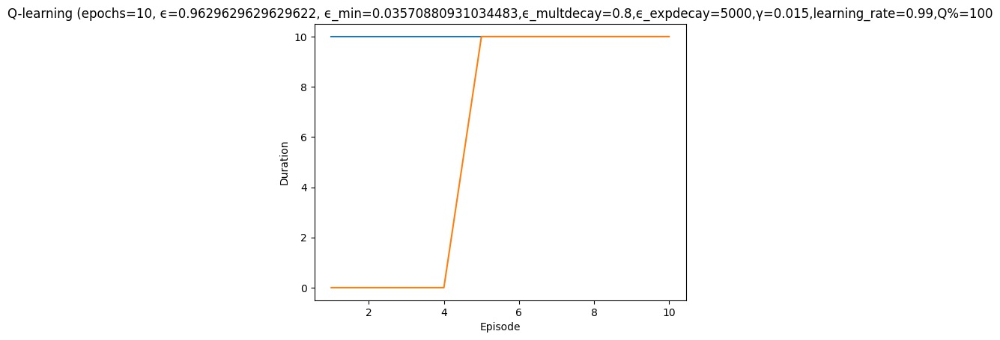

###### Q-learning
Learning with: episode_count=10,iteration_count=10,ϵ=0.9629629629629622,ϵ_min=0.038045973793103455, ϵ_multdecay=0.8,ϵ_expdecay=5000,γ=0.015,learning_rate=0.99,Q%=100
  ## Episode: 1/10 'Q-learning' ϵ=0.9630, γ=0.015,learning_rate=0.99,Q%=100


Episode 1|Iteration 10|reward:  -34.0|last_reward_at:    7|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

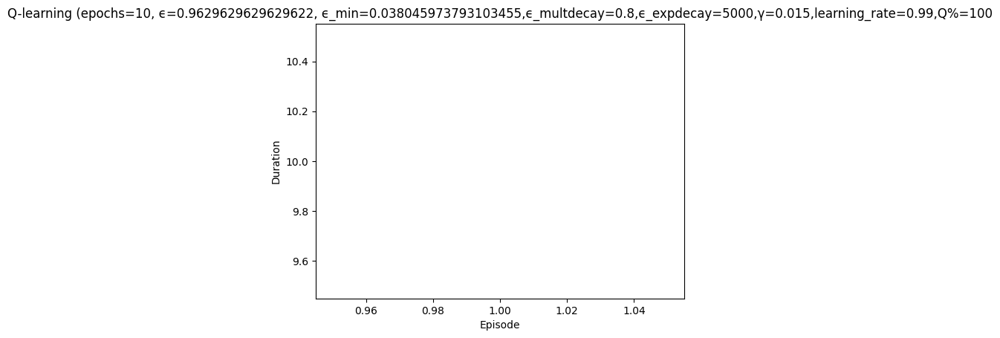

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 2/10 'Q-learning' ϵ=0.7690, γ=0.015,learning_rate=0.99,Q%=100


Episode 2|Iteration 7|reward:  -18.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa178f1370>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult

Episode 2|Iteration 8|reward:  -16.0|last_reward_at:    8|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17bd1280>)
Attacker reward: 2.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa178f1370>)
Attacker reward: -2.0


Episode 2|Iteration 10|reward:  -24.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7faa17bd1280>)
Attacker reward: -6.0
  Episode 2 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 2/4 (0.33)
    explore-connect: 0/2 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 1


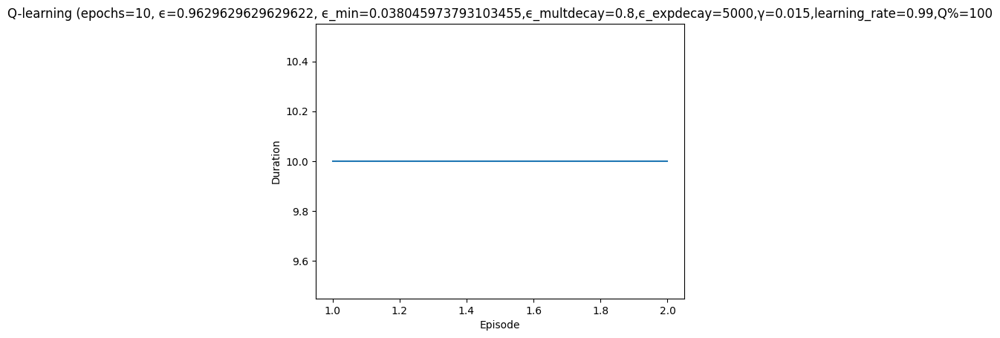

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 3/10 'Q-learning' ϵ=0.7676, γ=0.015,learning_rate=0.99,Q%=100


Episode 3|Iteration 2|reward:    9.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7faa17d2c1c0>)
Attacker reward: 14.0


Episode 3|Iteration 2|reward:    9.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 0, 3, 0], dtype=int32)}


Episode 3|Iteration 8|reward:  -19.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Executing attacker action {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'connect': array([0, 1, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa1789c520>)
Attacker reward: 4.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32

Episode 3|Iteration 10|reward:  -35.0|last_reward_at:    5|Elapsed Time: 0:00:00||

{'connect': array([0, 0, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa1789c520>)
Attacker reward: -6.0


  Episode 3 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 1/4 (0.20)
    explore-connect: 0/3 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


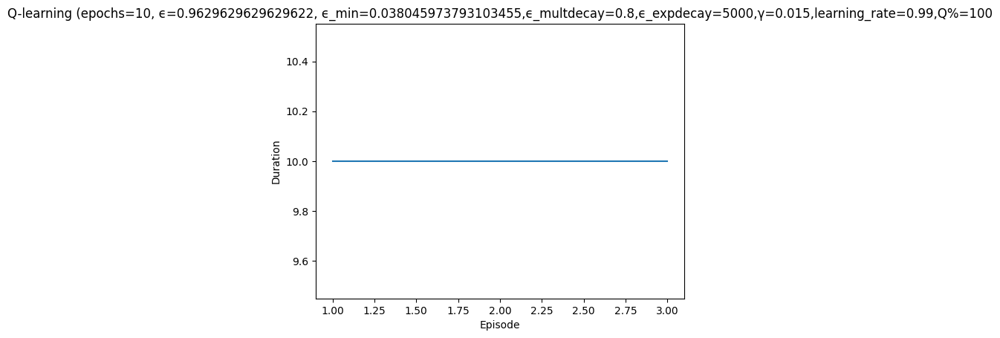

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 4/10 'Q-learning' ϵ=0.7661, γ=0.015,learning_rate=0.99,Q%=100


Episode 4|Iteration 1|reward:   -5.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 4|Iteration 2|reward:  -10.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}


Episode 4|Iteration 4|reward:  -20.0|last_reward_at: ----|Elapsed Time: 0:00:00||

attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 4|Iteration 5|reward:  -25.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)


Episode 4|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacke

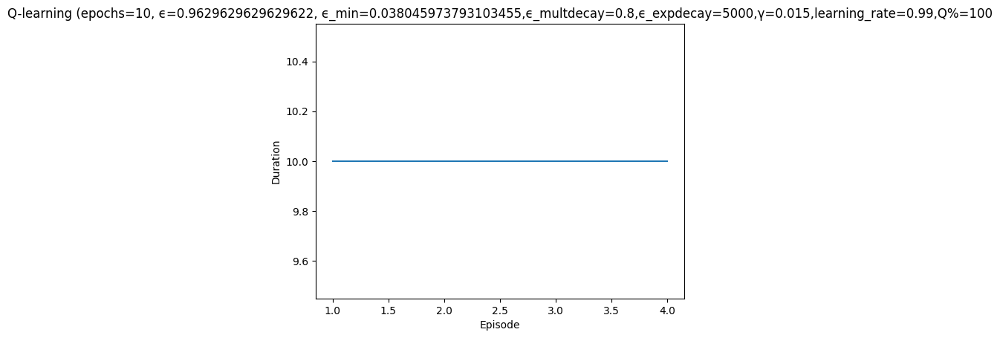

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]


  ## Episode: 5/10 'Q-learning' ϵ=0.7646, γ=0.015,learning_rate=0.99,Q%=100


Episode 5|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 5|Iteration 8|reward:  -21.0|last_reward_at:    8|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executi

Episode 5|Iteration 10|reward:  -41.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Executing attacker action {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
  Episode 5 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 0/7 (0.00)
    explore-connect: 0/2 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0


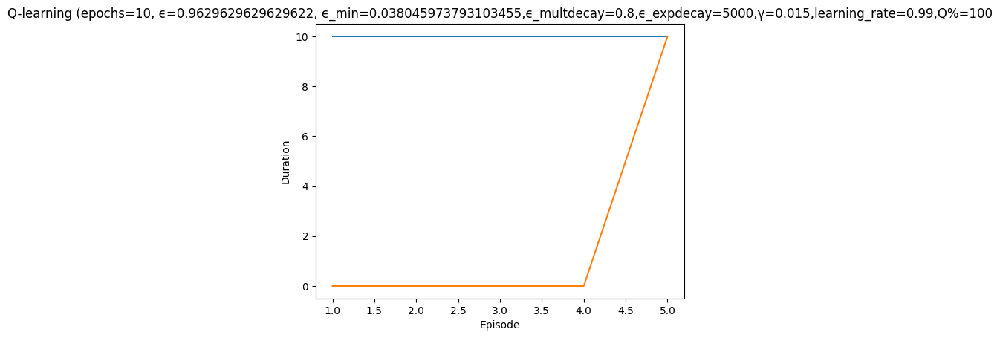

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 6/10 'Q-learning' ϵ=0.7632, γ=0.015,learning_rate=0.99,Q%=100


Episode 6|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}


Episode 6|Iteration 8|reward:  -28.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing a

Episode 6|Iteration 10|reward:  -34.0|last_reward_at:   10|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 1, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7faa17d66a90>)
Attacker reward: 4.0


  Episode 6 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 1/4 (0.20)
    explore-connect: 0/3 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 1


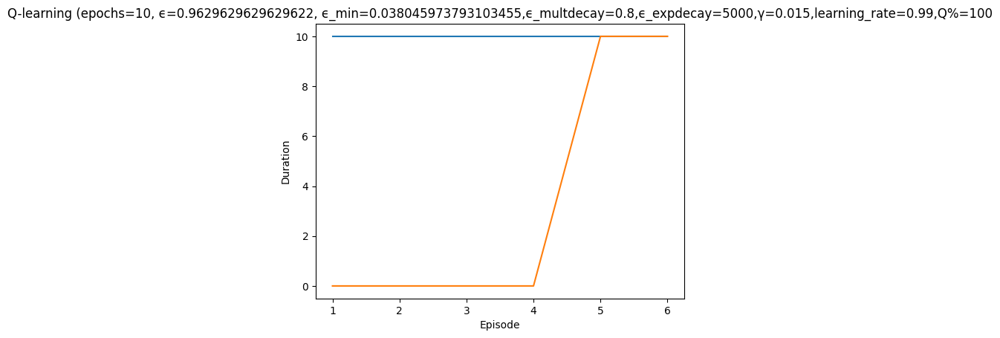

,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


  ## Episode: 7/10 'Q-learning' ϵ=0.7617, γ=0.015,learning_rate=0.99,Q%=100


Episode 7|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 7|Iteration 7|reward:  -17.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials

Episode 7|Iteration 10|reward:  -35.0|last_reward_at:    9|Elapsed Time: 0:00:00||


Step called with action: {'connect': array([0, 1, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7fa9c0b7b490>)
Attacker reward: 2.0
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
  Epis

In [ ]:
import numpy as np

# Parameter ranges
epsilon = 0.9629629629629622
#gamma=np.linspace(0.05,0.09,10)
gamma= 0.05888888888888889
#learning_rate=np.linspace(0.3,.35,10)
learning_rate=0.3222222222222222
#epsilon_decay=np.linspace(2333.33333,5000,20)
epsilon_exponential_decay=5000
epsilon_minimum=np.linspace(0.01,.07777777,30)
episode_count=50
iteration_count=200
epsilon_multdecay=np.linspace(0.75,0.875,10)


fixed_gamma=0.07
fixed_learning_rate = 0.325 
fixed_epsilon_decay = 3000
fixed_epsilon_minimum = 0.05
fixed_episode_count = 10
fixed_iteration_count = 10
fixed_epsilon_multdecay = 0.8

#function to perform grid search for a single parameter
def grid_search_single_param(parameter_name, parameter_range):
    best_reward = -np.inf
    best_value = None
    for value in parameter_range:
        kwargs = {
            'gym_env': gym_env,
            'environment_properties': ep,
            'epsilon': epsilon,
            'gamma': gamma,
            'learning_rate':learning_rate,
            'epsilon_exponential_decay':epsilon_exponential_decay,
            'episode_count': fixed_episode_count,
            'iteration_count': fixed_iteration_count,
            'epsilon_multdecay': fixed_epsilon_multdecay
        }
        kwargs[parameter_name] = value  
        
        current_reward = run_training_with_hyperparameters(**kwargs)
        if current_reward > best_reward:
            best_reward = current_reward
            best_value = value
    
    print(f"Best {parameter_name}: {best_value} with reward: {best_reward}")

#grid_search_single_param('epsilon', epsilon)
grid_search_single_param('epsilon_minimum', epsilon_minimum)


Best Reward: -2411.0
Best Hyperparameters: {'epsilon': 1.0, 'gamma': 0.030000000000000006, 'learning_rate': 0.35, 'epsilon_decay': 5000.0, 'epsilon_minimum': 0.011111111111111112, 'episode_count': 10, 'iteration_count': 50}